In [ ]:
from google.colab import drive
drive.mount('/content/drive')

## Libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## West Midlands Fire Service data
path='/content/drive/MyDrive/Seti/Fire/Code/'
data= pd.read_excel(path+'WMFS_dwel_fires.xlsx', parse_dates=['date_time'])

## Missing Values
missing = data.isnull().sum()
# Drop columns with more than 1000 missing values
data = data[missing[missing < 1000].index]
# Drop rows with missing values in the remaining columns
data.dropna(inplace=True)

## IMD
IMD=pd.read_excel(path+'File_1_-_IMD2019_Index_of_Multiple_Deprivation (1).xlsx', sheet_name='IMD2019')

## LSOAs
LSOA= pd.read_excel(path+"LSOA11_WD21_LAD21_EW_LU_V2.xlsx")
LSOA = LSOA[['LSOA11CD', 'WD21NM']]

## Population
# Population Estimates in the West Midlands region by Single Year of Age and Sex, Persons
population = pd.read_excel(path+"SAPE22DT10e-mid-2019-coa-unformatted-syoa-estimates-west-midlands.xlsx",
                           sheet_name="Mid-2019 Persons", skiprows=4)

# Extract population data for ages 16 to 64
population['16-64 Population'] = population.iloc[:, 19:67].sum(axis=1)

# Aggregate population data to LSOA level
pop_lsoa = population.groupby('LSOA11CD').agg({'All Ages': 'sum', '16-64 Population': 'sum'}).reset_index()

## Merge IMD, LSOA, Population
# *1* Join IMD and LSOA datasets
imd_ward = pd.merge(IMD, LSOA, left_on='LSOA code (2011)', right_on='LSOA11CD', how='inner')

# *2* Join IMD_Ward and population datasets
imd_population = pd.merge(imd_ward, pop_lsoa, on='LSOA11CD')

# Rename and select relevant columns
imd_population = imd_population[['Local Authority District name (2019)',
                                 'WD21NM', 'LSOA code (2011)',
                                 'Index of Multiple Deprivation (IMD) Rank',
                                 'Index of Multiple Deprivation (IMD) Decile',
                                 'All Ages', '16-64 Population']]

imd_population.columns = ['District', 'Ward', 'LSOA', 'IMD_Rank', 'IMD_Decile', 'Population', '16-64 Population']

# Filter datasets to only include districts in West Midlands
imd_population = imd_population[imd_population['District'].isin(data['district'])]

# Calculate total population and 16-64 population per district
district_info = imd_population.groupby('District').agg({
    'Population': 'sum',
    '16-64 Population': 'sum',
    'LSOA': 'nunique',
    'Ward': 'nunique'
}).reset_index()

# Rename columns
district_info.rename(columns={'Population': 'District Population',
                              '16-64 Population': 'District 16-64 Population',
                              'LSOA': 'LSOAs per District',
                              'Ward': 'Wards per District'}, inplace=True)

# Calculate average IMD per Ward
ward_info = imd_population.groupby('Ward').agg({
    'District': 'first',
    'IMD_Rank': 'mean'
}).round().reset_index()

ward_info.rename(columns={'IMD_Rank': 'IMD_rank_ward_avg'}, inplace=True)

# Merge District & Ward
imd_df = pd.merge(district_info, ward_info, on='District')

# Merge with West Midlands fire data
df = pd.merge(data, imd_df, left_on='ward', right_on='Ward', how='left')
df.drop(columns=['District', 'Ward'], inplace=True)

# Show final dataframe
df.head()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,date_time,month,year,hour,day,initial_inc_type,late_call,district,borough,command,...,hp_count,officer_count,other_count,inc_duration,working_smoke_alarm,District Population,District 16-64 Population,LSOAs per District,Wards per District,IMD_rank_ward_avg
0,2017-12-10 00:12:56,Dec,2017,0,Sun,HOUSE FIRE,N,Sandwell,Sandwell,Black Country South Command,...,0,0,0,00:59:00,Working smoke alarm,328450,201579,186,24,12715.0
1,2017-12-10 22:00:41,Dec,2017,22,Sun,HOUSE FIRE,N,Coventry,Coventry,Coventry & Solihull Command,...,0,0,0,06:04:00,Working smoke alarm,371521,246160,195,18,14844.0
2,2017-12-11 05:09:21,Dec,2017,5,Mon,FIRE,N,Walsall,Walsall,Black Country North Command,...,0,1,0,11:10:00,No Alarm,285478,170630,167,20,6249.0
3,2017-12-11 05:21:20,Dec,2017,5,Mon,LOW RISE,N,Birmingham,Birmingham North,Birmingham Command,...,0,0,0,00:25:00,Working smoke alarm,1141816,724631,639,69,6596.0
4,2017-12-11 06:22:55,Dec,2017,6,Mon,HOUSE FIRE,N,Birmingham,Birmingham North,Birmingham Command,...,0,0,0,01:37:00,No Alarm,1141816,724631,639,69,2902.0


In [ ]:
# English Indices of Deprivation 2019
# File 10 Local Authority District Summaries (lower-tier)

xls = pd.ExcelFile(path+'File_10_-_IoD2019_Local_Authority_District_Summaries__lower-tier__.xlsx')

# Sheets and columns to extract
sheets_columns = {
    'IMD': list(range(1, 12)),
    'Income': [1, 3, 4, 5, 9],
    'Employment': [1, 3, 4, 5, 9],
    'Education': [1, 3, 4, 5],
    'Health': [1, 3, 4, 5],
    'Crime': [1, 3, 4, 5],
    'Barriers': [1, 3, 4, 5],
    'Living': [1, 3, 4, 5],
}

imd_summary = None

# Iterate through excel file
for sheet, columns in sheets_columns.items():
    df_summary = pd.read_excel(xls, sheet_name=sheet, usecols=columns)

    # Filter to West Midlands districts
    df_filtered = df_summary[df_summary['Local Authority District name (2019)'].isin(data['district'])]

    if imd_summary is None:
        imd_summary = df_filtered
    else:
        imd_summary = pd.merge(imd_summary, df_filtered, on='Local Authority District name (2019)', how='outer')

imd_summary.rename(columns={'Local Authority District name (2019)': 'District'}, inplace=True)

imd_summary

,District,IMD - Average rank,IMD - Rank of average rank,IMD - Average score,IMD - Rank of average score,IMD - Proportion of LSOAs in most deprived 10% nationally,IMD - Rank of proportion of LSOAs in most deprived 10% nationally,IMD 2019 - Extent,IMD 2019 - Rank of extent,IMD 2019 - Local concentration,...,Health Deprivation and Disability - Rank of average score,Crime - Rank of average rank,Crime - Average score,Crime - Rank of average score,Barriers to Housing and Services - Rank of average rank,Barriers to Housing and Services - Average score,Barriers to Housing and Services - Rank of average score,Living Environment - Rank of average rank,Living Environment - Average score,Living Environment - Rank of average score
0,Birmingham,25319.55,6,38.067,7,0.4131,7,0.5792,4,32208.16,...,37,62,0.335,66,18,31.628,19,7,40.841,9
1,Coventry,19432.08,81,25.613,78,0.1436,64,0.2669,75,31409.97,...,76,110,0.068,117,155,21.224,165,35,32.103,43
2,Dudley,18193.88,104,24.103,91,0.1095,79,0.2708,73,30994.05,...,86,155,-0.131,157,303,12.587,302,88,24.049,98
3,Sandwell,25276.49,8,34.884,12,0.1989,44,0.5349,10,31705.52,...,33,72,0.277,75,156,20.866,172,9,37.156,17
4,Solihull,12510.31,206,17.370,171,0.1194,74,0.1708,118,31136.96,...,178,159,-0.138,160,150,21.459,159,252,13.257,250
5,Walsall,22152.64,31,31.555,25,0.2635,22,0.4844,15,31611.53,...,53,89,0.171,93,229,18.097,234,58,26.678,68
6,Wolverhampton,23274.95,19,32.102,24,0.2089,38,0.4828,16,31347.16,...,48,109,0.066,119,163,20.630,178,60,26.558,70


In [ ]:
imd_summary.columns

Index(['District', 'IMD - Average rank ', 'IMD - Rank of average rank ',
       'IMD - Average score ', 'IMD - Rank of average score ',
       'IMD - Proportion of LSOAs in most deprived 10% nationally ',
       'IMD - Rank of proportion of LSOAs in most deprived 10% nationally ',
       'IMD 2019 - Extent ', 'IMD 2019 - Rank of extent ',
       'IMD 2019 - Local concentration ',
       'IMD 2019 - Rank of local concentration ',
       'Income - Rank of average rank ', 'Income - Average score ',
       'Income - Rank of average score ', 'Rank of Income Scale',
       'Employment - Rank of average rank ', 'Employment - Average score ',
       'Employment - Rank of average score ', 'Rank of Employment Scale',
       'Education, Skills and Training - Rank of average rank ',
       'Education, Skills and Training - Average score ',
       'Education, Skills and Training - Rank of average score ',
       'Health Deprivation and Disability - Rank of average rank ',
       'Health Deprivation

In [ ]:
#imd_.rename(columns={'IMD_Rank': 'IMD_rank_ward_avg'}, inplace=True)

In [ ]:
# Save the merged imd dataset to a new file
imd_summary.to_excel('imd_summary.xlsx', index=False)

In [ ]:
# Subset data to year 20--
#df_year = df[df['year'] == 2019]
df_year = data[data['year'].isin([2018, 2019])]

# Fire per district
district_frq= df_year['district'].value_counts().reset_index()
district_frq.columns = ['District', 'Number of Fires']

In [ ]:
district_info = pd.merge(district_info, district_frq, on='District')

In [ ]:
district_info.head()

,District,District Population,District 16-64 Population,LSOAs per District,Wards per District,Number of Fires
0,Birmingham,1141816,724631,639,69,1633
1,Coventry,371521,246160,195,18,406
2,Dudley,321596,190311,201,24,374
3,Sandwell,328450,201579,186,24,366
4,Solihull,216374,125975,134,17,183


In [ ]:
# Calculate fire incidents per 100,000 population
district_info['Fires per 100k Population'] = (district_info['Number of Fires'] / district_info['District Population']) * 100000
district_info['Fires per 100k (16-64 year) Population'] = (district_info['Number of Fires'] / district_info['District 16-64 Population']) * 100000

# Sort by fire incidents per 100,000 population in descending order
district_info.sort_values(by='Fires per 100k Population', ascending=False, inplace=True)

# Merge with IMD summary
district_info = pd.merge(district_info, imd_summary, on='District')

# Display the updated district_info dataframe
district_info


,District,District Population,District 16-64 Population,LSOAs per District,Wards per District,Number of Fires,Fires per 100k Population,Fires per 100k (16-64 year) Population,IMD - Average rank,IMD - Rank of average rank,...,Health Deprivation and Disability - Rank of average score,Crime - Rank of average rank,Crime - Average score,Crime - Rank of average score,Barriers to Housing and Services - Rank of average rank,Barriers to Housing and Services - Average score,Barriers to Housing and Services - Rank of average score,Living Environment - Rank of average rank,Living Environment - Average score,Living Environment - Rank of average score
0,Wolverhampton,263357,160577,158,20,396,150.366233,246.610660,23274.95,19,...,48,109,0.066,119,163,20.630,178,60,26.558,70
1,Birmingham,1141816,724631,639,69,1633,143.017789,225.356078,25319.55,6,...,37,62,0.335,66,18,31.628,19,7,40.841,9
2,Walsall,285478,170630,167,20,355,124.352840,208.052511,22152.64,31,...,53,89,0.171,93,229,18.097,234,58,26.678,68
3,Dudley,321596,190311,201,24,374,116.294979,196.520432,18193.88,104,...,86,155,-0.131,157,303,12.587,302,88,24.049,98
4,Sandwell,328450,201579,186,24,366,111.432486,181.566532,25276.49,8,...,33,72,0.277,75,156,20.866,172,9,37.156,17
5,Coventry,371521,246160,195,18,406,109.280498,164.933377,19432.08,81,...,76,110,0.068,117,155,21.224,165,35,32.103,43
6,Solihull,216374,125975,134,17,183,84.575781,145.266918,12510.31,206,...,178,159,-0.138,160,150,21.459,159,252,13.257,250


In [ ]:
district_info.columns

Index(['District', 'District Population', 'District 16-64 Population',
       'LSOAs per District', 'Wards per District', 'Number of Fires',
       'Fires per 100k Population', 'Fires per 100k (16-64 year) Population',
       'IMD - Average rank ', 'IMD - Rank of average rank ',
       'IMD - Average score ', 'IMD - Rank of average score ',
       'IMD - Proportion of LSOAs in most deprived 10% nationally ',
       'IMD - Rank of proportion of LSOAs in most deprived 10% nationally ',
       'IMD 2019 - Extent ', 'IMD 2019 - Rank of extent ',
       'IMD 2019 - Local concentration ',
       'IMD 2019 - Rank of local concentration ',
       'Income - Rank of average rank ', 'Income - Average score ',
       'Income - Rank of average score ', 'Rank of Income Scale',
       'Employment - Rank of average rank ', 'Employment - Average score ',
       'Employment - Rank of average score ', 'Rank of Employment Scale',
       'Education, Skills and Training - Rank of average rank ',
       'Edu

In [ ]:
district_info.to_excel( 'District_info.xlsx', index=False)

# plot based on 100k Population

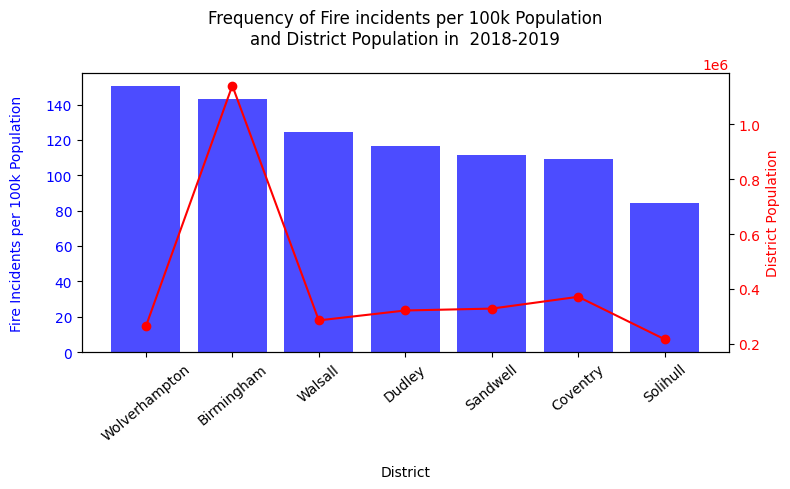

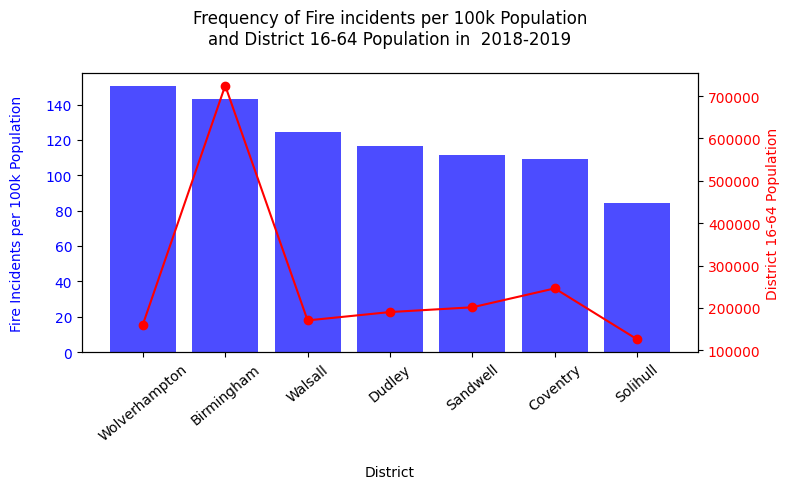

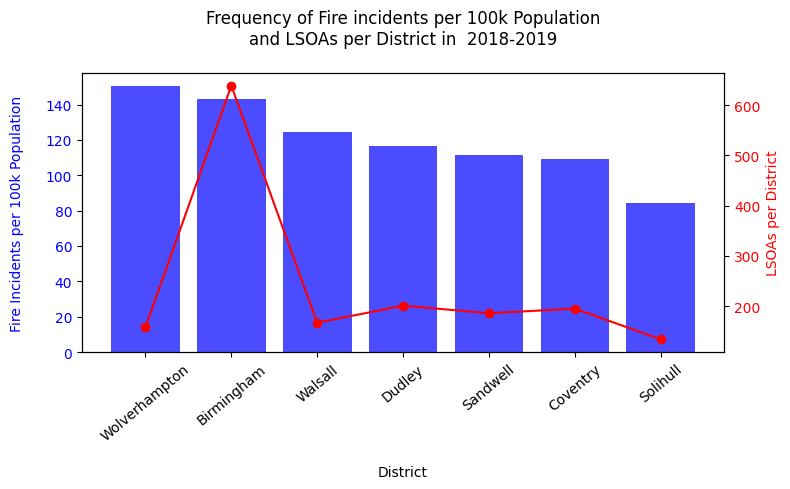

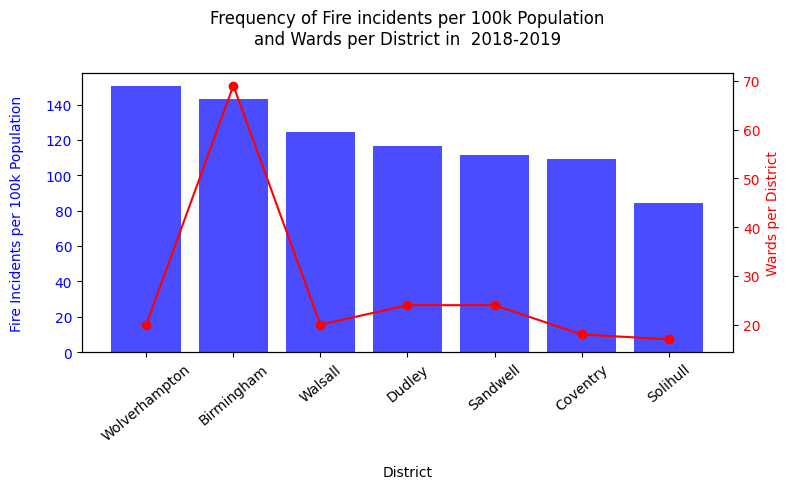

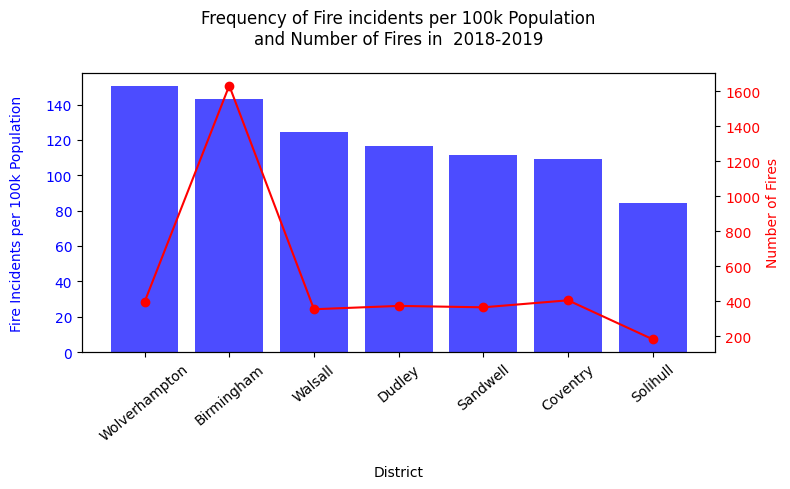

...

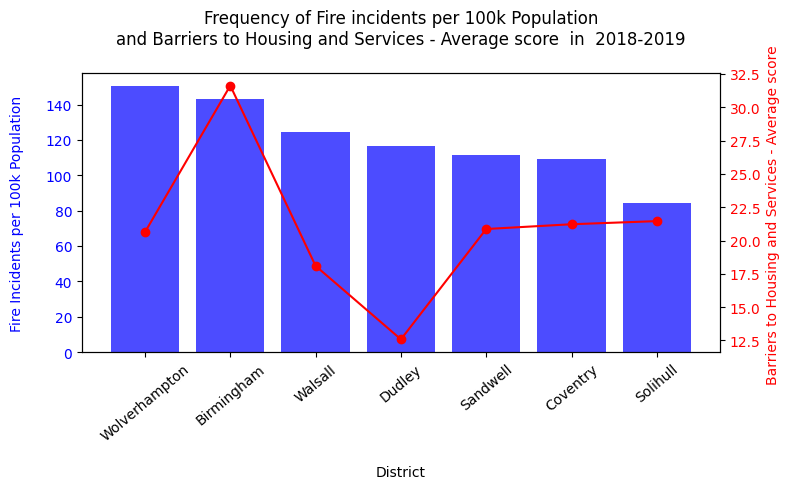

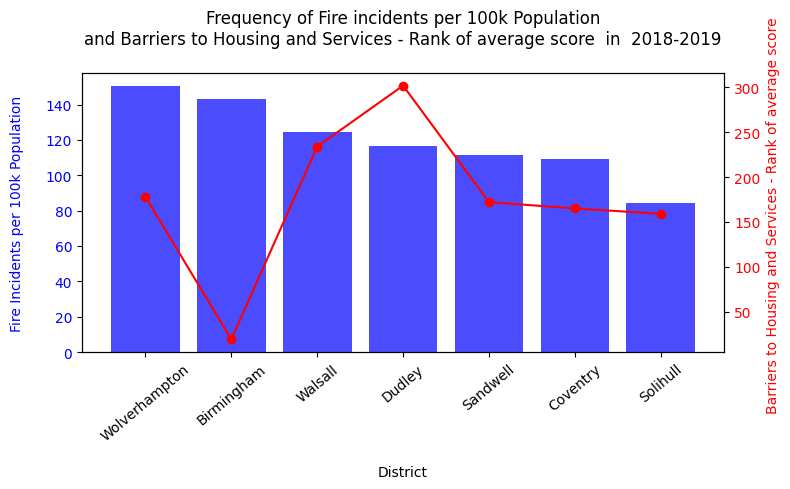

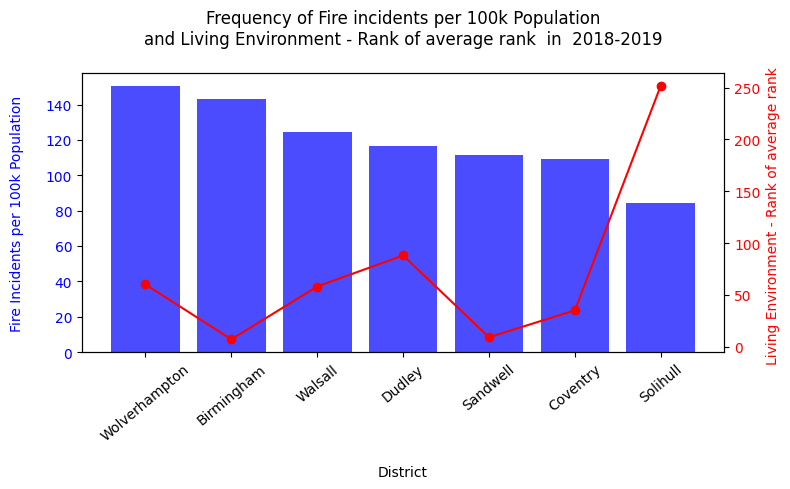

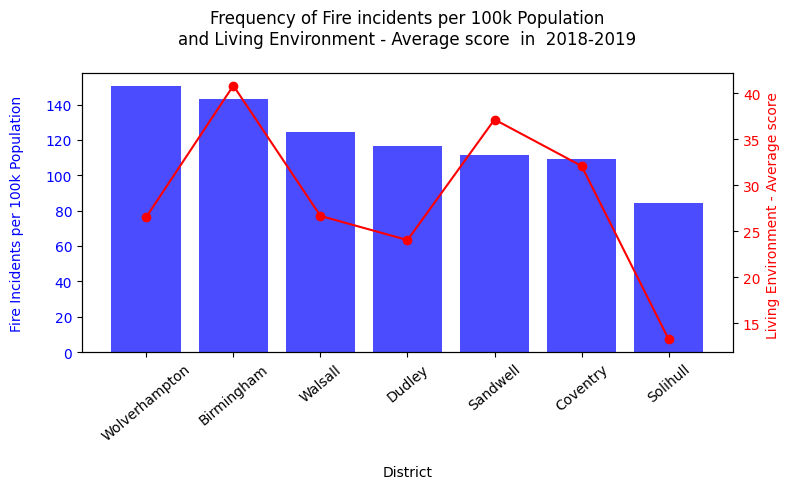

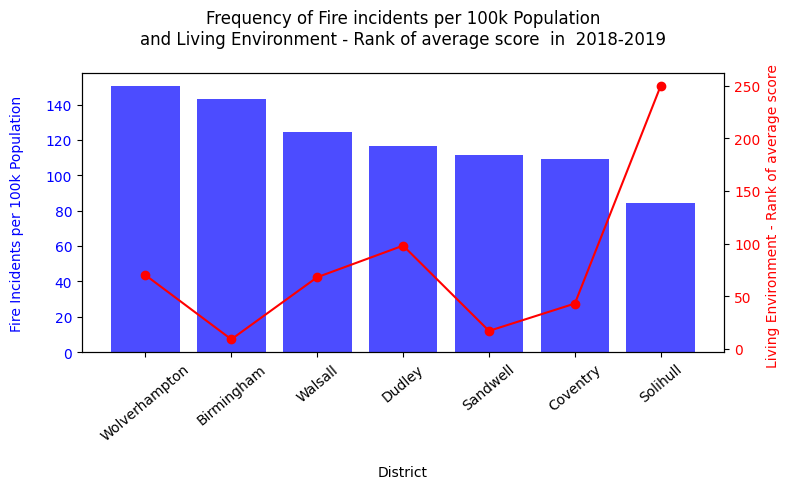

In [ ]:
# Plot
vars = [col for col in district_info.columns if col not in ['District', 'Fires per 100k Population']]

def plot_data(col_name):
    fig, ax1 = plt.subplots(figsize=(8, 5))
    # Fire
    ax1.bar(district_info['District'], district_info['Fires per 100k Population'], color='b', alpha=0.7)
    ax1.set_xlabel('\nDistrict')
    ax1.set_ylabel('Fire Incidents per 100k Population\n', color='b')
    ax1.tick_params(axis='y', labelcolor='b')
    plt.xticks(rotation=40)
    # IMD
    ax2 = ax1.twinx()
    ax2.plot(district_info['District'], district_info[col_name], color='r', marker='o')
    ax2.set_ylabel(col_name, color='r')
    ax2.tick_params(axis='y', labelcolor='r')
    plt.title('Frequency of Fire incidents per 100k Population\nand '+col_name+' in  2018-2019\n')
    fig.tight_layout()
    plt.show()

for col_name in vars:
    plot_data(col_name)

# Customised plot based on 100k Population

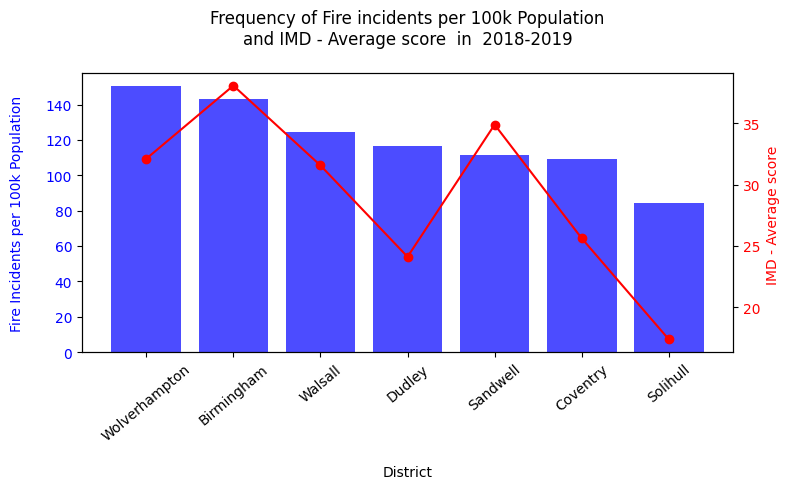

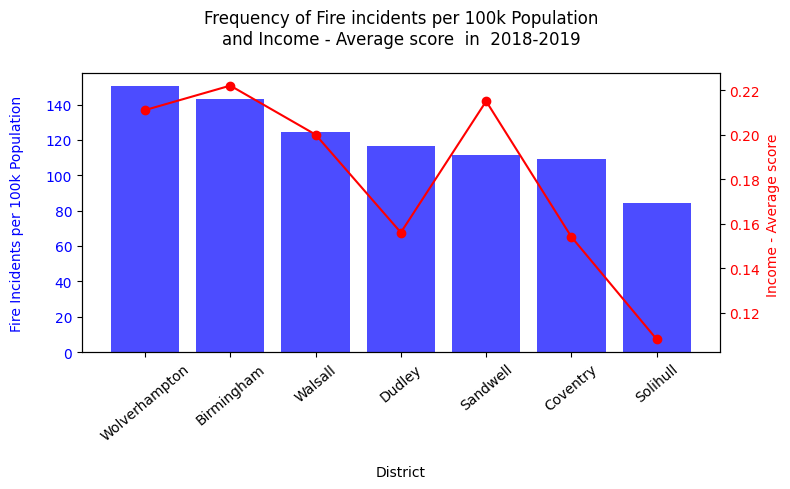

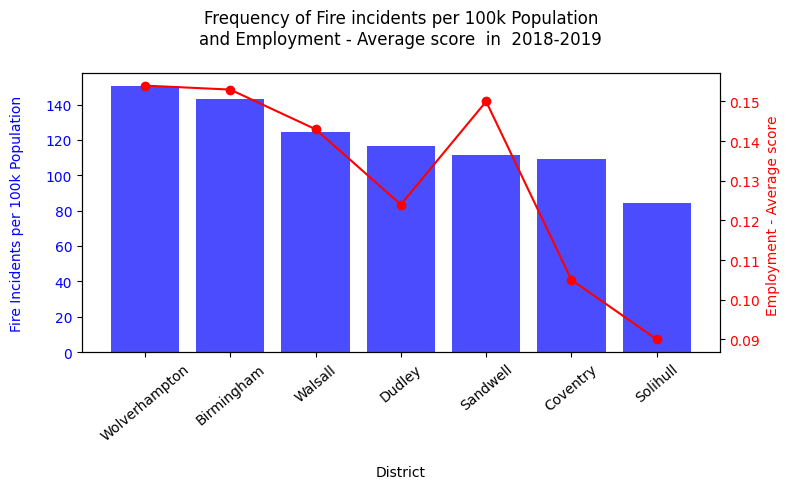

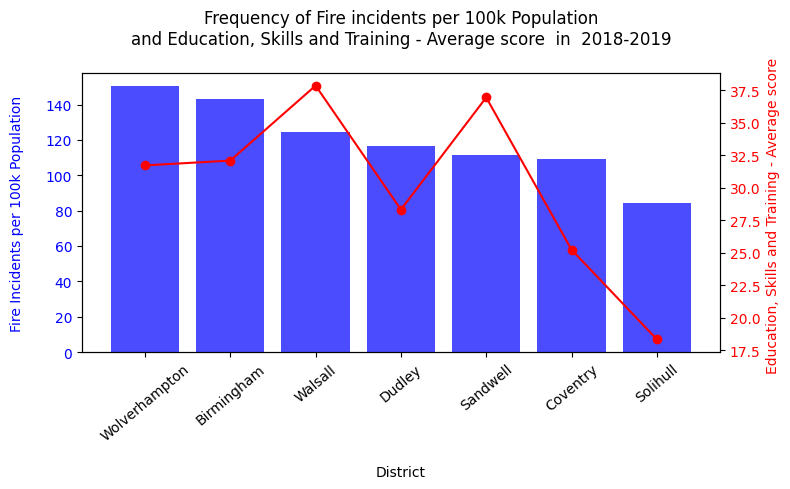

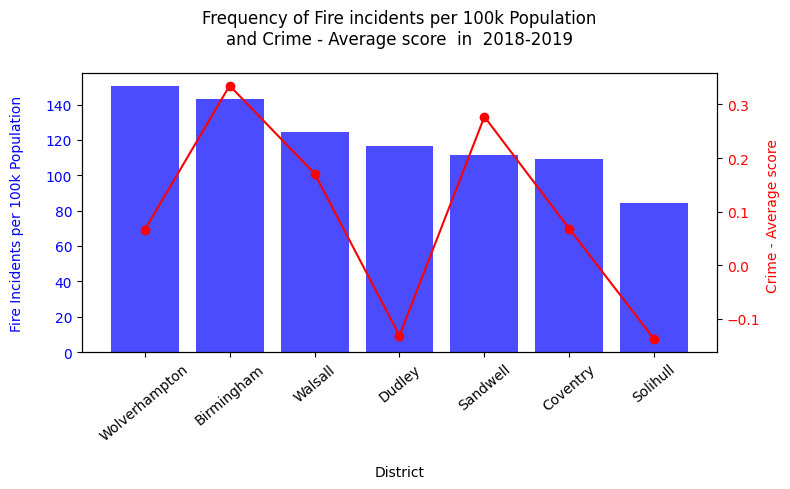

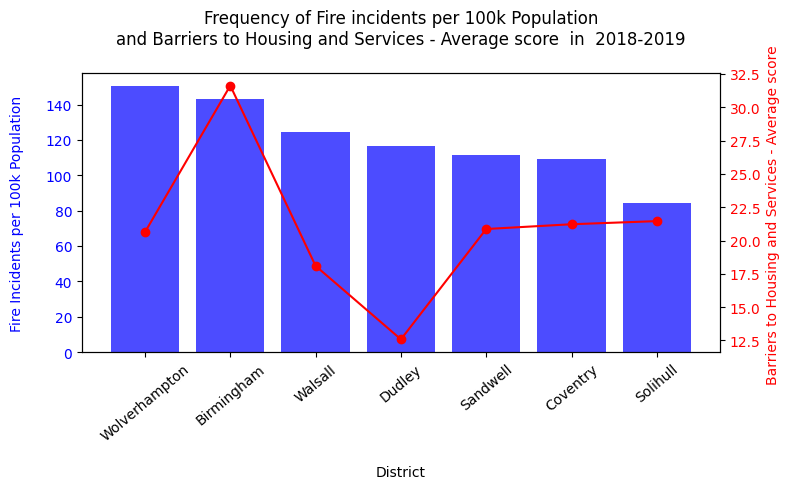

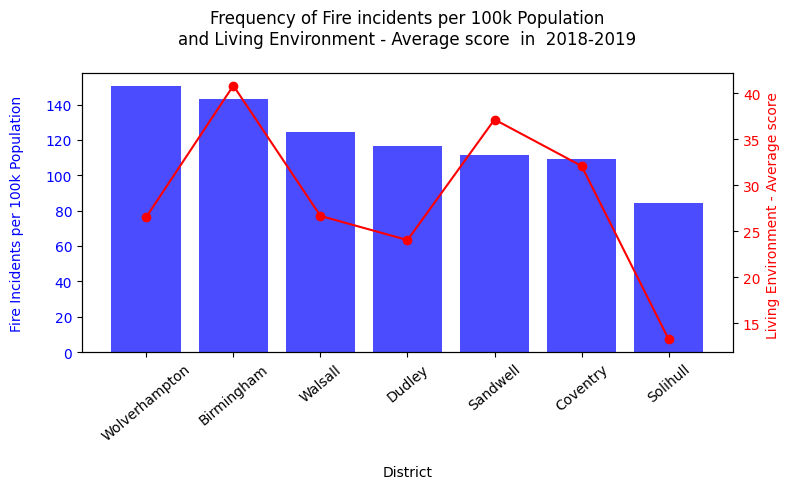

In [ ]:
# Plot
#vars = [col for col in district_info.columns if col not in ['District', 'Fires per 100k Population']]
vars = ['IMD - Average score ','Income - Average score ' ,'Employment - Average score ','Education, Skills and Training - Average score ','Crime - Average score ','Barriers to Housing and Services - Average score ','Living Environment - Average score ']

def plot_data(col_name):
    fig, ax1 = plt.subplots(figsize=(8, 5))
    # Fire
    ax1.bar(district_info['District'], district_info['Fires per 100k Population'], color='b', alpha=0.7)
    ax1.set_xlabel('\nDistrict')
    ax1.set_ylabel('Fire Incidents per 100k Population\n', color='b')
    ax1.tick_params(axis='y', labelcolor='b')
    plt.xticks(rotation=40)
    # IMD
    ax2 = ax1.twinx()
    ax2.plot(district_info['District'], district_info[col_name], color='r', marker='o')
    ax2.set_ylabel(col_name, color='r')
    ax2.tick_params(axis='y', labelcolor='r')
    plt.title('Frequency of Fire incidents per 100k Population\nand '+col_name+' in  2018-2019\n')
    fig.tight_layout()
    plt.show()

for col_name in vars:
    plot_data(col_name)

# Customised plot based on 100k Population(normalise fire incident and IMD scores)

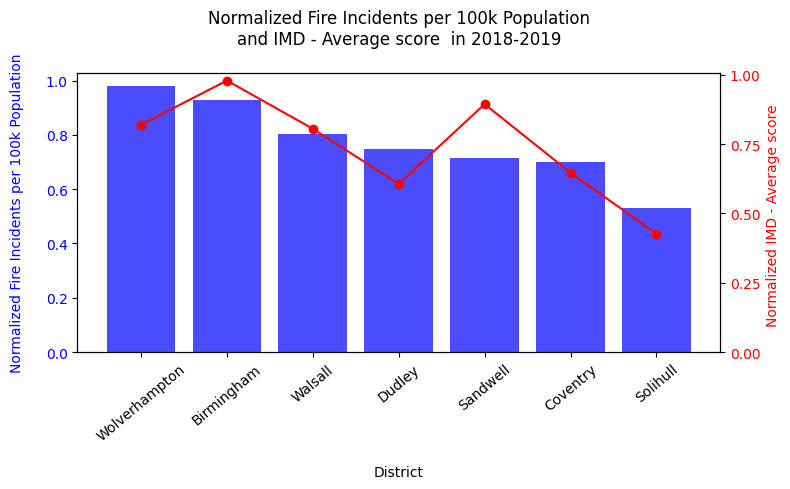

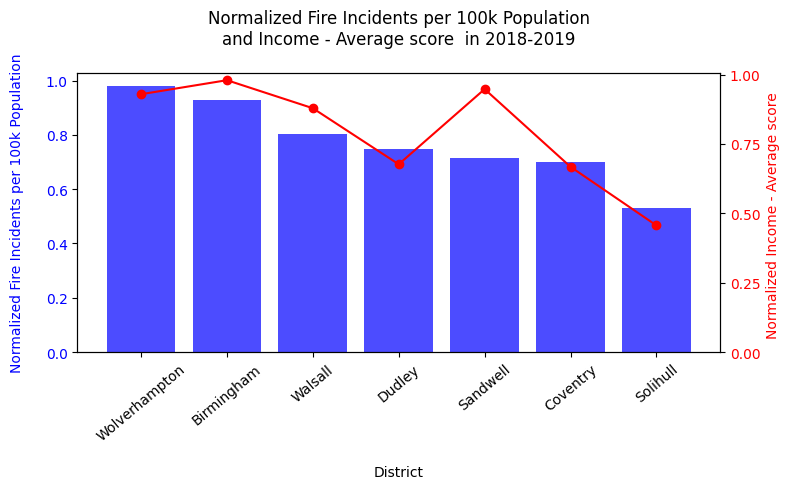

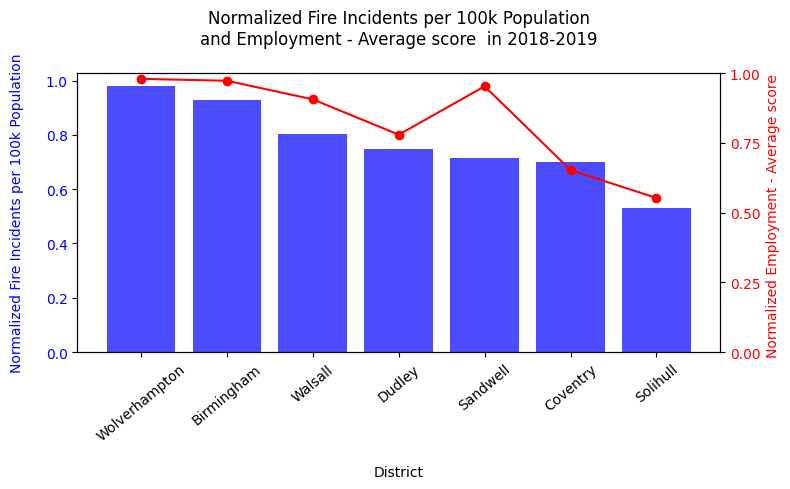

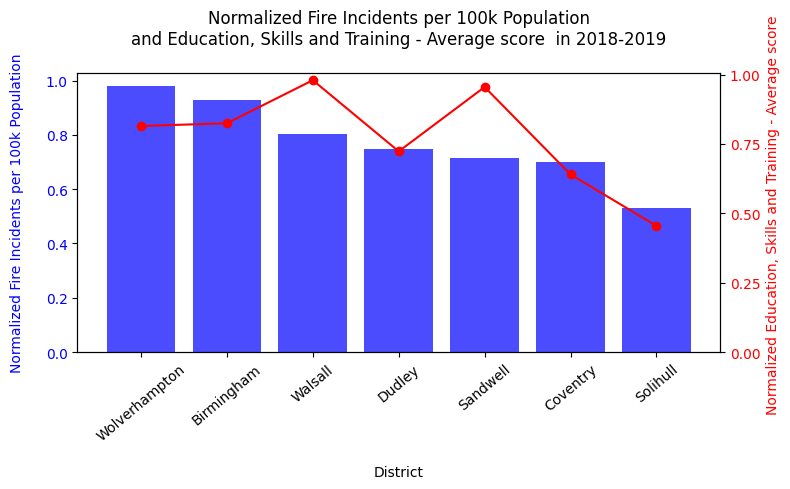

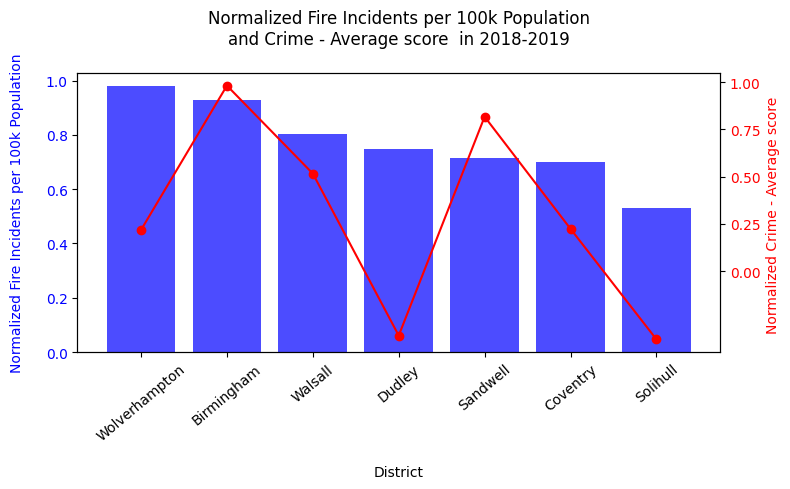

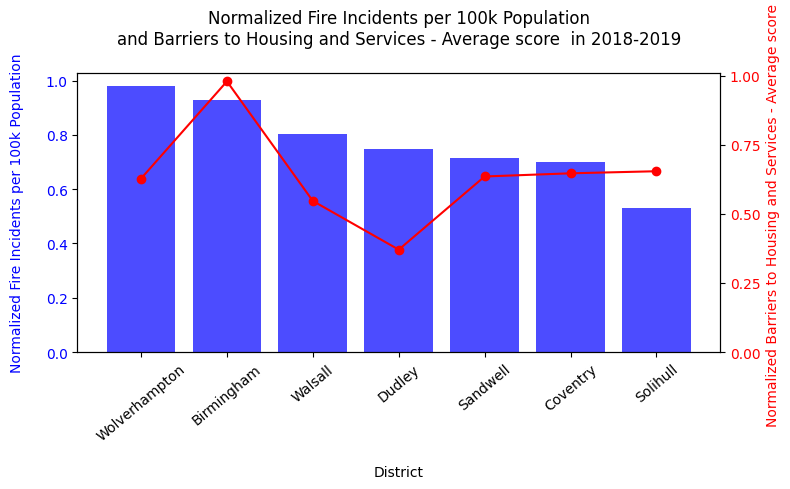

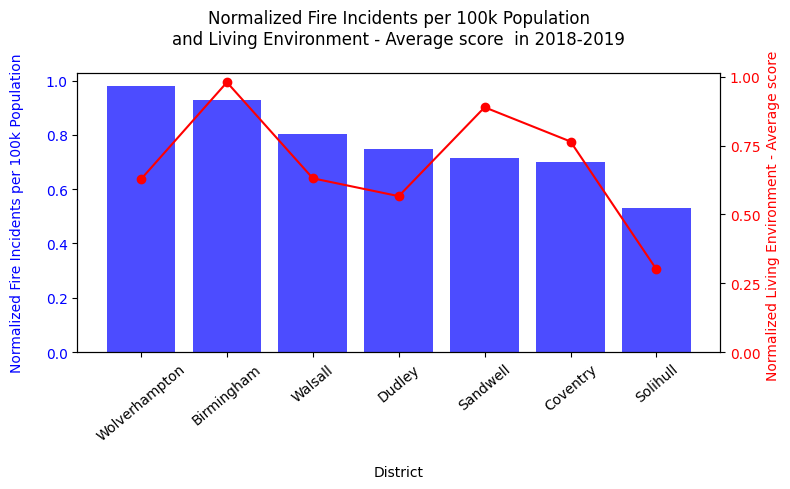

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

vars = ['IMD - Average score ', 'Income - Average score ', 'Employment - Average score ',
        'Education, Skills and Training - Average score ', 'Crime - Average score ',
        'Barriers to Housing and Services - Average score ', 'Living Environment - Average score ']

def normalize(data):
    """Function to normalize data between 0 and 1."""

    return (data - np.min(data)*0.08) / (np.max(data)*1.02 - np.min(data)*0.08)

def plot_data(col_name):
    fig, ax1 = plt.subplots(figsize=(8, 5))

    # Normalizing the data for Fire incidents and IMD scores
    fires_normalized = normalize(district_info['Fires per 100k Population'])
    imd_normalized = normalize(district_info[col_name])

    # Plot Fire incidents (ax1)
    ax1.bar(district_info['District'], fires_normalized, color='b', alpha=0.7)
    ax1.set_xlabel('\nDistrict')
    ax1.set_ylabel('Normalized Fire Incidents per 100k Population\n', color='b')
    ax1.tick_params(axis='y', labelcolor='b')
    plt.xticks(rotation=40)

    # Plot IMD-related score (ax2)
    ax2 = ax1.twinx()
    ax2.plot(district_info['District'], imd_normalized, color='r', marker='o')
    ax2.set_ylabel(f'Normalized {col_name}', color='r')
    ax2.tick_params(axis='y', labelcolor='r')



    #ax1.set_yticks(np.linspace(0, 1, 5))  # Set ticks for the left y-axis
    ax2.set_yticks(np.linspace(0, 1, 5))  # Set matching ticks for the right y-axis



    # Set title and adjust layout
    plt.title(f'Normalized Fire Incidents per 100k Population\nand {col_name} in 2018-2019\n')
    fig.tight_layout()
    plt.show()

# Loop through each variable and plot
for col_name in vars:
    plot_data(col_name)


# ****Customised plot based on 100k Population (normalise only IMD scores)

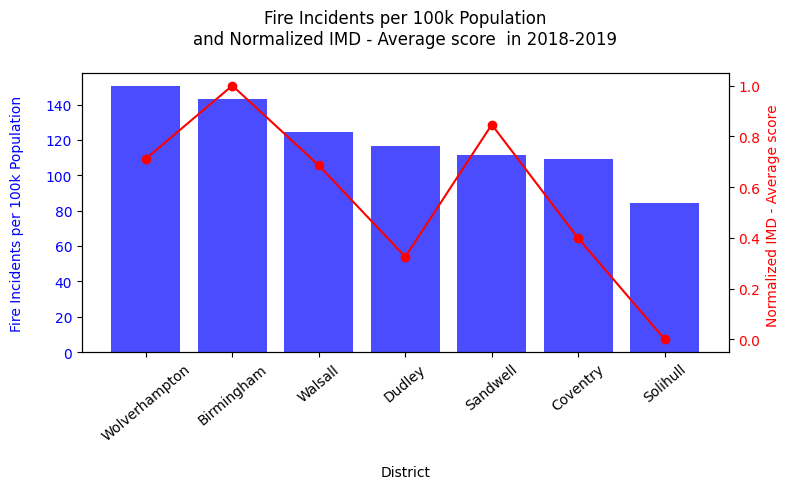

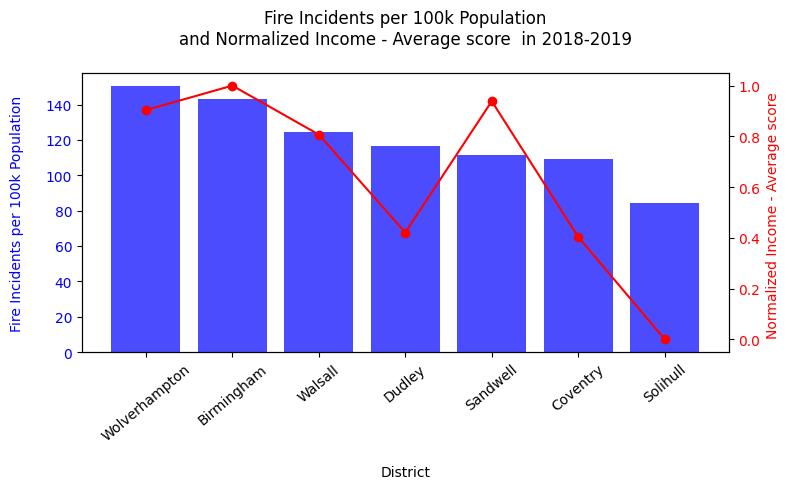

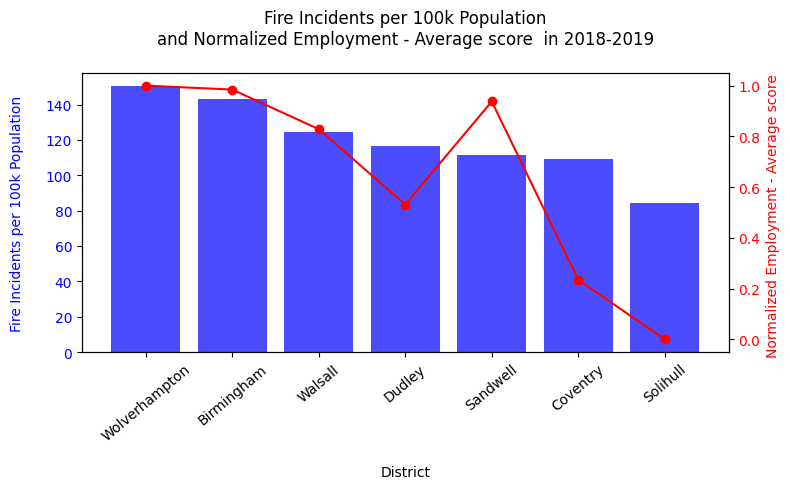

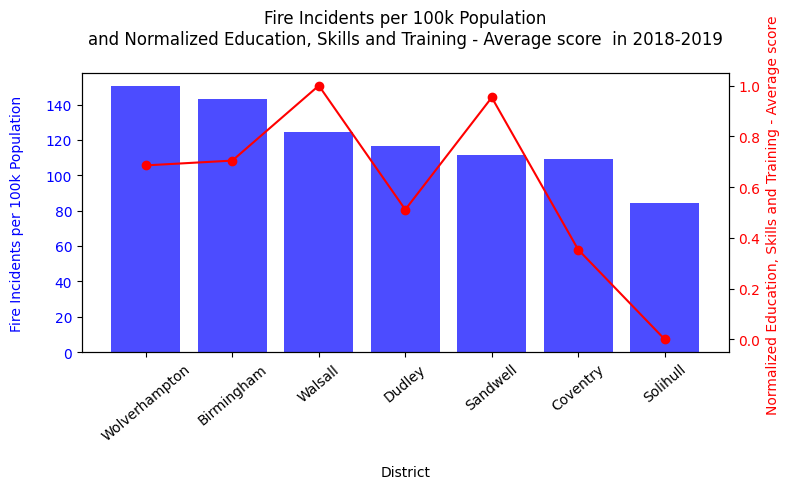

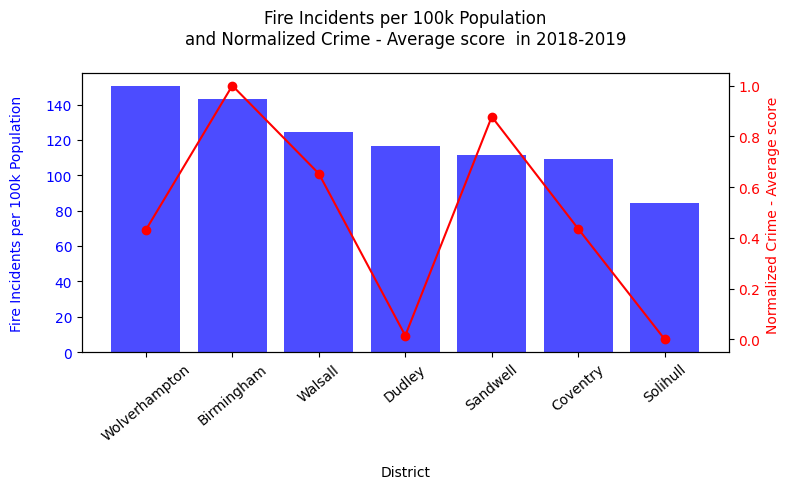

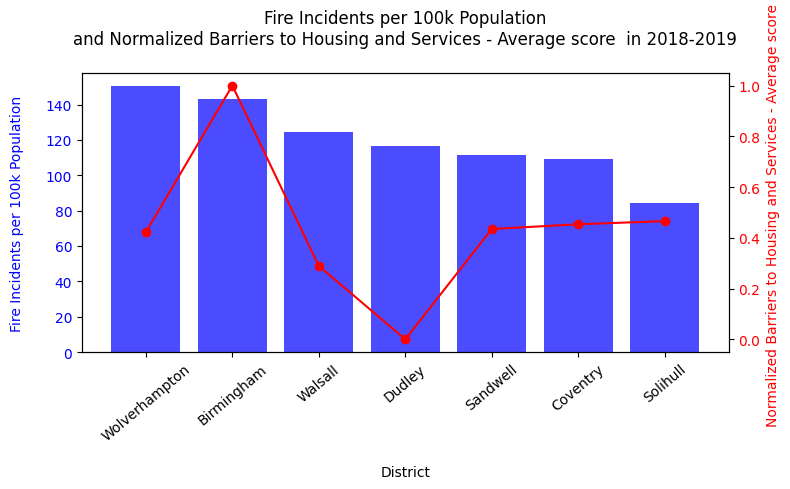

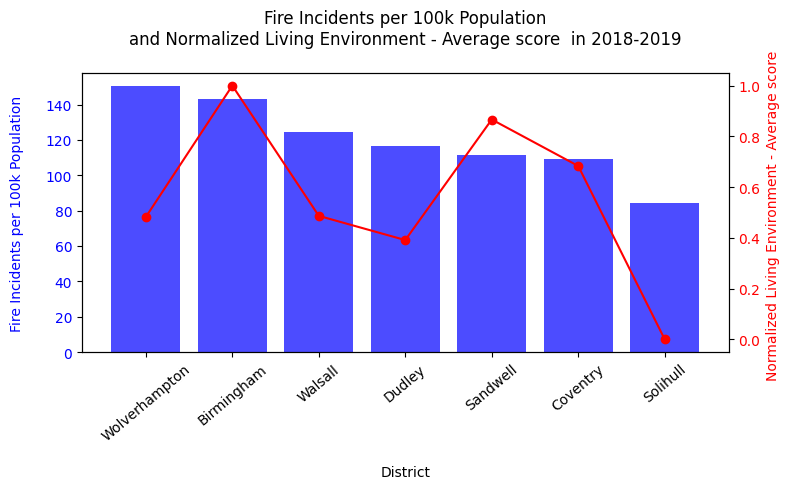

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

vars = ['IMD - Average score ', 'Income - Average score ', 'Employment - Average score ',
        'Education, Skills and Training - Average score ', 'Crime - Average score ',
        'Barriers to Housing and Services - Average score ', 'Living Environment - Average score ']

def normalize(data):
    """Function to normalize data between 0 and 1."""
    return (data - np.min(data)) / (np.max(data) - np.min(data))

def plot_data(col_name):
    fig, ax1 = plt.subplots(figsize=(8, 5))

    # Keep original data for bar plot (Fire incidents)
    fires = district_info['Fires per 100k Population']

    # Normalize the IMD-related scores for the line plot
    imd_normalized = normalize(district_info[col_name])

    # Plot Fire incidents (ax1) - no normalization
    ax1.bar(district_info['District'], fires, color='b', alpha=0.7)
    ax1.set_xlabel('\nDistrict')
    ax1.set_ylabel('Fire Incidents per 100k Population\n', color='b')
    ax1.tick_params(axis='y', labelcolor='b')
    plt.xticks(rotation=40)

    # Plot IMD-related score (ax2) - normalized
    ax2 = ax1.twinx()
    ax2.plot(district_info['District'], imd_normalized, color='r', marker='o')
    ax2.set_ylabel(f'Normalized {col_name}', color='r')
    ax2.tick_params(axis='y', labelcolor='r')

    # Set title and adjust layout
    plt.title(f'Fire Incidents per 100k Population\nand Normalized {col_name} in 2018-2019\n')
    fig.tight_layout()
    plt.show()

# Loop through each variable and plot
for col_name in vars:
    plot_data(col_name)


# plot based on 100k (16-64 year) Population

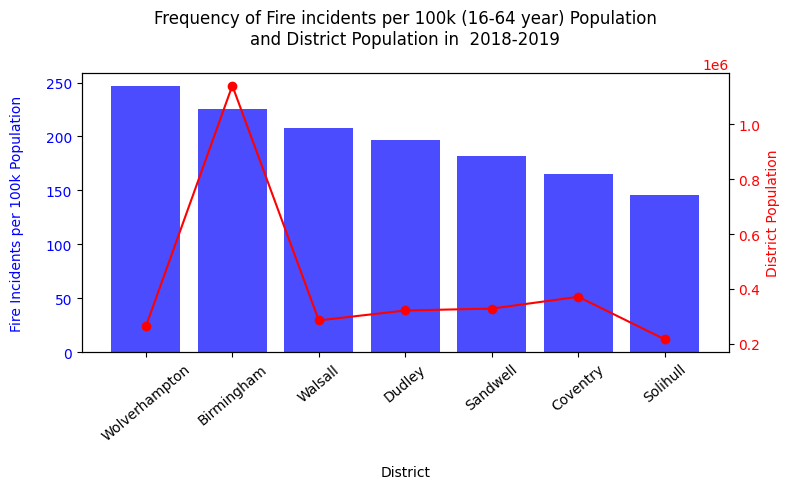

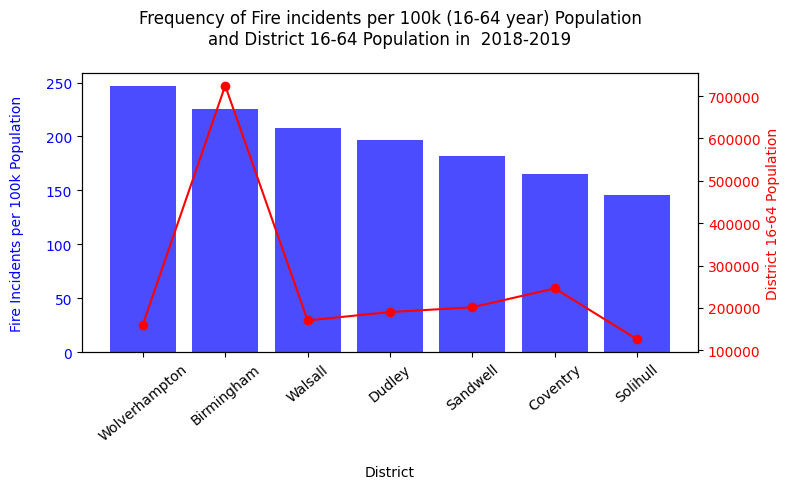

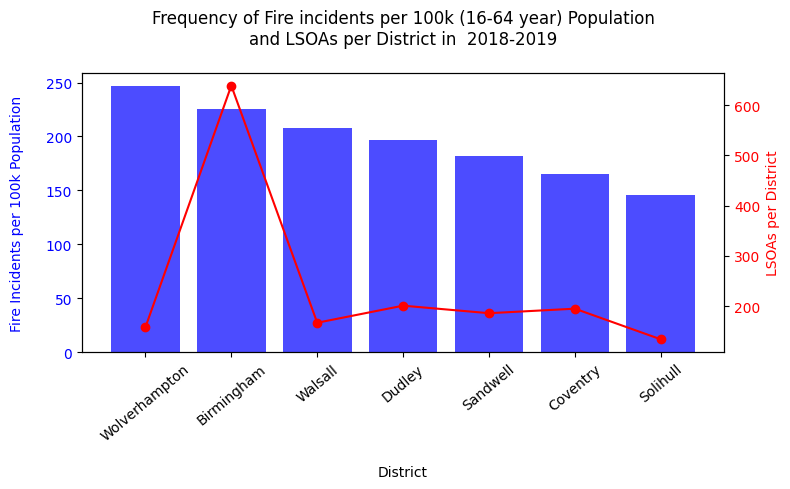

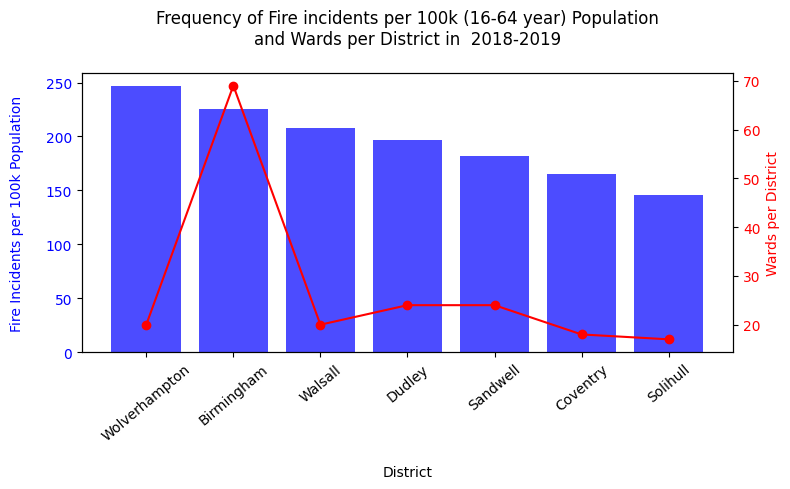

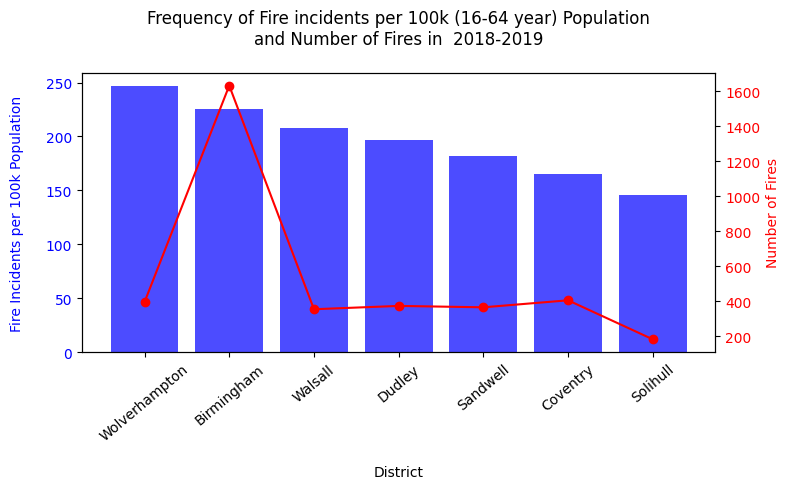

...

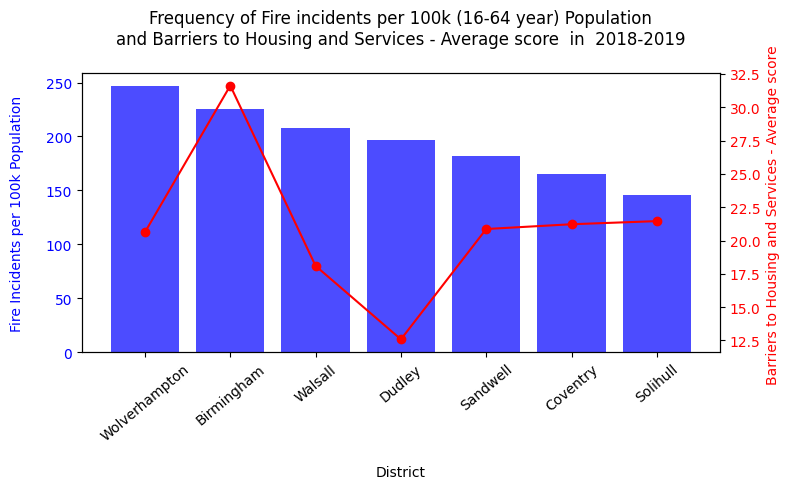

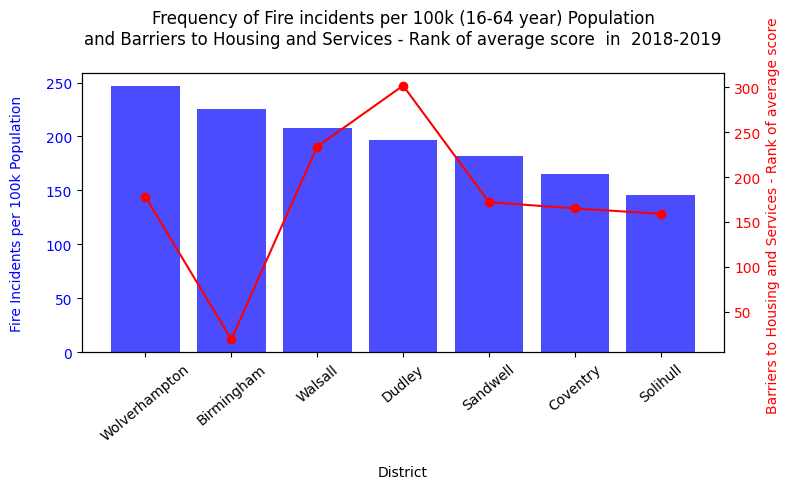

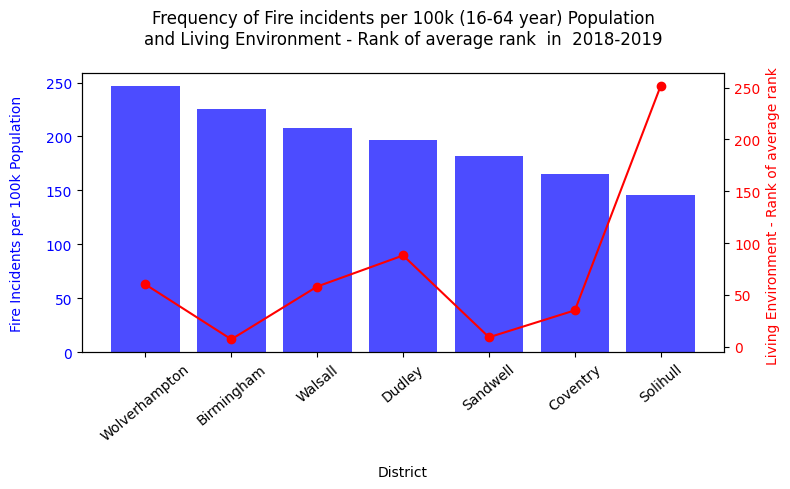

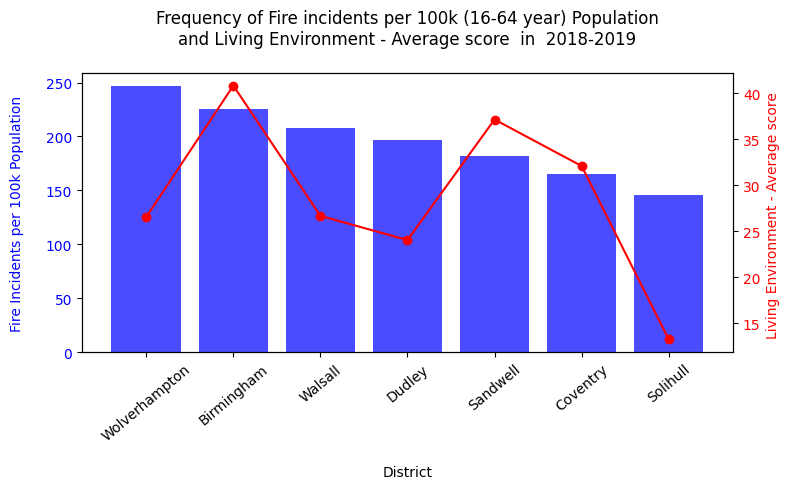

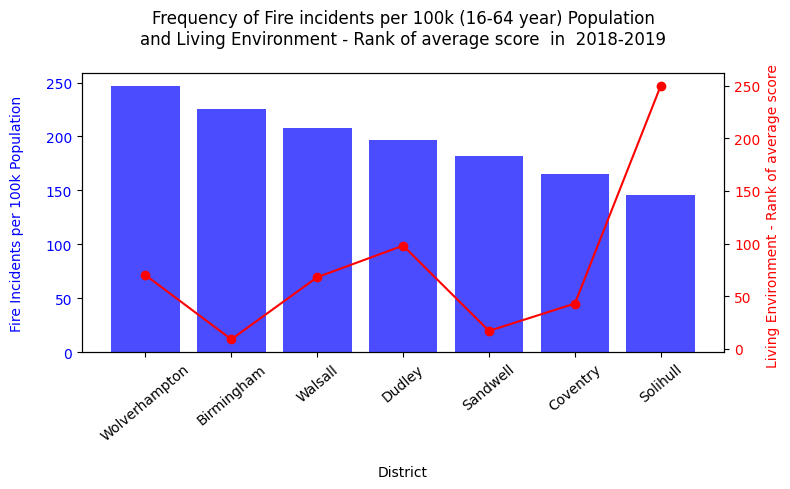

In [ ]:
# Plot
vars = [col for col in district_info.columns if col not in ['District', 'Fires per 100k (16-64 year) Population']]

def plot_data(col_name):
    fig, ax1 = plt.subplots(figsize=(8, 5))
    # Fire
    ax1.bar(district_info['District'], district_info['Fires per 100k (16-64 year) Population'], color='b', alpha=0.7)
    ax1.set_xlabel('\nDistrict')
    ax1.set_ylabel('Fire Incidents per 100k Population\n', color='b')
    ax1.tick_params(axis='y', labelcolor='b')
    plt.xticks(rotation=40)
    # IMD
    ax2 = ax1.twinx()
    ax2.plot(district_info['District'], district_info[col_name], color='r', marker='o')
    ax2.set_ylabel(col_name, color='r')
    ax2.tick_params(axis='y', labelcolor='r')
    plt.title('Frequency of Fire incidents per 100k (16-64 year) Population\nand '+col_name+' in  2018-2019\n')
    fig.tight_layout()
    plt.show()

for col_name in vars:
    plot_data(col_name)

#Labour Market#

In [ ]:
# File Labour Market

xls = pd.ExcelFile(path + 'Labour_market_rate.xlsx')

#Get the unique district names from the primary dataset
unique_districts = data['district'].unique()


# Sheets and columns to extract
sheets_columns = {

    '1': [0, 1, 2, 3, 4, 5],
    '5': [0, 1, 2, 3, 4, 5],
    '7': [0, 1, 2, 3, 4, 5],

}

In [ ]:
# Function to convert 'Period' to integer
def convert_period_to_year(period):
    if isinstance(period, str) and '/P1Y' in period:
        return int(period.split('-')[0])
    elif isinstance(period, str) and len(period) == 4:
        return int(period)
    return None

# Initialize an empty DataFrame for the merged data
merged_data = None

# Iterate through the Excel file sheets and columns
for sheet, columns in sheets_columns.items():
    # Read the sheet
    df = pd.read_excel(xls, sheet_name=sheet, usecols=columns)

    # Rename columns for consistency
    df.columns = ['Area code', 'Area name', 'Period', 'Value', 'Confidence interval lower', 'Confidence interval upper']

    # Filter based on unique districts
    df_filtered = df[df['Area name'].isin(unique_districts)]

    # Convert 'Period' to year and filter for years higher than 2019
    df_filtered['Year'] = df_filtered['Period'].apply(convert_period_to_year)
    df_filtered = df_filtered[df_filtered['Year'] > 2019]

    # Select only relevant columns
    df_filtered = df_filtered[['Area code', 'Area name', 'Year', 'Value']]

    # Rename 'Value' column to indicate the sheet it came from
    if sheet == '1':
        df_filtered.rename(columns={'Value': 'Economic inactivity rate (%)'}, inplace=True)
    elif sheet == '5':
        df_filtered.rename(columns={'Value': 'unemployment rate (%)'}, inplace=True)
    elif sheet == '7':
        df_filtered.rename(columns={'Value': 'median weekly pay(£)'}, inplace=True)

    # Merge data
    if merged_data is None:
        merged_data = df_filtered
    else:
        merged_data = pd.merge(merged_data, df_filtered, on=['Area code', 'Area name', 'Year'], how='outer')


<ipython-input-54-e3c4fcb4a6ad>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['Year'] = df_filtered['Period'].apply(convert_period_to_year)
<ipython-input-54-e3c4fcb4a6ad>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['Year'] = df_filtered['Period'].apply(convert_period_to_year)
<ipython-input-54-e3c4fcb4a6ad>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats

In [ ]:
from sklearn.preprocessing import MinMaxScaler
# Perform Min-Max normalization
scaler = MinMaxScaler()
#if 'Economic inactivity rate (%)' in merged_data.columns:
merged_data['Economic inactivity rate (normalized)'] = scaler.fit_transform(merged_data[['Economic inactivity rate (%)']])
#if 'Unemployment rate (%)' in merged_data.columns:
merged_data['Unemployment rate (normalized)'] = scaler.fit_transform(merged_data[['unemployment rate (%)']])
#if 'Median weekly pay (£)' in merged_data.columns:
merged_data['Median weekly pay (normalized)'] = scaler.fit_transform(merged_data[['median weekly pay(£)']])


In [ ]:
merged_data.head()

,Area code,Area name,Year,Economic inactivity rate (%),unemployment rate (%),median weekly pay(£),Economic inactivity rate (normalized),Unemployment rate (normalized),Median weekly pay (normalized)
0,E08000025,Birmingham,2020,28.2,8.1,447.6,0.734266,1.000000,0.128311
1,E08000025,Birmingham,2021,28.6,8,465.8,0.762238,0.977273,0.211416
2,E08000025,Birmingham,2022,28.6,7.3,499.9,0.762238,0.818182,0.367123
3,E08000025,Birmingham,2023,28.3,7.2,527,0.741259,0.795455,0.490868
4,E08000026,Coventry,2020,24,5.8,462.9,0.440559,0.477273,0.198174


In [ ]:
# Save the merged dataframe to a new Excel file
merged_data.to_excel( 'Filtered_Labour_Market_rate.xlsx', index=False)


#District_info per year

In [ ]:

# Function to calculate and merge fire data for a given year
def add_fire_data_for_year(year, district_info, data):
    # Subset data to the specified year
    df_year = data[data['year'] == year]

    # Fire per district
    district_frq = df_year['district'].value_counts().reset_index()
    district_frq.columns = ['District', f'Number of Fires in {year}']

    # Merge with district_info
    district_info = pd.merge(district_info, district_frq, on='District', how='left')

    # Replace NaN values with 0 (in case there are districts with no fires in a particular year)
    district_info[f'Number of Fires in {year}'] = district_info[f'Number of Fires in {year}'].fillna(0)

    # Calculate Fire/100k population
    #district_info[f'Fire {year}/LSOA'] = district_info[f'Number of Fires in {year}'] / district_info['LSOAs per District']
    district_info[f'Fire {year}/100k Population'] = (district_info[f'Number of Fires in {year}'] / district_info['District Population']) * 100000
    district_info[f'Fire {year}/100k (16-64 year) Population'] = (district_info[f'Number of Fires in {year}'] / district_info['District 16-64 Population']) * 100

    return district_info

# List of years to process
years = [2020, 2021, 2022, 2023]

# Process each year and update district_info
for year in years:
    district_info = add_fire_data_for_year(year, district_info, data)

# Sort the final dataset by the district name for better readability
district_info.sort_values(by='District', inplace=True)

# Merge with imd_summary if needed
district_info_year = pd.merge(district_info, imd_summary, on='District', how='left')

In [ ]:
district_info_year.head()

,District,District Population,District 16-64 Population,LSOAs per District,Wards per District,Number of Fires,Fires per 100k Population,Fires per 100k (16-64 year) Population,IMD - Average rank _x,IMD - Rank of average rank _x,...,Health Deprivation and Disability - Rank of average score _y,Crime - Rank of average rank _y,Crime - Average score _y,Crime - Rank of average score _y,Barriers to Housing and Services - Rank of average rank _y,Barriers to Housing and Services - Average score _y,Barriers to Housing and Services - Rank of average score _y,Living Environment - Rank of average rank _y,Living Environment - Average score _y,Living Environment - Rank of average score _y
0,Birmingham,1141816,724631,639,69,1633,143.017789,225.356078,25319.55,6,...,37,62,0.335,66,18,31.628,19,7,40.841,9
1,Coventry,371521,246160,195,18,406,109.280498,164.933377,19432.08,81,...,76,110,0.068,117,155,21.224,165,35,32.103,43
2,Dudley,321596,190311,201,24,374,116.294979,196.520432,18193.88,104,...,86,155,-0.131,157,303,12.587,302,88,24.049,98
3,Sandwell,328450,201579,186,24,366,111.432486,181.566532,25276.49,8,...,33,72,0.277,75,156,20.866,172,9,37.156,17
4,Solihull,216374,125975,134,17,183,84.575781,145.266918,12510.31,206,...,178,159,-0.138,160,150,21.459,159,252,13.257,250


In [ ]:
district_info_year.to_excel( 'district_info_per_year.xlsx', index=False)

#**Visualise Labour Market data VS District_info**#

#**Economic Inactivity Rate**#

#Plotting trend of fire incidents per 100k (16-64 year) Population and Economic Inactivity Rate #

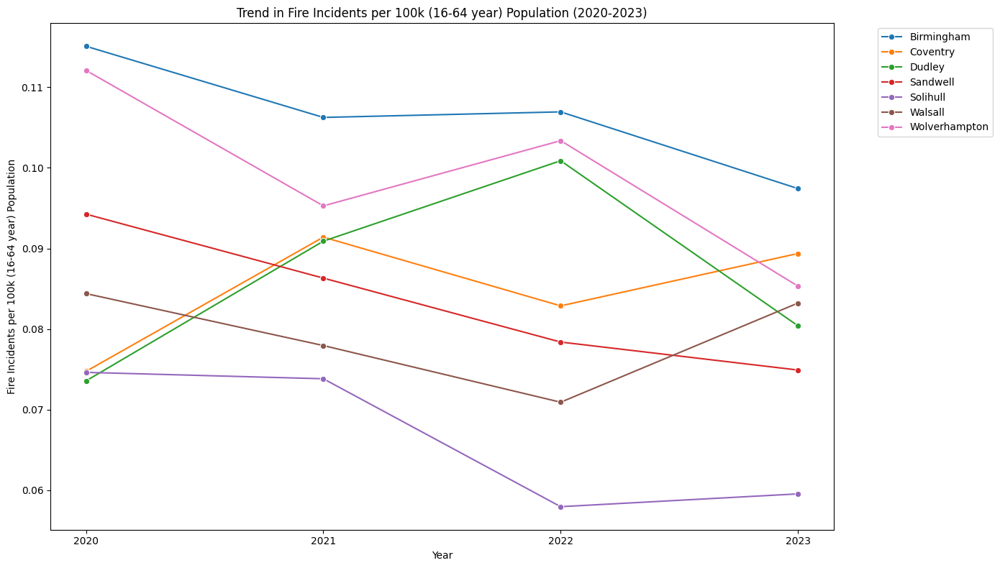

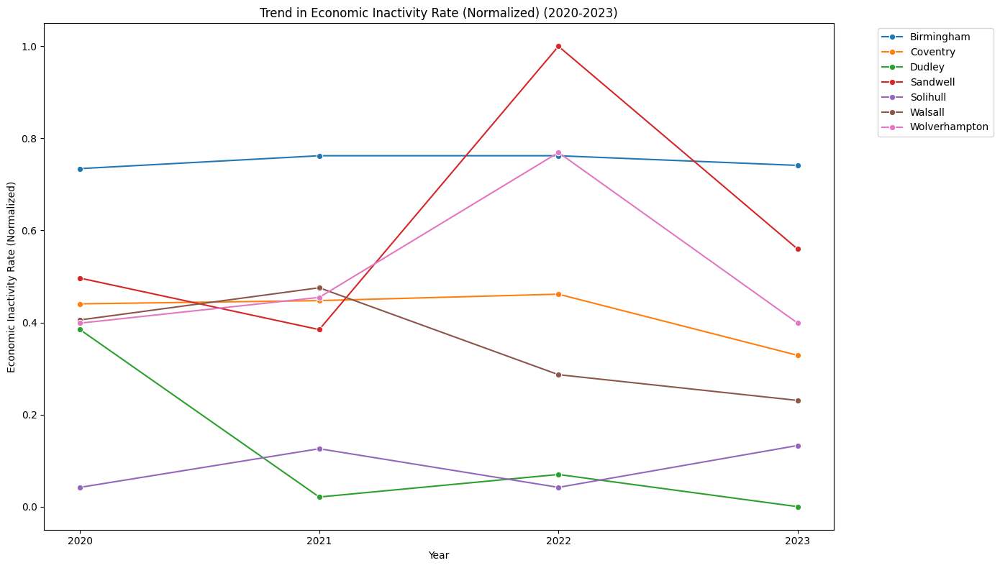

In [ ]:
# Reshape primary_data for fire incidents per 100k (16-64 year) Population
fire_columns = [f'Fire {year}/100k (16-64 year) Population' for year in range(2020, 2024)]
fire_data = district_info_year.melt(id_vars=['District'], value_vars=fire_columns,
                                    var_name='Year', value_name='Fire_100k (16-64 year) Population')
fire_data['Year'] = fire_data['Year'].str.extract(r'(\d{4})').astype(int)

# Reshape labor_market_data
labor_market_data = merged_data.rename(columns={'Area name': 'District'})
labor_market_filtered = labor_market_data[['District', 'Year', 'Economic inactivity rate (normalized)']]

# Merge the reshaped dataframes
merged_data_inactivity = pd.merge(fire_data, labor_market_filtered, on=['District', 'Year'])

# Filter to show only data for years 2020, 2021, 2022, and 2023
merged_data_inactivity_filtered = merged_data_inactivity[merged_data_inactivity['Year'].isin([2020, 2021, 2022, 2023])]

# Plotting
plt.figure(figsize=(14, 8))

# Plot for Fire incidents per 100k (16-64 year) Population
sns.lineplot(data=merged_data_inactivity_filtered, x='Year', y='Fire_100k (16-64 year) Population', hue='District', marker='o')
plt.title('Trend in Fire Incidents per 100k (16-64 year) Population (2020-2023)')
plt.xlabel('Year')
plt.ylabel('Fire Incidents per 100k (16-64 year) Population')
plt.xticks([2020, 2021, 2022, 2023])  # Set the x-axis ticks to only show the specified years
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Plot for Economic Inactivity Rate (normalized)
plt.figure(figsize=(14, 8))
sns.lineplot(data=merged_data_inactivity_filtered, x='Year', y='Economic inactivity rate (normalized)', hue='District', marker='o')
plt.title('Trend in Economic Inactivity Rate (Normalized) (2020-2023)')
plt.xlabel('Year')
plt.ylabel('Economic Inactivity Rate (Normalized)')
plt.xticks([2020, 2021, 2022, 2023])  # Set the x-axis ticks to only show the specified years
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


#Plotting Combine trend of fire incidents per 100k (16-64 year) Population and Economic Inactivity Rate #

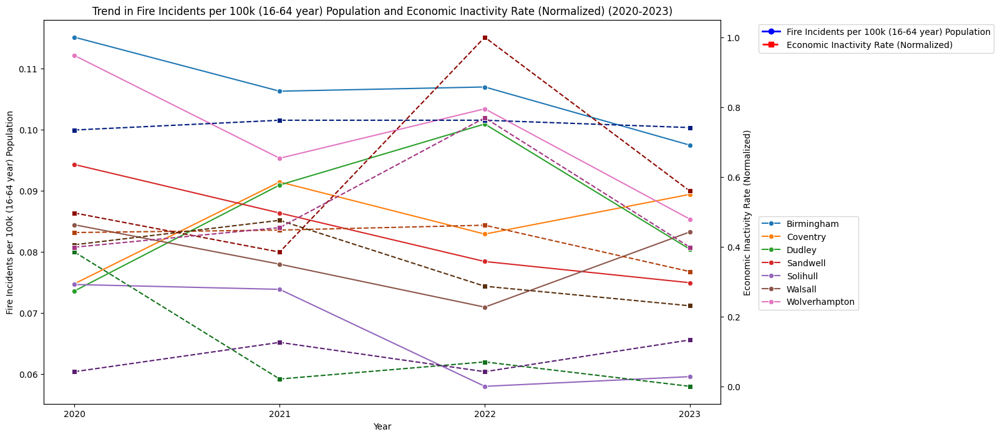

In [ ]:
# Plotting
fig, ax1 = plt.subplots(figsize=(14, 8))

# Line plot for Fire incidents per 100k (16-64 year) Population
sns.lineplot(data=merged_data_inactivity, x='Year', y='Fire_100k (16-64 year) Population', hue='District', marker='o', linestyle='-', ax=ax1, palette='tab10')
ax1.set_xlabel('Year')
ax1.set_ylabel('Fire Incidents per 100k (16-64 year) Population')
ax1.set_title('Trend in Fire Incidents per 100k (16-64 year) Population and Economic Inactivity Rate (Normalized) (2020-2023)')

# Create a second y-axis for Economic inactivity rate (normalized)
ax2 = ax1.twinx()
sns.lineplot(data=merged_data_inactivity, x='Year', y='Economic inactivity rate (normalized)', hue='District', marker='s', linestyle='--', ax=ax2, palette='dark', legend=False)
ax2.set_ylabel('Economic Inactivity Rate (Normalized)')

# Create custom legend
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
custom_lines = [plt.Line2D([0], [0], color='b', lw=2, linestyle='-', marker='o'),
                plt.Line2D([0], [0], color='r', lw=2, linestyle='--', marker='s')]
ax2.legend(custom_lines, ['Fire Incidents per 100k (16-64 year) Population', 'Economic Inactivity Rate (Normalized)'], loc='upper left', bbox_to_anchor=(1.05, 1))

# Adjust legend for districts
ax1.legend(handles1, labels1, loc='upper left', bbox_to_anchor=(1.05, 0.5))
plt.xticks([2020, 2021, 2022, 2023])
plt.show()

#Combined trend of **NORMALISED** fire incidents per 100k (16-64 year) Population and Economic Inactivity Rate #

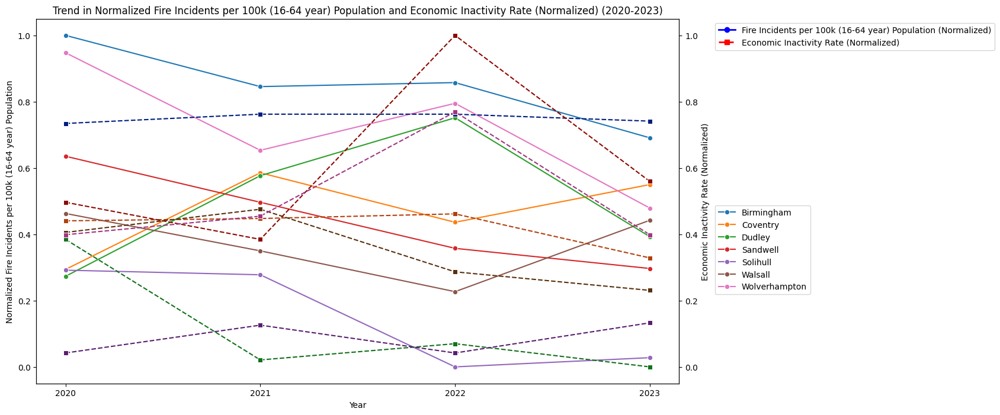

In [ ]:
# Normalize Fire_100k (16-64 year) Population
scaler = MinMaxScaler()
merged_data_inactivity['Fire_100k (16-64 year) Population_normalized'] = scaler.fit_transform(merged_data_inactivity[['Fire_100k (16-64 year) Population']])

# Plotting
fig, ax1 = plt.subplots(figsize=(14, 8))

# Line plot for normalized Fire incidents per 100k (16-64 year) Population
sns.lineplot(data=merged_data_inactivity, x='Year', y='Fire_100k (16-64 year) Population_normalized', hue='District', marker='o', linestyle='-', ax=ax1, palette='tab10')
ax1.set_xlabel('Year')
ax1.set_ylabel('Normalized Fire Incidents per 100k (16-64 year) Population')
ax1.set_title('Trend in Normalized Fire Incidents per 100k (16-64 year) Population and Economic Inactivity Rate (Normalized) (2020-2023)')

# Create a second y-axis for Economic inactivity rate (normalized)
ax2 = ax1.twinx()
sns.lineplot(data=merged_data_inactivity, x='Year', y='Economic inactivity rate (normalized)', hue='District', marker='s', linestyle='--', ax=ax2, palette='dark', legend=False)
ax2.set_ylabel('Economic Inactivity Rate (Normalized)')

# Create custom legend
custom_lines = [plt.Line2D([0], [0], color='b', lw=2, linestyle='-', marker='o'),
                plt.Line2D([0], [0], color='r', lw=2, linestyle='--', marker='s')]
ax2.legend(custom_lines, ['Fire Incidents per 100k (16-64 year) Population (Normalized)', 'Economic Inactivity Rate (Normalized)'], loc='upper left', bbox_to_anchor=(1.05, 1))

# Adjust legend for districts
handles1, labels1 = ax1.get_legend_handles_labels()
ax1.legend(handles1, labels1, loc='upper left', bbox_to_anchor=(1.05, 0.5))
plt.xticks([2020, 2021, 2022, 2023])

plt.show()

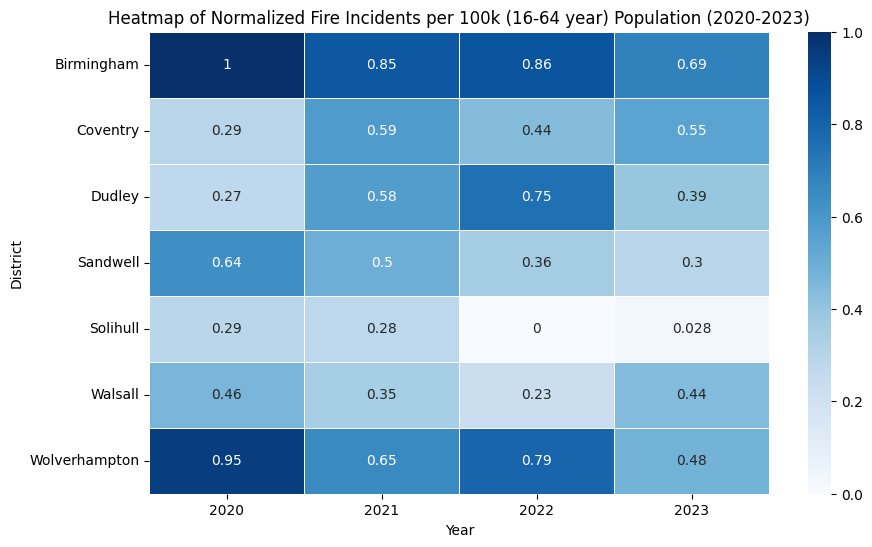

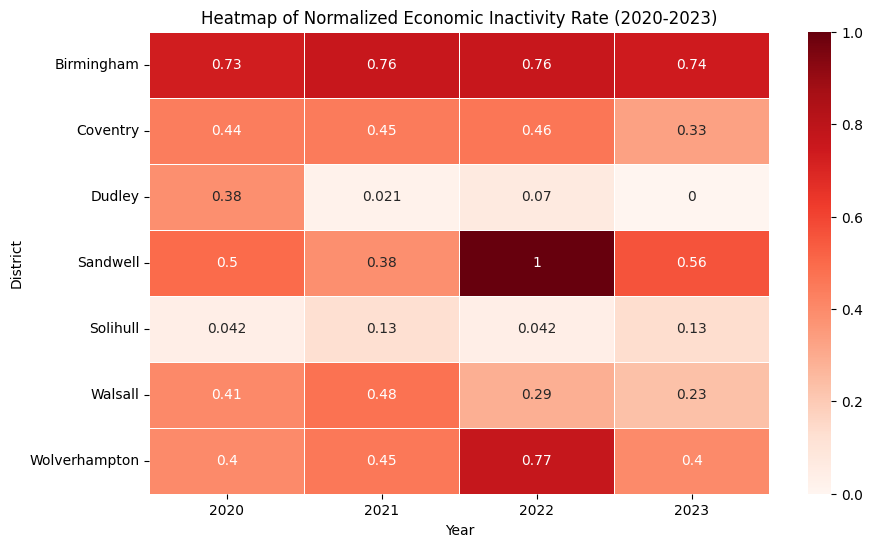

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pivot data for heatmaps
# For Fire Incidents per 100k Population (Normalized)
fire_heatmap_data = merged_data_inactivity.pivot(index='District', columns='Year', values='Fire_100k (16-64 year) Population_normalized')

# For Economic Inactivity Rate (Normalized)
inactivity_heatmap_data = merged_data_inactivity.pivot(index='District', columns='Year', values='Economic inactivity rate (normalized)')

# Create heatmap for Fire Incidents
plt.figure(figsize=(10, 6))
sns.heatmap(fire_heatmap_data, annot=True, cmap='Blues', linewidths=0.5)
plt.title('Heatmap of Normalized Fire Incidents per 100k (16-64 year) Population (2020-2023)')
plt.xlabel('Year')
plt.ylabel('District')
plt.show()

# Create heatmap for Economic Inactivity Rate
plt.figure(figsize=(10, 6))
sns.heatmap(inactivity_heatmap_data, annot=True, cmap='Reds', linewidths=0.5)
plt.title('Heatmap of Normalized Economic Inactivity Rate (2020-2023)')
plt.xlabel('Year')
plt.ylabel('District')
plt.show()


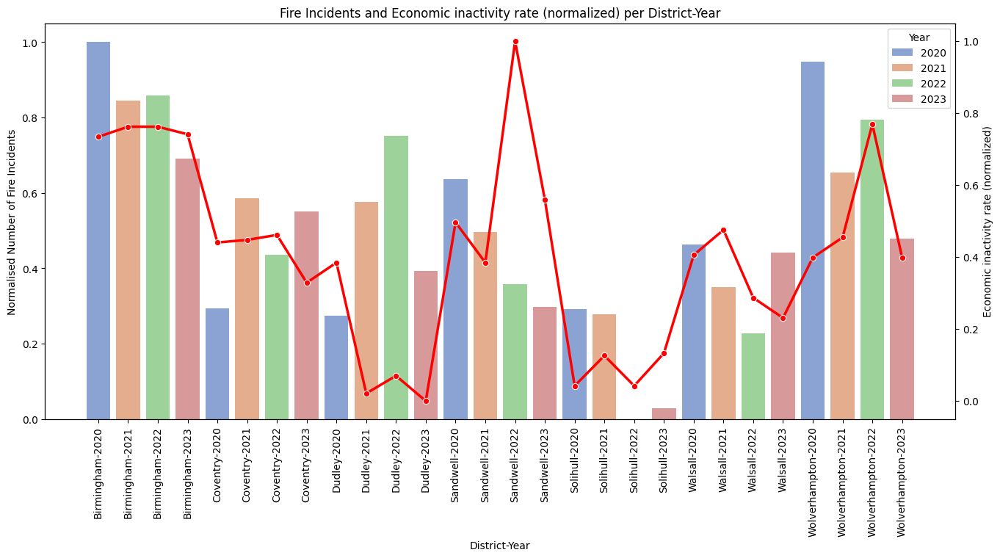

In [ ]:
# Create a new column to represent district-year
merged_data_inactivity['District-Year'] = merged_data_inactivity['District'] + '-' + merged_data_inactivity['Year'].astype(str)

# Sort the data by District and then by Year
df_x = merged_data_inactivity.sort_values(by=['District', 'Year'])

# Create a bar plot for fire incidents
fig, ax1 = plt.subplots(figsize=(16, 7))
sns.barplot(x='District-Year', y='Fire_100k (16-64 year) Population_normalized', data=df_x , ax=ax1, palette='muted', alpha=0.7, hue='Year')
ax1.set_xlabel('District-Year')
ax1.set_ylabel('Normalised Number of Fire Incidents')
ax1.set_title('Fire Incidents and Economic inactivity rate (normalized) per District-Year')
plt.xticks(rotation=90)

# Line plot for Economic inactivity rate score
ax2 = ax1.twinx()
sns.lineplot(x='District-Year', y='Economic inactivity rate (normalized)', data=df_x , ax=ax2, color='red', linewidth=2.5, marker='o', sort=False)
ax2.set_ylabel('Economic inactivity rate (normalized)')

plt.show()

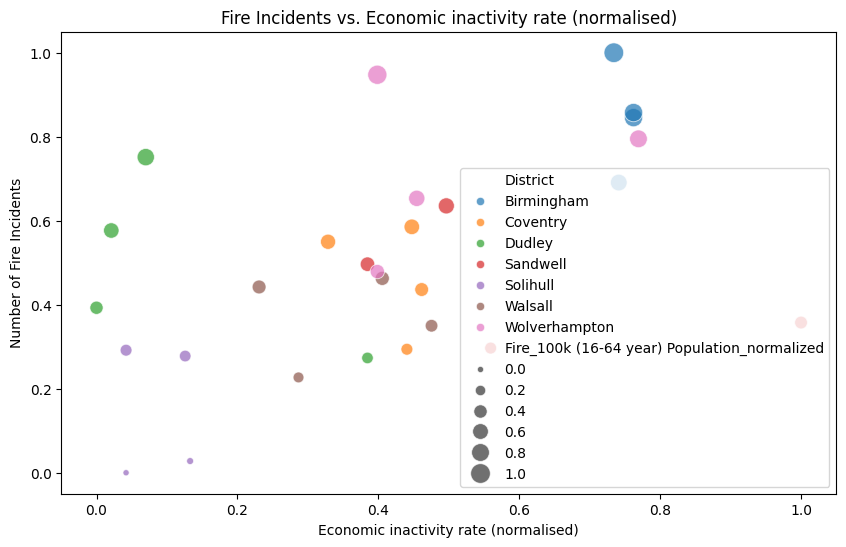

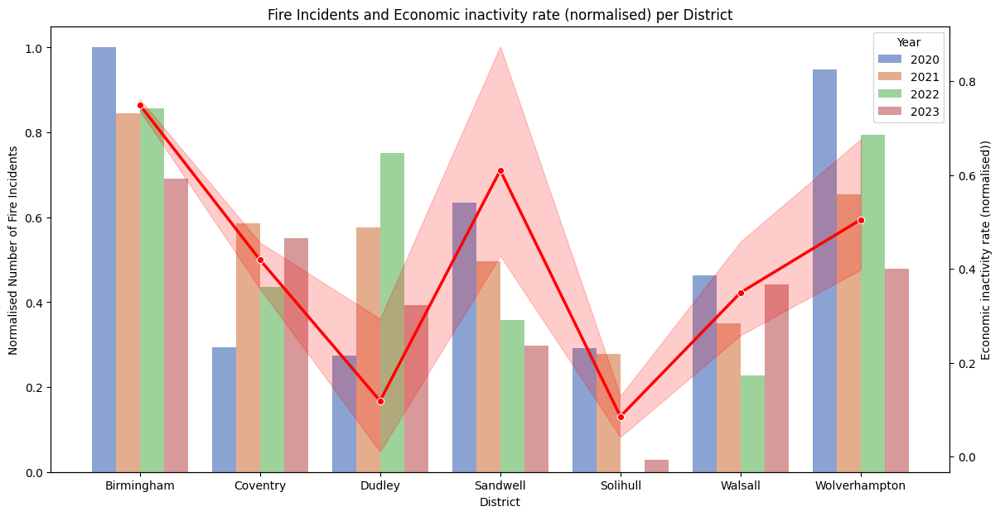

In [ ]:
# Scatter Plot: Fire Incidents vs. Economic inactivity rate (normalized)
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Economic inactivity rate (normalized)', y='Fire_100k (16-64 year) Population_normalized', hue='District', size='Fire_100k (16-64 year) Population_normalized', sizes=(20, 200), data=merged_data_inactivity, alpha=0.7)
plt.title('Fire Incidents vs. Economic inactivity rate (normalised)')
plt.xlabel('Economic inactivity rate (normalised)')
plt.ylabel('Number of Fire Incidents')
plt.show()



# Combined Bar and Line Chart
fig, ax1 = plt.subplots(figsize=(14, 7))

# Bar plot for fire incidents
sns.barplot(x='District', y='Fire_100k (16-64 year) Population_normalized', hue='Year', data=merged_data_inactivity, ax=ax1, palette='muted', alpha=0.7)
ax1.set_xlabel('District')
ax1.set_ylabel('Normalised Number of Fire Incidents')
ax1.set_title('Fire Incidents and Economic inactivity rate (normalised) per District')

# Line plot for Economic inactivity rate (normalized)
ax2 = ax1.twinx()
sns.lineplot(x='District', y='Economic inactivity rate (normalized)', data=merged_data_inactivity, ax=ax2, color='red', linewidth=2.5, marker='o', sort=False)
ax2.set_ylabel('Economic inactivity rate (normalised))')

plt.show()

In [ ]:
merged_data_inactivity

,District,Year,Fire_100k (16-64 year) Population,Economic inactivity rate (normalized),Fire_100k (16-64 year) Population_normalized,District-Year
0,Birmingham,2020,0.115093,0.734266,1.000000,Birmingham-2020
1,Coventry,2020,0.074748,0.440559,0.293991,Coventry-2020
2,Dudley,2020,0.073564,0.384615,0.273266,Dudley-2020
3,Sandwell,2020,0.094256,0.496503,0.635363,Sandwell-2020
4,Solihull,2020,0.074618,0.041958,0.291713,Solihull-2020
5,Walsall,2020,0.084393,0.405594,0.462772,Walsall-2020
6,Wolverhampton,2020,0.112096,0.398601,0.947549,Wolverhampton-2020
7,Birmingham,2021,0.106261,0.762238,0.845445,Birmingham-2021
8,Coventry,2021,0.091404,0.447552,0.585457,Coventry-2021
9,Dudley,2021,0.090904,0.020979,0.576705,Dudley-2021


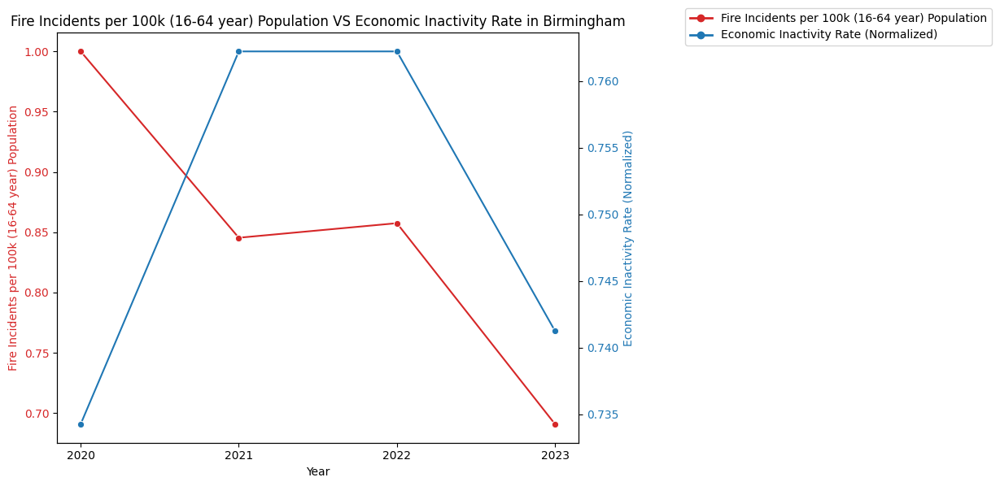

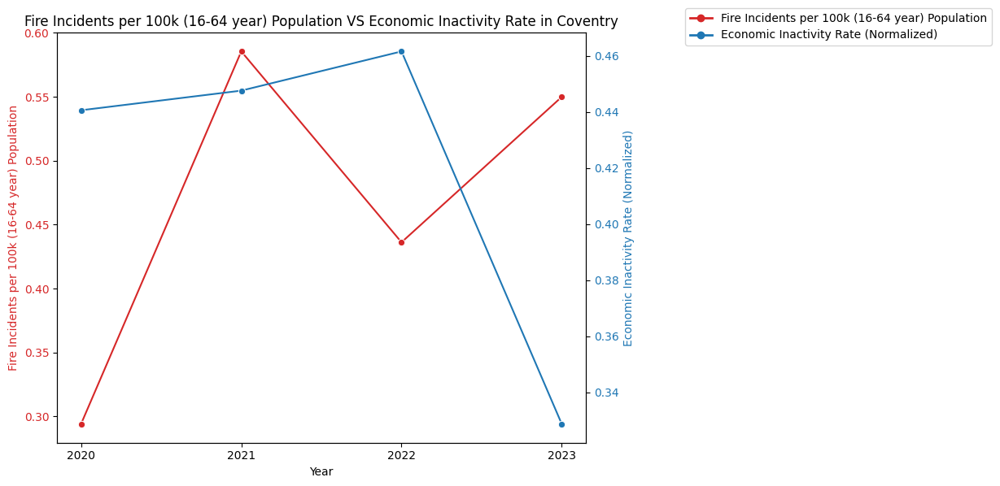

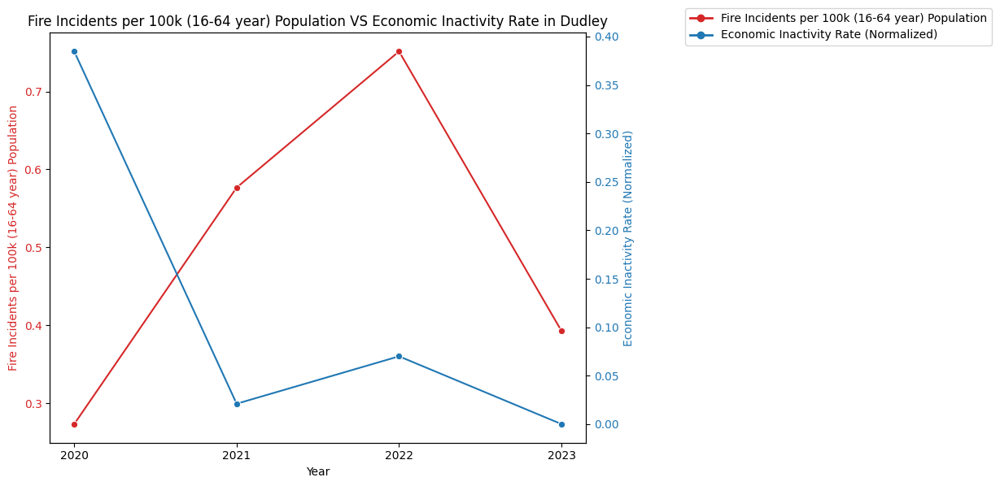

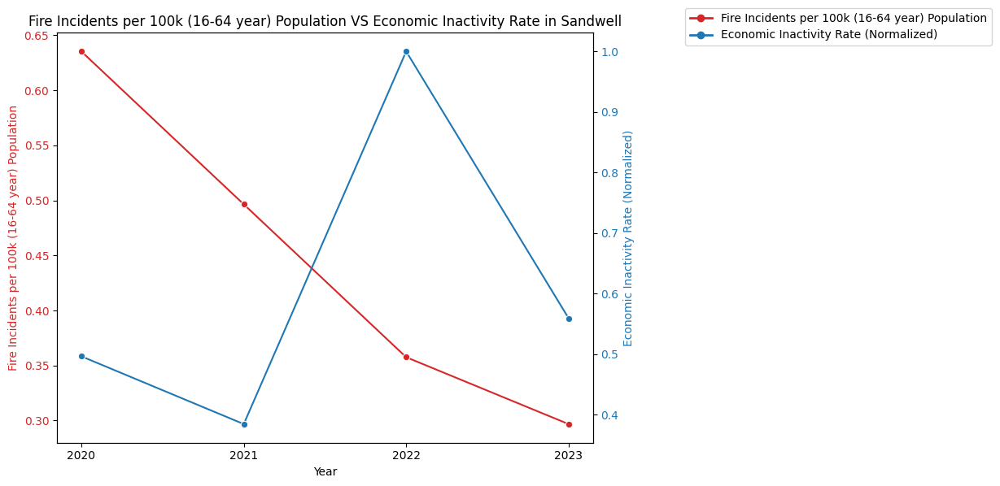

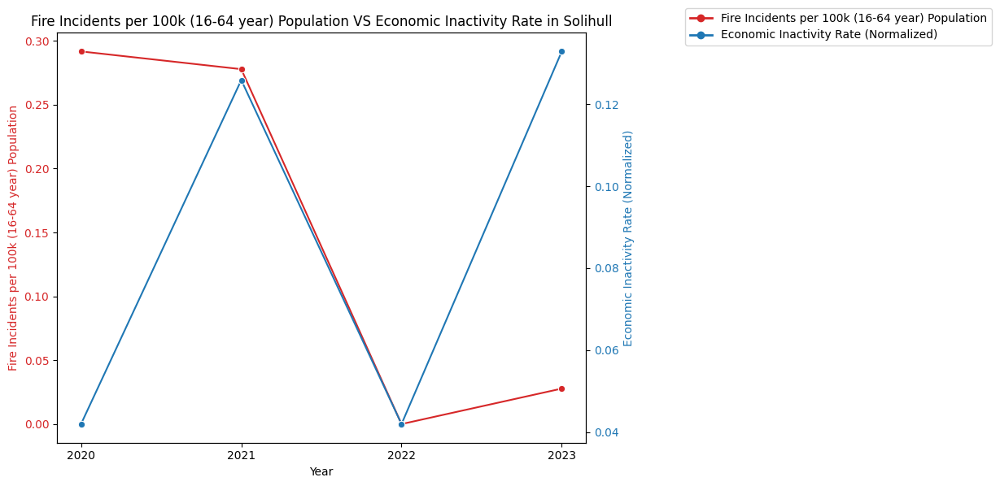

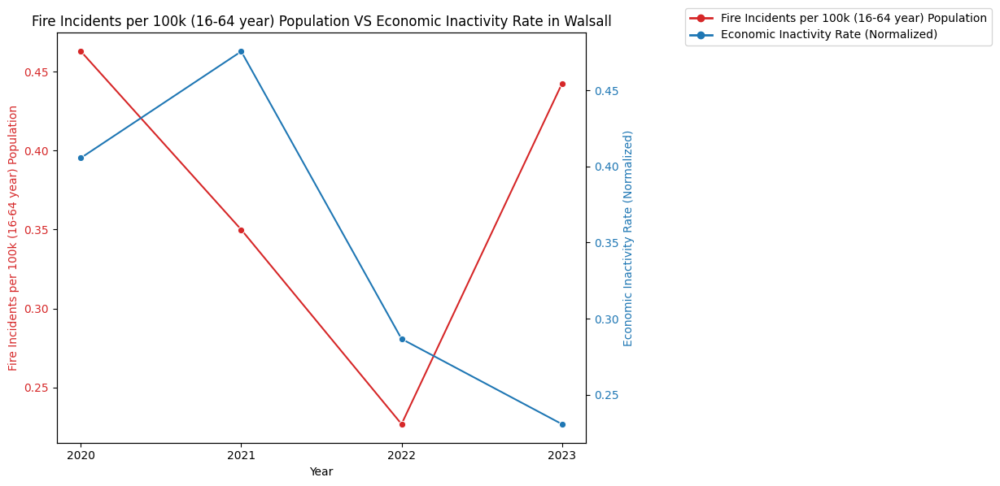

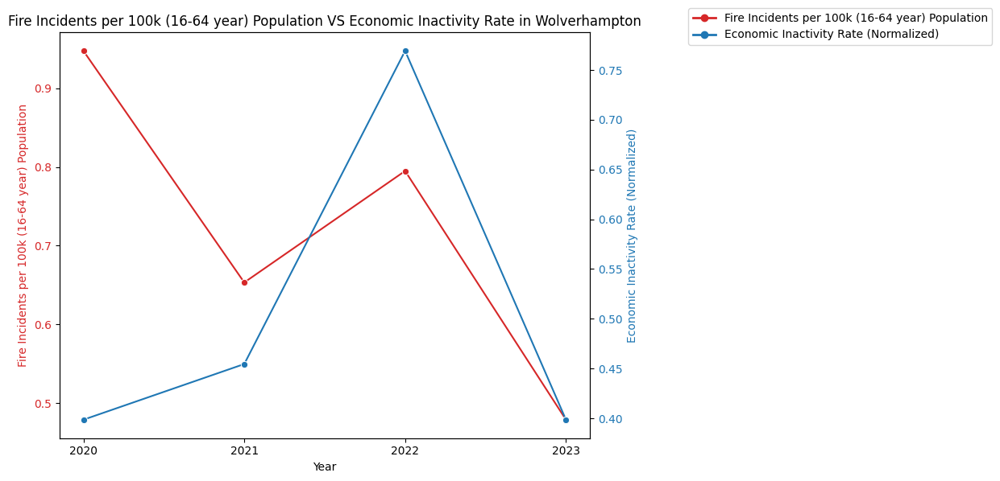

In [ ]:
from matplotlib.lines import Line2D

# Get the list of unique districts
districts = merged_data_inactivity['District'].unique()

# Plotting for each district

for district in districts:
    district_data = merged_data_inactivity[merged_data_inactivity['District'] == district]

    fig, ax1 = plt.subplots(figsize=(8, 6))

    # First y-axis: Fire incidents
    color = 'tab:red'
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Fire Incidents per 100k (16-64 year) Population', color=color)
    sns.lineplot(data=district_data, x='Year', y='Fire_100k (16-64 year) Population_normalized', marker='o', ax=ax1, color=color, legend=False)  # Disable automatic legend
    ax1.tick_params(axis='y', labelcolor=color)

    # Second y-axis: Economic inactivity rate
    ax2 = ax1.twinx()
    color = 'tab:blue'
    ax2.set_ylabel('Economic Inactivity Rate (Normalized)', color=color)
    sns.lineplot(data=district_data, x='Year', y='Economic inactivity rate (normalized)', marker='o', ax=ax2, color=color, legend=False)  # Disable automatic legend
    ax2.tick_params(axis='y', labelcolor=color)


    # Create custom legend handles
    legend_handles = [Line2D([0], [0], color='tab:red', lw=2, marker='o', label='Fire Incidents per 100k (16-64 year) Population'),
                      Line2D([0], [0], color='tab:blue', lw=2, marker='o', label='Economic Inactivity Rate (Normalized)')]

    # Manually add the legend with colors
    fig.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.title(f'Fire Incidents per 100k (16-64 year) Population VS Economic Inactivity Rate in {district}')
    plt.xticks([2020, 2021, 2022, 2023])
    fig.tight_layout()
    plt.show()


***Using The same scale Unit for both Y- axis (Normalised Fire Incidents and Inactivity)[maybe not needed]***

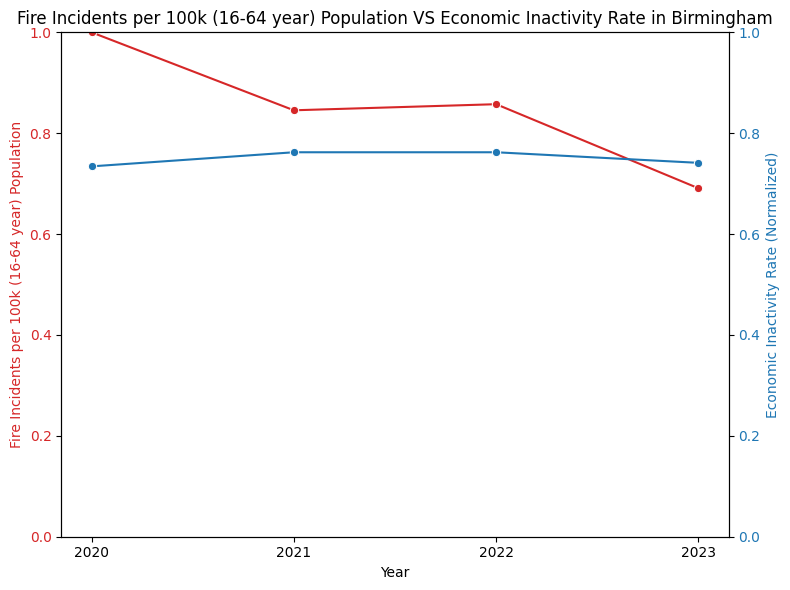

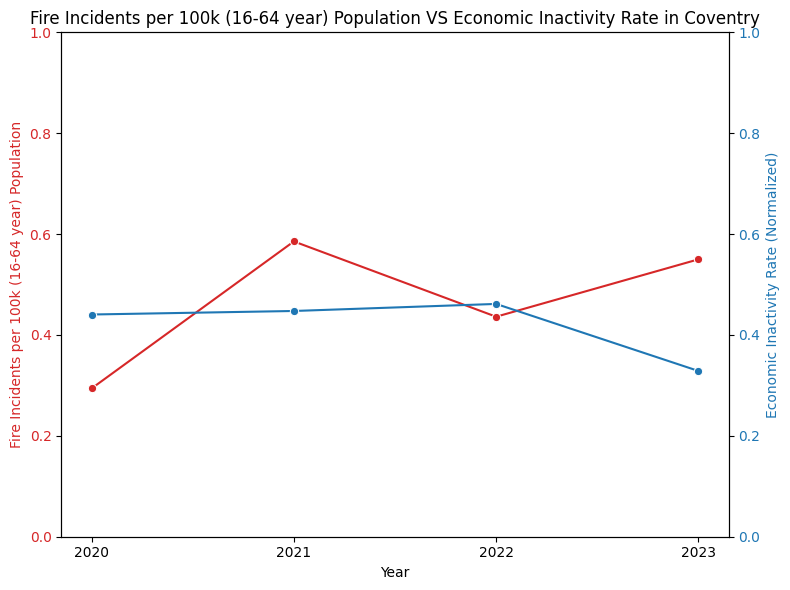

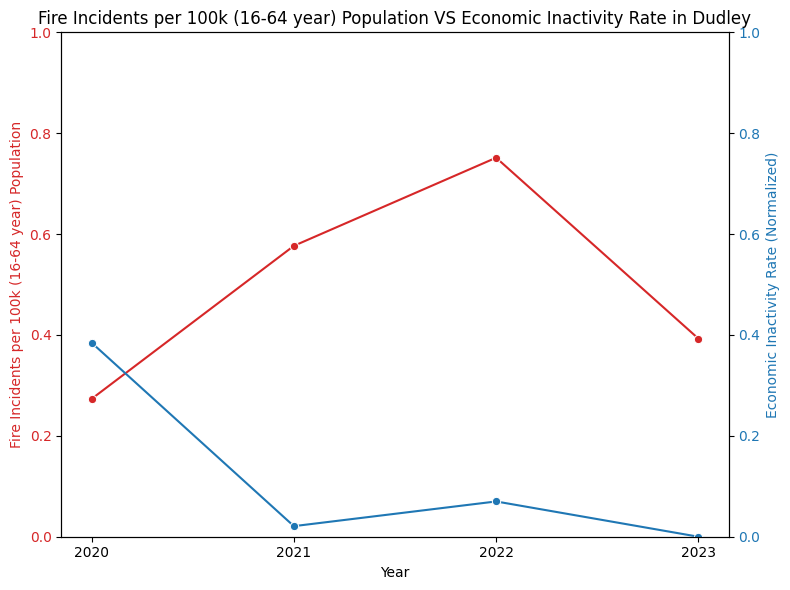

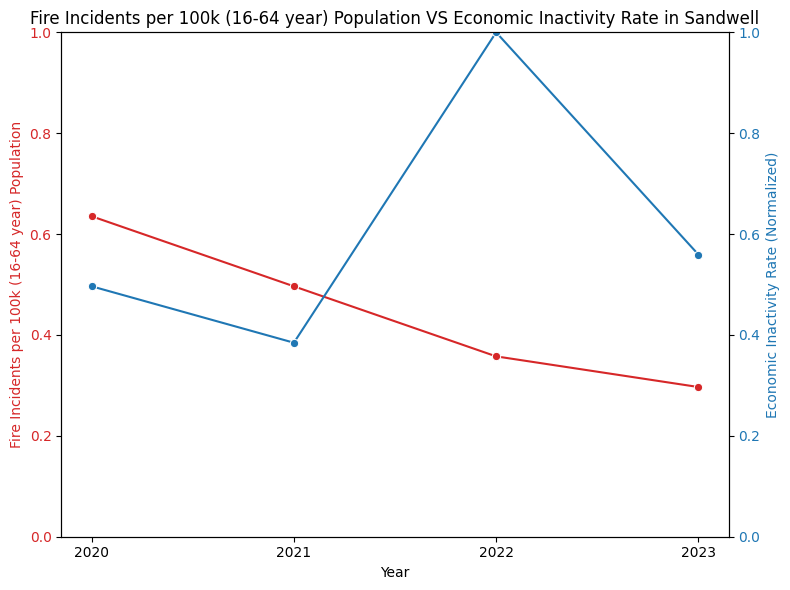

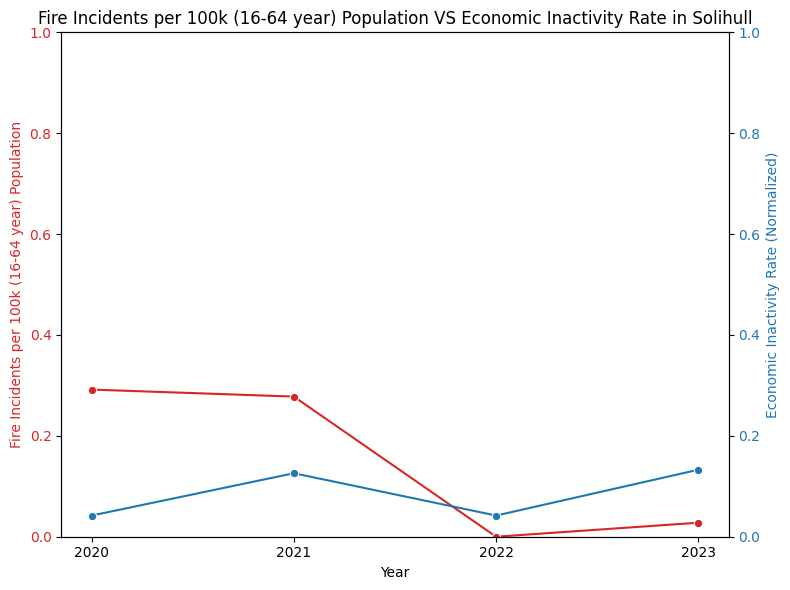

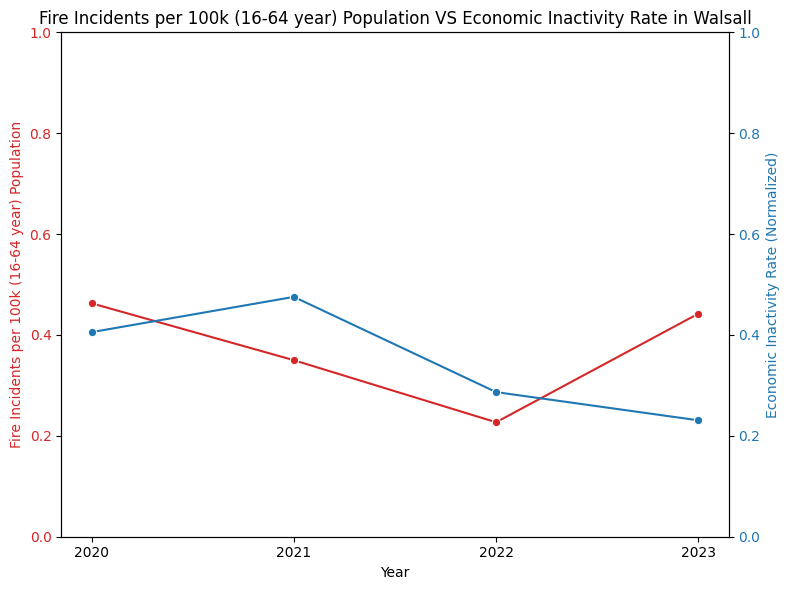

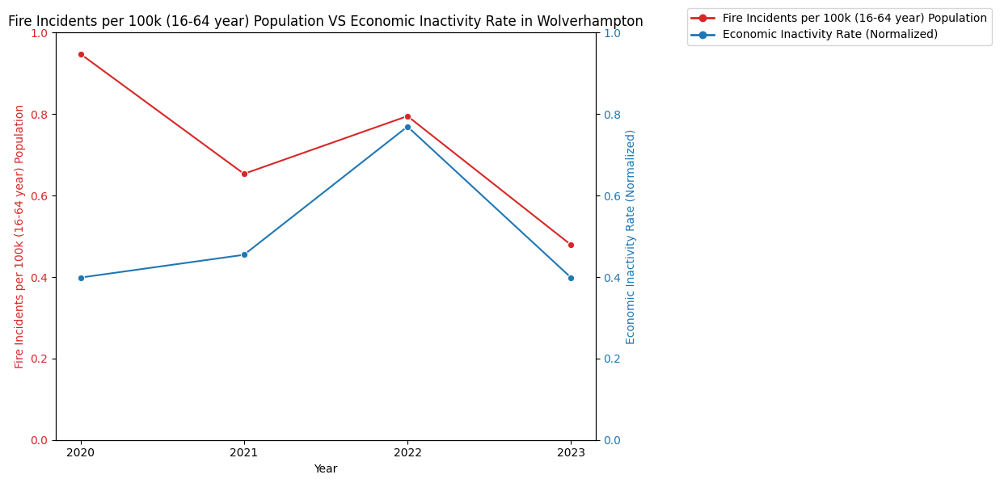

In [ ]:
from matplotlib.lines import Line2D

for district in districts:
    district_data = merged_data_inactivity[merged_data_inactivity['District'] == district]

    fig, ax1 = plt.subplots(figsize=(8, 6))

    # First y-axis: Fire incidents
    color = 'tab:red'
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Fire Incidents per 100k (16-64 year) Population', color=color)
    sns.lineplot(data=district_data, x='Year', y='Fire_100k (16-64 year) Population_normalized', marker='o', ax=ax1, color=color, legend=False)  # Disable automatic legend
    ax1.tick_params(axis='y', labelcolor=color)

    # Set y-axis limit for both axes to be consistent (since both are normalized)
    ax1.set_ylim(0, 1)

    # Second y-axis: Economic inactivity rate
    ax2 = ax1.twinx()
    color = 'tab:blue'
    ax2.set_ylabel('Economic Inactivity Rate (Normalized)', color=color)
    sns.lineplot(data=district_data, x='Year', y='Economic inactivity rate (normalized)', marker='o', ax=ax2, color=color, legend=False)  # Disable automatic legend
    ax2.tick_params(axis='y', labelcolor=color)

    # Set the same y-axis limit for the second axis
    ax2.set_ylim(0, 1)

    # Create custom legend handles
    #legend_handles = [Line2D([0], [0], color='tab:red', lw=2, marker='o', label='Fire Incidents per 100k (16-64 year) Population'),
     #                 Line2D([0], [0], color='tab:blue', lw=2, marker='o', label='Economic Inactivity Rate (Normalized)')]

    # Manually add the legend with colors
    #fig.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.title(f'Fire Incidents per 100k (16-64 year) Population VS Economic Inactivity Rate in {district}')
    plt.xticks([2020, 2021, 2022, 2023])
    fig.tight_layout()
fig.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1), loc='upper left')
legend_handles = [Line2D([0], [0], color='tab:red', lw=2, marker='o', label='Fire Incidents per 100k (16-64 year) Population'),
                      Line2D([0], [0], color='tab:blue', lw=2, marker='o', label='Economic Inactivity Rate (Normalized)')]
plt.show()


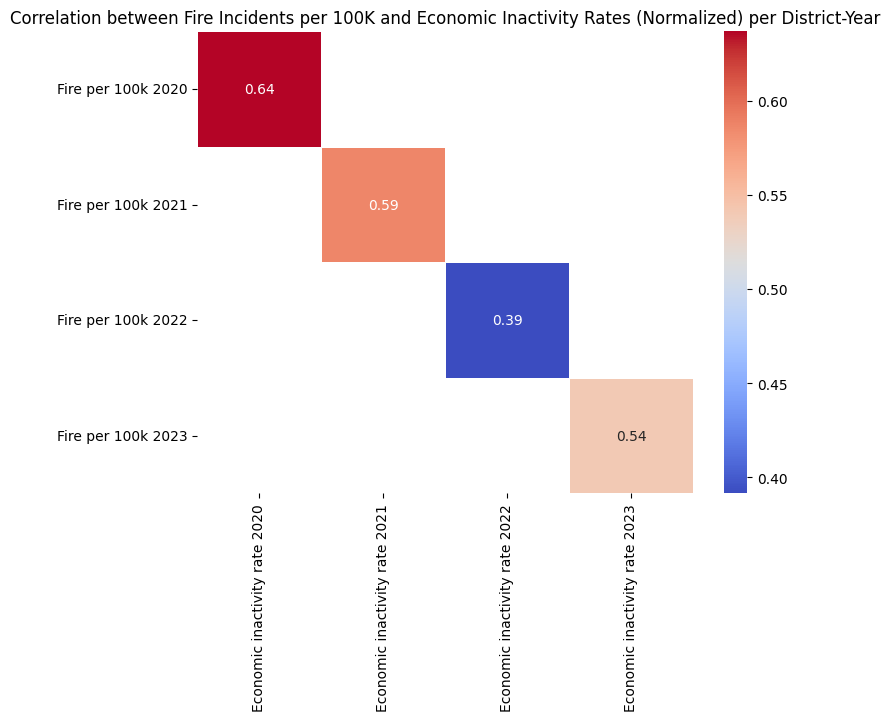

In [ ]:

df = pd.DataFrame(merged_data_inactivity)

# Create a new DataFrame for correlation analysis, focusing on pairs for each year
df_corr = df.pivot(index='District-Year', columns='Year', values=['Fire_100k (16-64 year) Population_normalized', 'Economic inactivity rate (normalized)'])

# Calculate the correlation matrix
corr_matrix = df_corr.corr()

# We are interested in correlations between Fire and Economic Inactivity Rates for the same years
fire_cols = [col for col in corr_matrix.columns if 'Fire_100k (16-64 year) Population_normalized' in col]
inactivity_cols = [col for col in corr_matrix.columns if 'Economic inactivity rate (normalized)' in col]

# Extract the relevant correlations
corr_to_plot = corr_matrix.loc[fire_cols, inactivity_cols]

# Rename the columns for easier readability
corr_to_plot.columns = [f'Economic inactivity rate {year}' for year in corr_to_plot.columns.get_level_values(1)]
corr_to_plot.index = [f'Fire per 100k {year}' for year in corr_to_plot.index.get_level_values(1)]

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr_to_plot, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation between Fire Incidents per 100K and Economic Inactivity Rates (Normalized) per District-Year')
plt.show()


#**Unemployment rate**#

#Plotting trend of fire incidents per 100k (16-64 year) Population  and Unemployment Rate #

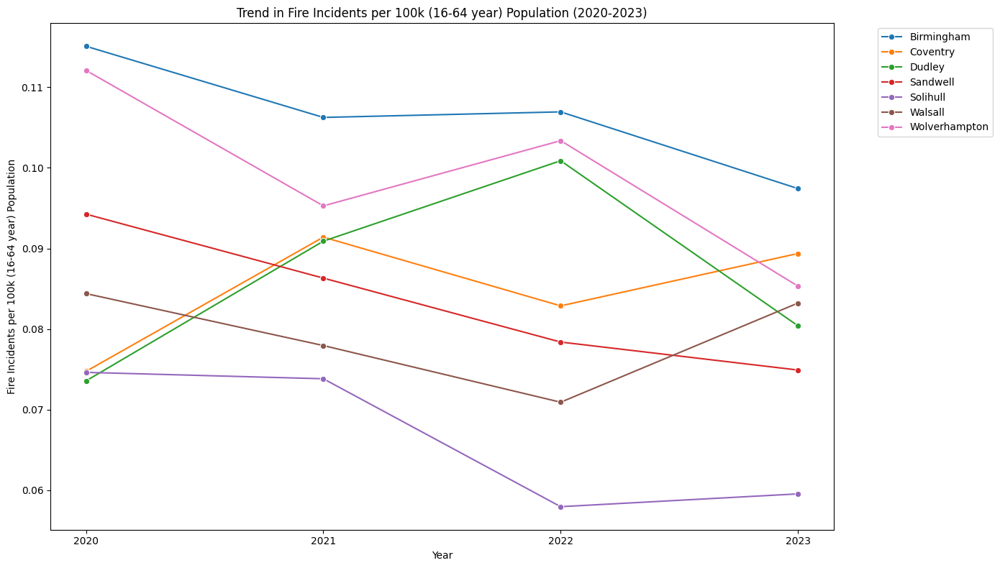

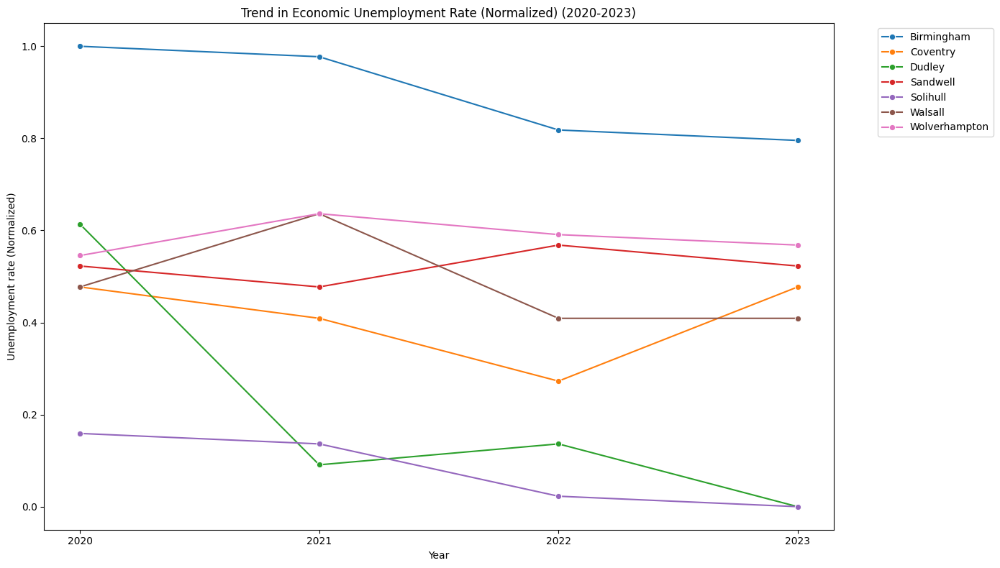

In [ ]:
# Filter labor_market_data
labor_market_filtered = labor_market_data[['District', 'Year', 'Unemployment rate (normalized)']]

# Merge the reshaped dataframes
merged_data_Unemployment = pd.merge(fire_data, labor_market_filtered, on=['District', 'Year'])

# Filter to show only data for years 2020, 2021, 2022, and 2023
merged_data_Unemployment_filtered = merged_data_Unemployment[merged_data_Unemployment['Year'].isin([2020, 2021, 2022, 2023])]

# Plotting
plt.figure(figsize=(14, 8))

# Plot for Fire incidents per 100k (16-64 year) Population
sns.lineplot(data=merged_data_inactivity_filtered, x='Year', y='Fire_100k (16-64 year) Population', hue='District', marker='o')
plt.title('Trend in Fire Incidents per 100k (16-64 year) Population (2020-2023)')
plt.xlabel('Year')
plt.ylabel('Fire Incidents per 100k (16-64 year) Population')
plt.xticks([2020, 2021, 2022, 2023])  # Set the x-axis ticks to only show the specified years
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Plot for Unemployment rate (normalized)
plt.figure(figsize=(14, 8))
sns.lineplot(data=merged_data_Unemployment, x='Year', y='Unemployment rate (normalized)', hue='District', marker='o')
plt.title('Trend in Economic Unemployment Rate (Normalized) (2020-2023)')
plt.xlabel('Year')
plt.ylabel('Unemployment rate (Normalized)')
plt.xticks([2020, 2021, 2022, 2023])  # Set the x-axis ticks to only show the specified years
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


#Plotting Combine trend of fire incidents per 100k (16-64 year) Population and Unemployment Rate #

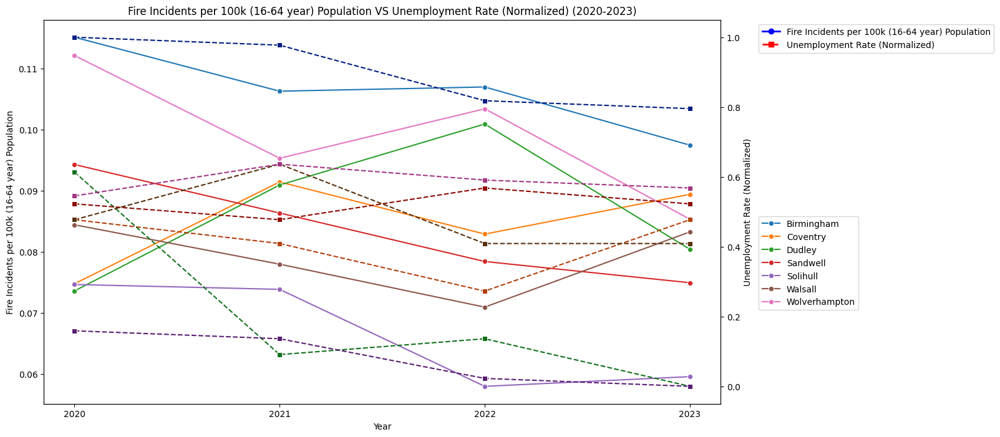

In [ ]:
# Plotting
fig, ax1 = plt.subplots(figsize=(14, 8))

# Line plot for Fire incidents per 100k (16-64 year) Population
sns.lineplot(data=merged_data_Unemployment, x='Year', y='Fire_100k (16-64 year) Population', hue='District', marker='o', linestyle='-', ax=ax1, palette='tab10')
ax1.set_xlabel('Year')
ax1.set_ylabel('Fire Incidents per 100k (16-64 year) Population')
ax1.set_title('Fire Incidents per 100k (16-64 year) Population VS Unemployment Rate (Normalized) (2020-2023)')

# Create a second y-axis for Unemployment rate (normalized)
ax2 = ax1.twinx()
sns.lineplot(data=merged_data_Unemployment, x='Year', y='Unemployment rate (normalized)', hue='District', marker='s', linestyle='--', ax=ax2, palette='dark', legend=False)
ax2.set_ylabel('Unemployment Rate (Normalized)')

# Create custom legend
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
custom_lines = [plt.Line2D([0], [0], color='b', lw=2, linestyle='-', marker='o'),
                plt.Line2D([0], [0], color='r', lw=2, linestyle='--', marker='s')]
ax2.legend(custom_lines, ['Fire Incidents per 100k (16-64 year) Population', 'Unemployment Rate (Normalized)'], loc='upper left', bbox_to_anchor=(1.05, 1))

# Adjust legend for districts
ax1.legend(handles1, labels1, loc='upper left', bbox_to_anchor=(1.05, 0.5))
plt.xticks([2020, 2021, 2022, 2023])
plt.show()

#Combined trend of **NORMALISED** fire incidents per 100k (16-64 year) Population and Unemployment Rate #

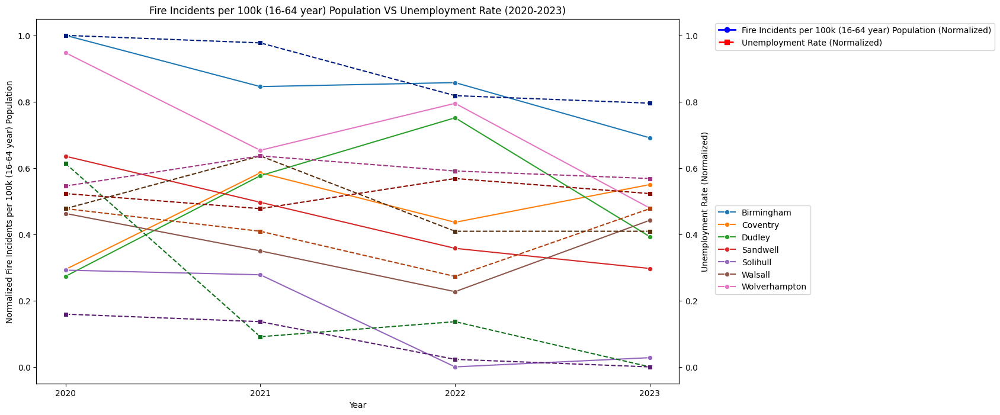

In [ ]:
# Normalize Fire_100k (16-64 year) Population
scaler = MinMaxScaler()
merged_data_Unemployment['Fire_100k (16-64 year) Population_normalized'] = scaler.fit_transform(merged_data_Unemployment[['Fire_100k (16-64 year) Population']])

# Plotting
fig, ax1 = plt.subplots(figsize=(14, 8))

# Line plot for normalized Fire incidents per 100k (16-64 year) Population
sns.lineplot(data=merged_data_Unemployment, x='Year', y='Fire_100k (16-64 year) Population_normalized', hue='District', marker='o', linestyle='-', ax=ax1, palette='tab10')
ax1.set_xlabel('Year')
ax1.set_ylabel('Normalized Fire Incidents per 100k (16-64 year) Population')
ax1.set_title('Fire Incidents per 100k (16-64 year) Population VS Unemployment Rate (2020-2023)')

# Create a second y-axis for Unemployment rate (normalized)
ax2 = ax1.twinx()
sns.lineplot(data=merged_data_Unemployment, x='Year', y='Unemployment rate (normalized)', hue='District', marker='s', linestyle='--', ax=ax2, palette='dark', legend=False)
ax2.set_ylabel('Unemployment Rate (Normalized)')

# Create custom legend
custom_lines = [plt.Line2D([0], [0], color='b', lw=2, linestyle='-', marker='o'),
                plt.Line2D([0], [0], color='r', lw=2, linestyle='--', marker='s')]
ax2.legend(custom_lines, ['Fire Incidents per 100k (16-64 year) Population (Normalized)', 'Unemployment Rate (Normalized)'], loc='upper left', bbox_to_anchor=(1.05, 1))

# Adjust legend for districts
handles1, labels1 = ax1.get_legend_handles_labels()
ax1.legend(handles1, labels1, loc='upper left', bbox_to_anchor=(1.05, 0.5))
plt.xticks([2020, 2021, 2022, 2023])

plt.show()

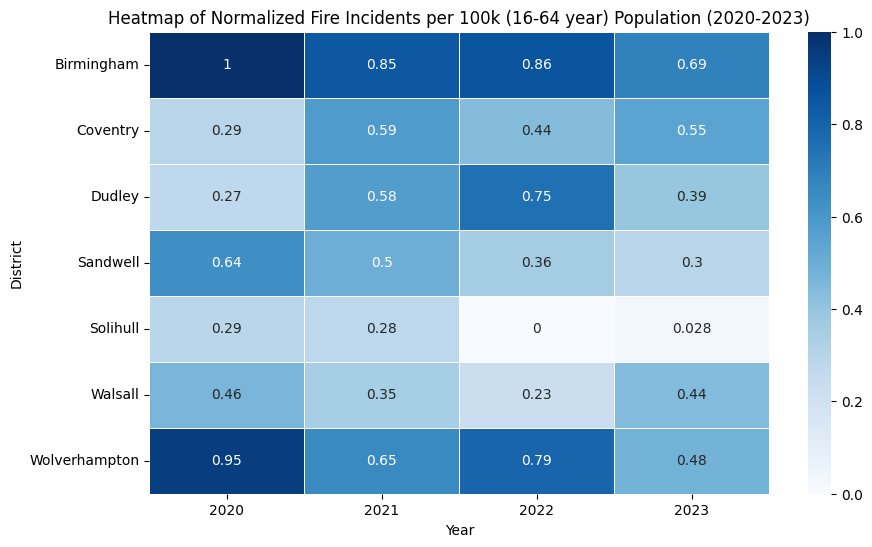

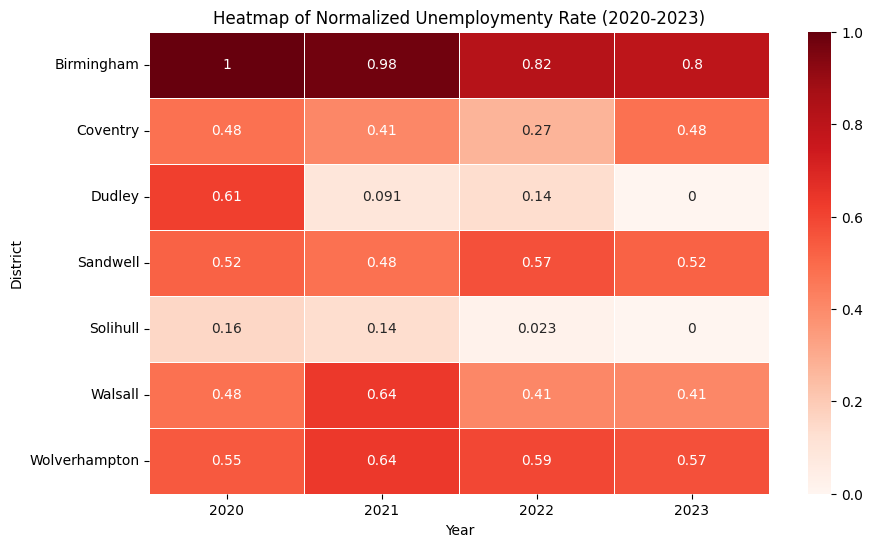

In [ ]:
# Pivot data for heatmaps
# For Fire Incidents per 100k Population (Normalized)
fire_heatmap_data = merged_data_Unemployment.pivot(index='District', columns='Year', values='Fire_100k (16-64 year) Population_normalized')

# For Economic Unemployment Rate (Normalized)
Unemployment_heatmap_data = merged_data_Unemployment.pivot(index='District', columns='Year', values='Unemployment rate (normalized)')

# Create heatmap for Fire Incidents
plt.figure(figsize=(10, 6))
sns.heatmap(fire_heatmap_data, annot=True, cmap='Blues', linewidths=0.5)
plt.title('Heatmap of Normalized Fire Incidents per 100k (16-64 year) Population (2020-2023)')
plt.xlabel('Year')
plt.ylabel('District')
plt.show()

# Create heatmap for Unemployment Rate
plt.figure(figsize=(10, 6))
sns.heatmap(Unemployment_heatmap_data, annot=True, cmap='Reds', linewidths=0.5)
plt.title('Heatmap of Normalized Unemploymenty Rate (2020-2023)')
plt.xlabel('Year')
plt.ylabel('District')
plt.show()


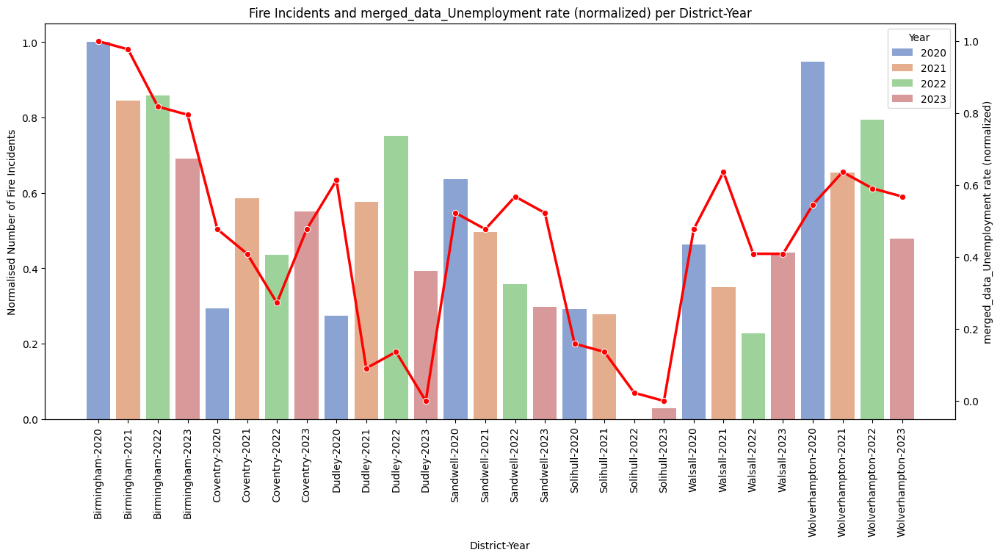

In [ ]:
# Create a new column to represent district-year
merged_data_Unemployment['District-Year'] = merged_data_Unemployment['District'] + '-' + merged_data_Unemployment['Year'].astype(str)

# Sort the data by District and then by Year
df_x = merged_data_Unemployment.sort_values(by=['District', 'Year'])

# Create a bar plot for fire incidents
fig, ax1 = plt.subplots(figsize=(16, 7))
sns.barplot(x='District-Year', y='Fire_100k (16-64 year) Population_normalized', data=df_x , ax=ax1, palette='muted', alpha=0.7, hue='Year')
ax1.set_xlabel('District-Year')
ax1.set_ylabel('Normalised Number of Fire Incidents')
ax1.set_title('Fire Incidents and merged_data_Unemployment rate (normalized) per District-Year')
plt.xticks(rotation=90)

# Line plot for merged_data_Unemployment rate score
ax2 = ax1.twinx()
sns.lineplot(x='District-Year', y='Unemployment rate (normalized)', data=df_x , ax=ax2, color='red', linewidth=2.5, marker='o', sort=False)
ax2.set_ylabel('merged_data_Unemployment rate (normalized)')

plt.show()

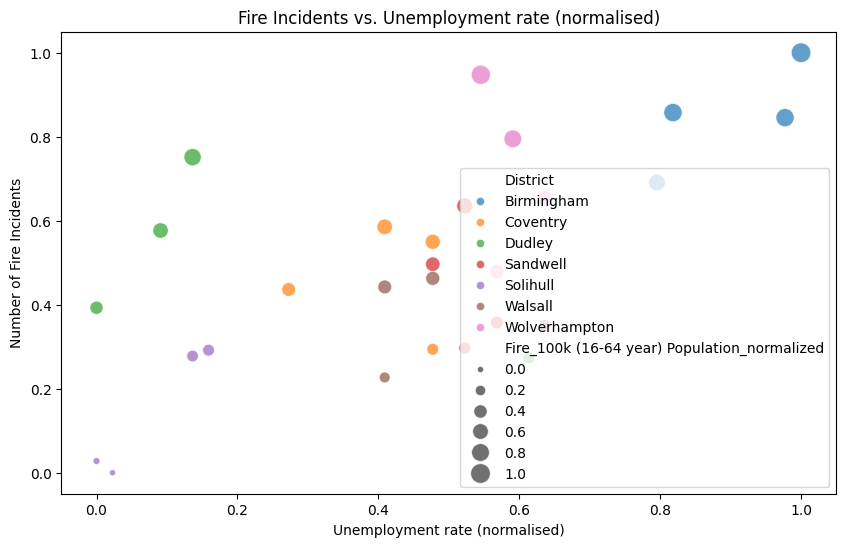

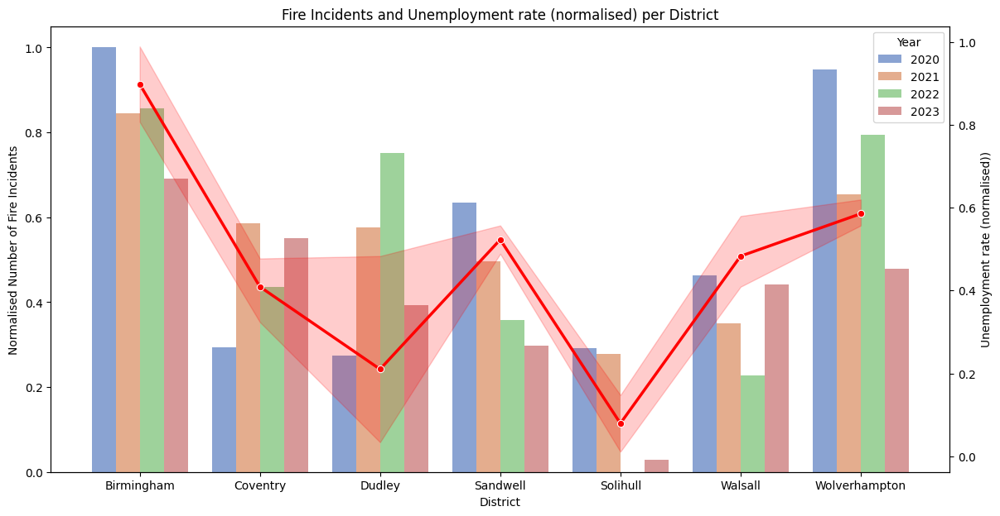

In [ ]:
# Scatter Plot: Fire Incidents vs. Unemployment rate (normalized)
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Unemployment rate (normalized)', y='Fire_100k (16-64 year) Population_normalized', hue='District', size='Fire_100k (16-64 year) Population_normalized', sizes=(20, 200), data=merged_data_Unemployment, alpha=0.7)

plt.title('Fire Incidents vs. Unemployment rate (normalised)')
plt.xlabel('Unemployment rate (normalised)')
plt.ylabel('Number of Fire Incidents')
plt.show()

# Combined Bar and Line Chart
fig, ax1 = plt.subplots(figsize=(14, 7))

# Bar plot for fire incidents
sns.barplot(x='District', y='Fire_100k (16-64 year) Population_normalized', hue='Year', data=merged_data_Unemployment, ax=ax1, palette='muted', alpha=0.7)
ax1.set_xlabel('District')
ax1.set_ylabel('Normalised Number of Fire Incidents')
ax1.set_title('Fire Incidents and Unemployment rate (normalised) per District')

# Line plot for Unemployment rate (normalized)
ax2 = ax1.twinx()
sns.lineplot(x='District', y='Unemployment rate (normalized)', data=merged_data_Unemployment, ax=ax2, color='red', linewidth=2.5, marker='o', sort=False)
ax2.set_ylabel('Unemployment rate (normalised))')

plt.show()

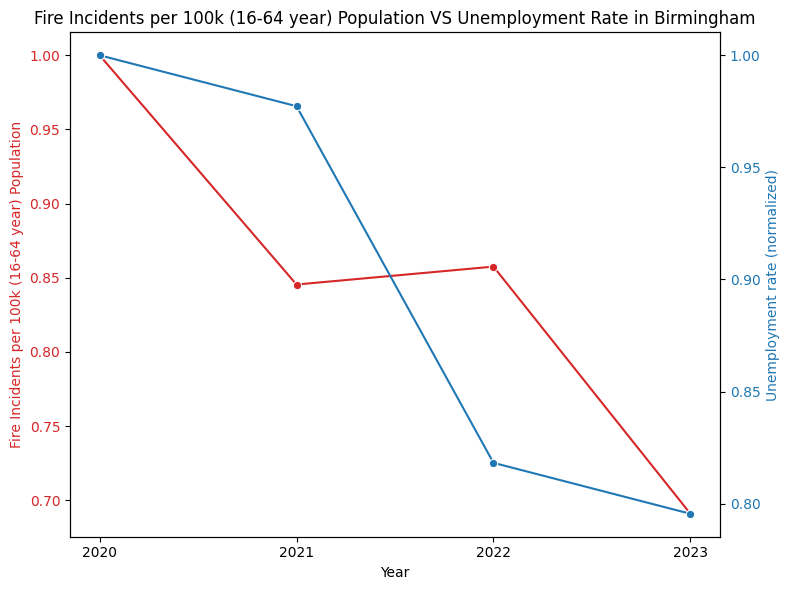

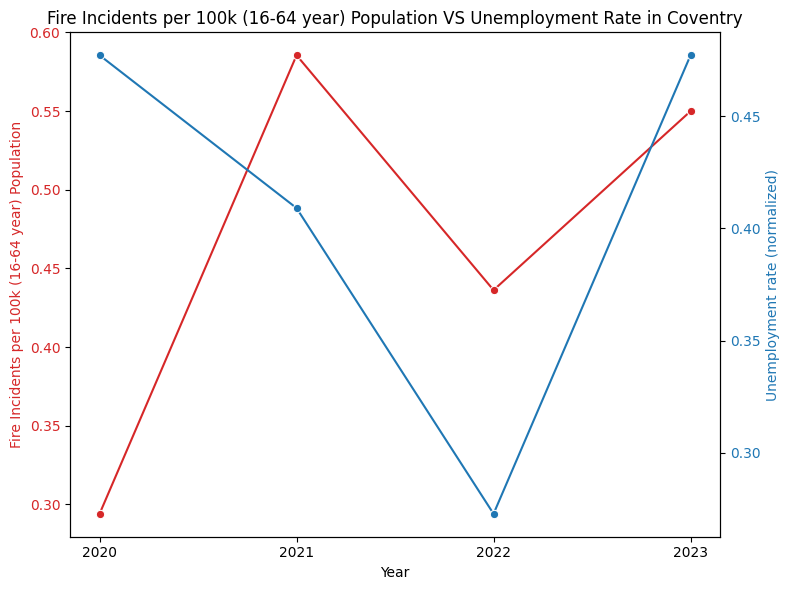

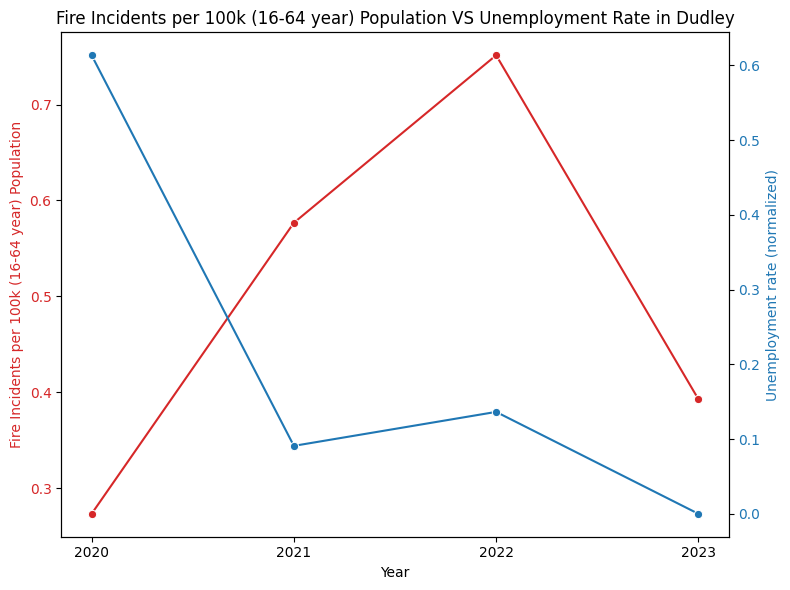

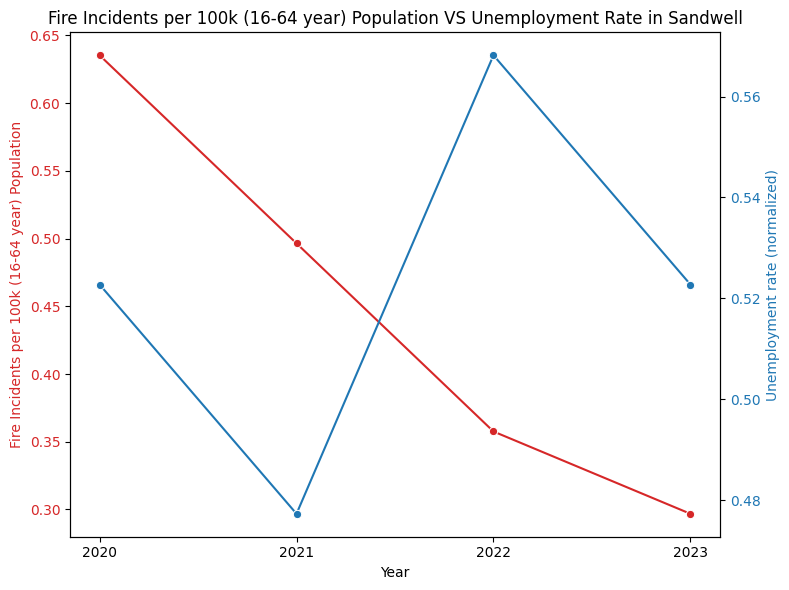

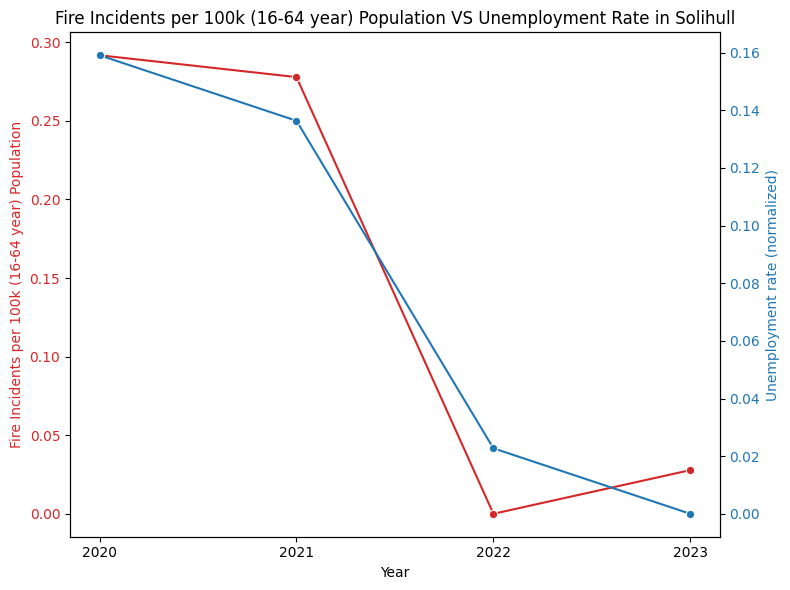

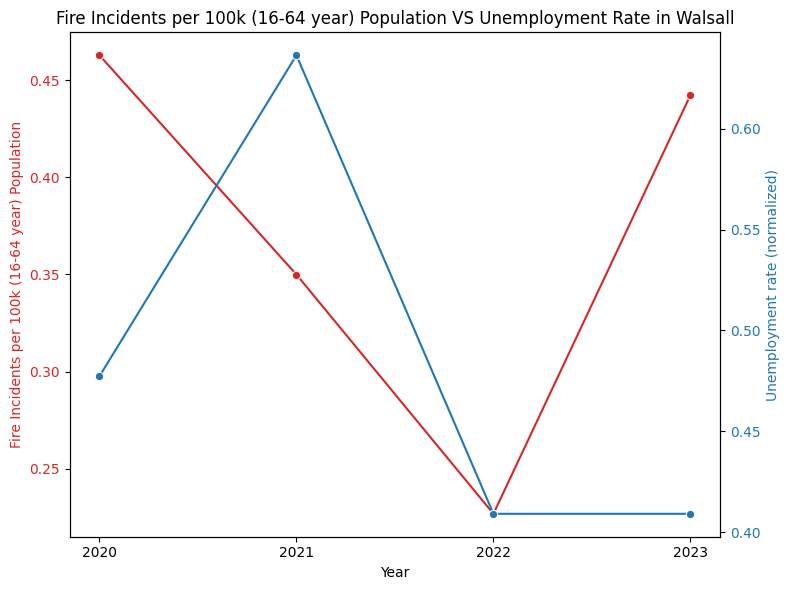

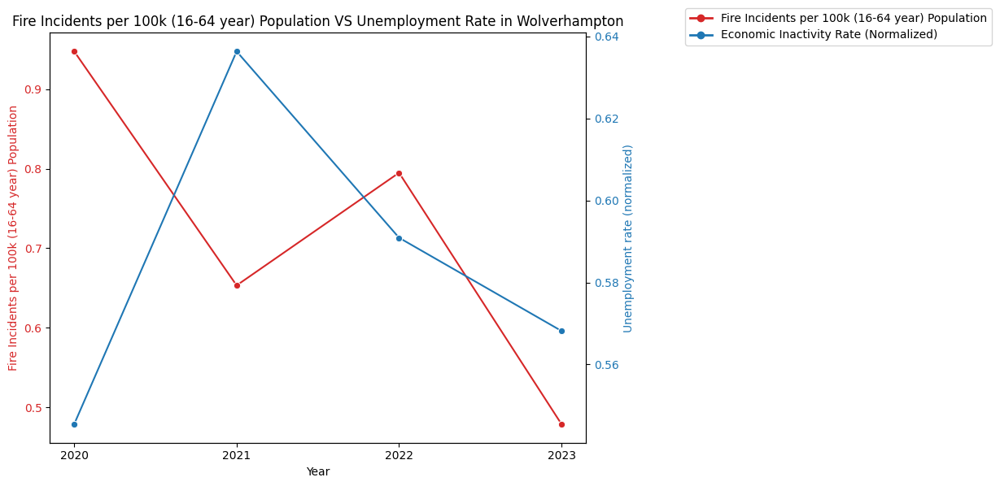

In [ ]:

# Plotting for each district

for district in districts:


    district_data = merged_data_Unemployment[merged_data_Unemployment['District'] == district]

    fig, ax1 = plt.subplots(figsize=(8, 6))

    color = 'tab:red'
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Fire Incidents per 100k (16-64 year) Population', color=color)
    sns.lineplot(data=district_data, x='Year', y='Fire_100k (16-64 year) Population_normalized', marker='o', ax=ax1, color=color, legend=False)  # Disable automatic legend
    ax1.tick_params(axis='y', labelcolor=color)

    # Second y-axis: Unemployment rate
    ax2 = ax1.twinx()
    color = 'tab:blue'
    ax2.set_ylabel('Unemployment rate (normalized)', color=color)
    sns.lineplot(data=district_data, x='Year', y='Unemployment rate (normalized)', marker='o', ax=ax2, color=color, legend=False)  # Disable automatic legend
    ax2.tick_params(axis='y', labelcolor=color)


    # Create custom legend handles
   # legend_handles = [Line2D([0], [0], color='tab:red', lw=2, marker='o', label='Fire Incidents per 100k (16-64 year) Population'),
    #                  Line2D([0], [0], color='tab:blue', lw=2, marker='o', label='Unemployment Rate (Normalized)')]

    # Manually add the legend with colors
    #fig.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.title(f'Fire Incidents per 100k (16-64 year) Population VS Unemployment Rate in {district}')
    plt.xticks([2020, 2021, 2022, 2023])
    fig.tight_layout()
   # plt.show()
fig.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1), loc='upper left')
legend_handles = [Line2D([0], [0], color='tab:red', lw=2, marker='o', label='Fire Incidents per 100k (16-64 year) Population'),
                      Line2D([0], [0], color='tab:blue', lw=2, marker='o', label='Economic Inactivity Rate (Normalized)')]
plt.show()


#SOALLLLLL: may not needed ???? ya balayee? to report balayee ro neveshtam#

***Using The same scale Unit for both Y- axis (Normalised Fire Incidents and Unemployment) [maybe not needed]***

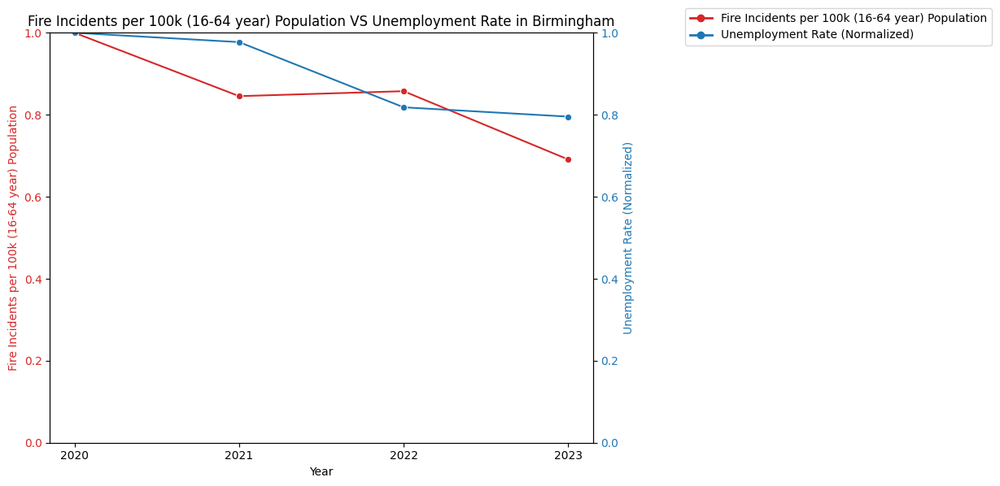

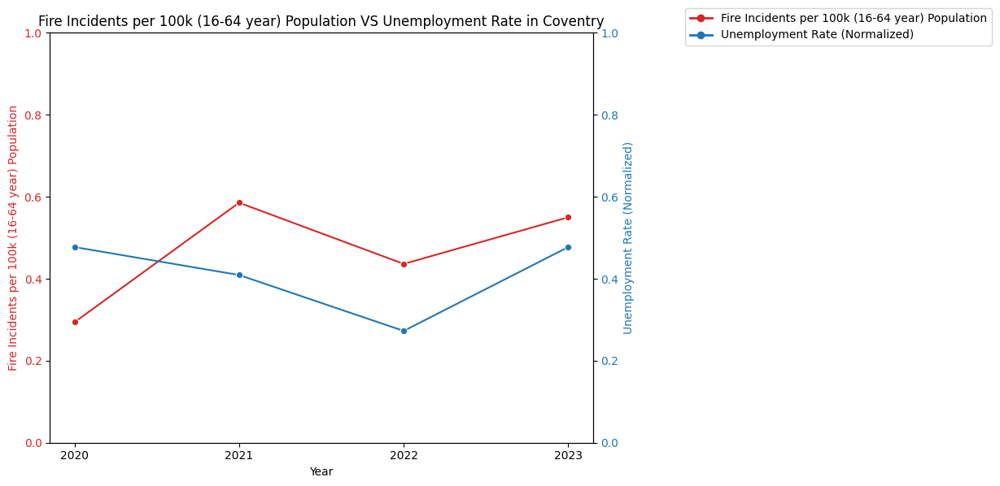

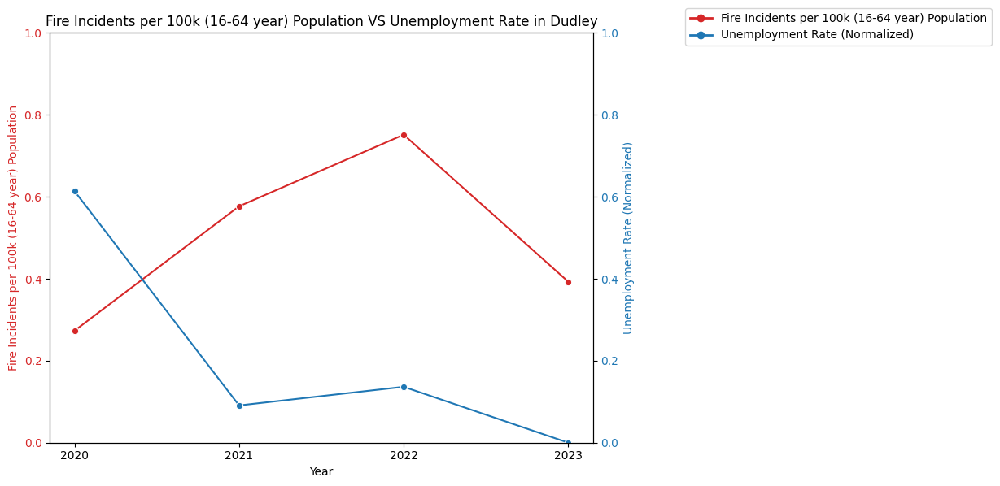

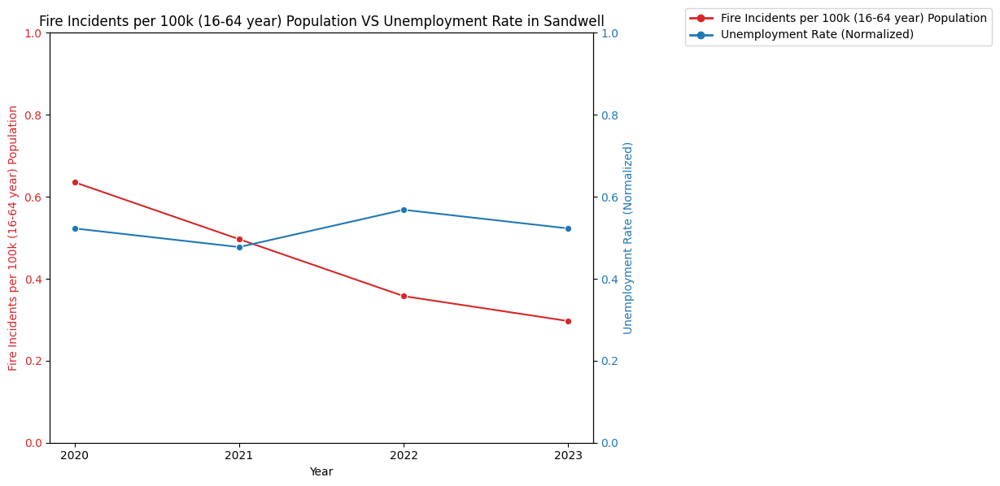

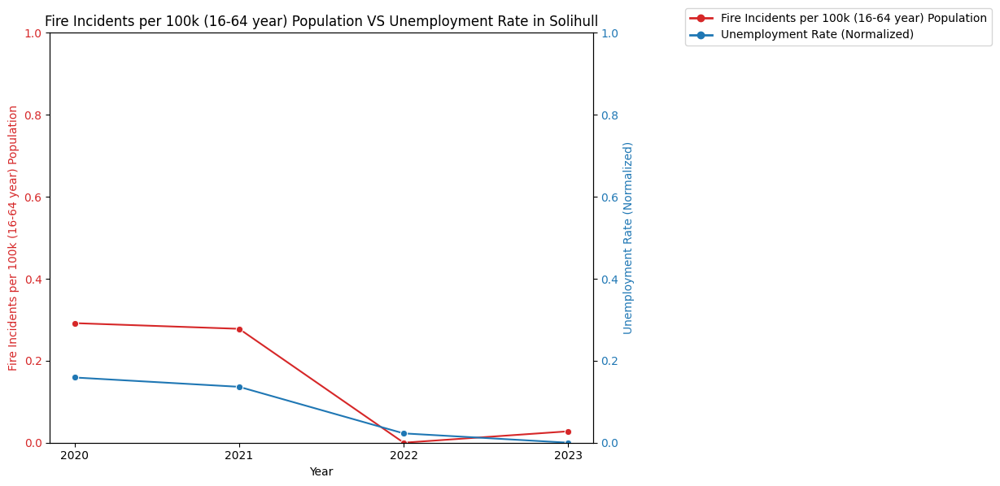

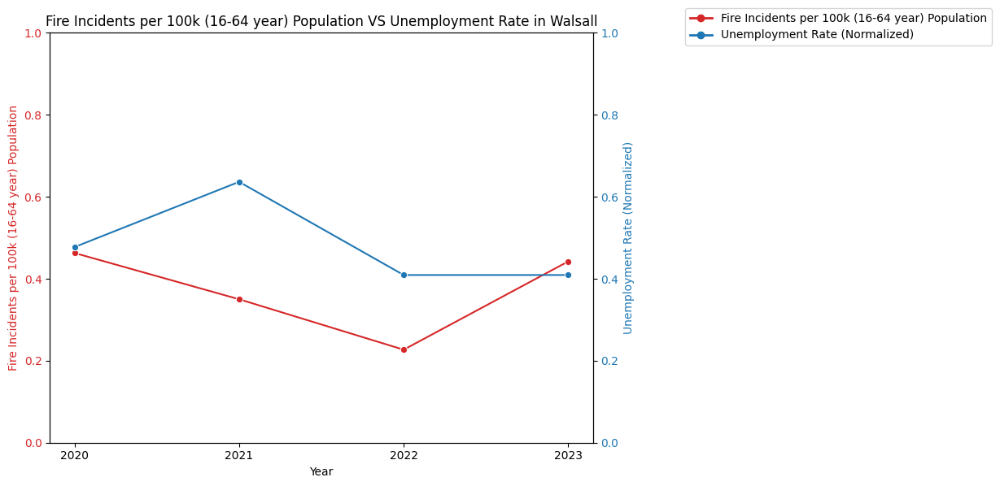

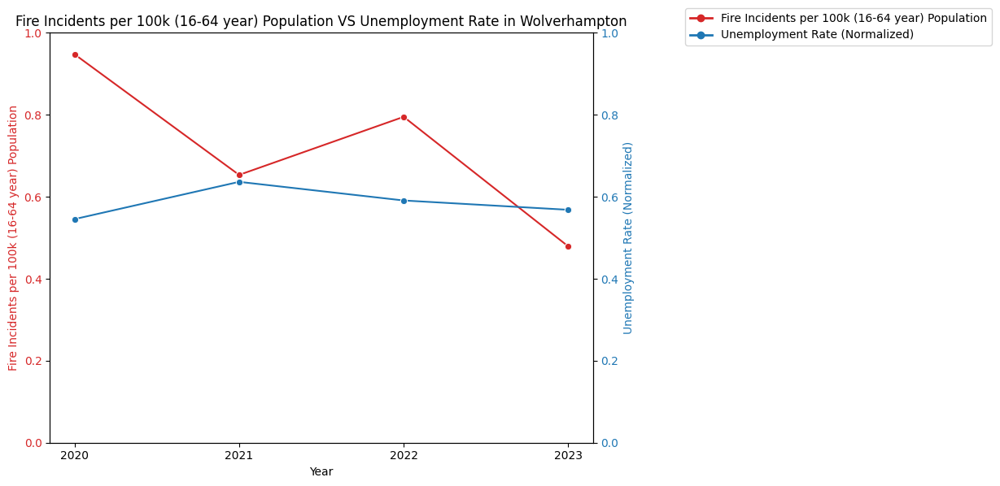

In [ ]:
from matplotlib.lines import Line2D

for district in districts:
    district_data = merged_data_Unemployment[merged_data_Unemployment['District'] == district]

    fig, ax1 = plt.subplots(figsize=(8, 6))

    # First y-axis: Fire incidents
    color = 'tab:red'
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Fire Incidents per 100k (16-64 year) Population', color=color)
    sns.lineplot(data=district_data, x='Year', y='Fire_100k (16-64 year) Population_normalized', marker='o', ax=ax1, color=color, legend=False)  # Disable automatic legend
    ax1.tick_params(axis='y', labelcolor=color)

    # Set y-axis limit for both axes to be consistent (since both are normalized)
    ax1.set_ylim(0, 1)

    # Second y-axis: Unemployment rate
    ax2 = ax1.twinx()
    color = 'tab:blue'
    ax2.set_ylabel('Unemployment Rate (Normalized)', color=color)
    sns.lineplot(data=district_data, x='Year', y='Unemployment rate (normalized)', marker='o', ax=ax2, color=color, legend=False)  # Disable automatic legend
    ax2.tick_params(axis='y', labelcolor=color)

    # Set the same y-axis limit for the second axis
    ax2.set_ylim(0, 1)

    # Create custom legend handles
    legend_handles = [Line2D([0], [0], color='tab:red', lw=2, marker='o', label='Fire Incidents per 100k (16-64 year) Population'),
                      Line2D([0], [0], color='tab:blue', lw=2, marker='o', label='Unemployment Rate (Normalized)')]

    # Manually add the legend with colors
    fig.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.title(f'Fire Incidents per 100k (16-64 year) Population VS Unemployment Rate in {district}')
    plt.xticks([2020, 2021, 2022, 2023])
    fig.tight_layout()
    plt.show()


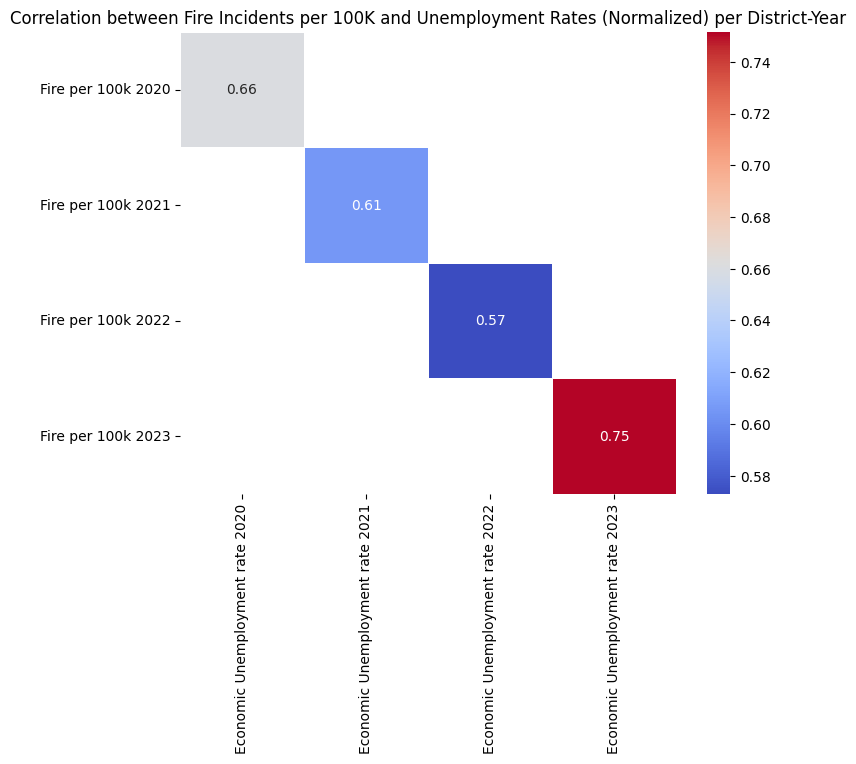

In [ ]:
df = pd.DataFrame(merged_data_Unemployment)

# Create a new DataFrame for correlation analysis, focusing on pairs for each year
df_corr = df.pivot(index='District-Year', columns='Year', values=['Fire_100k (16-64 year) Population_normalized', 'Unemployment rate (normalized)'])

# Calculate the correlation matrix
corr_matrix = df_corr.corr()

# We are interested in correlations between Fire and Unemployment Rates for the same years
fire_cols = [col for col in corr_matrix.columns if 'Fire_100k (16-64 year) Population_normalized' in col]
Unemployment_cols = [col for col in corr_matrix.columns if 'Unemployment rate (normalized)' in col]

# Extract the relevant correlations
corr_to_plot = corr_matrix.loc[fire_cols, Unemployment_cols]

# Rename the columns for easier readability
corr_to_plot.columns = [f'Unemployment rate {year}' for year in corr_to_plot.columns.get_level_values(1)]
corr_to_plot.index = [f'Fire per 100k {year}' for year in corr_to_plot.index.get_level_values(1)]

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr_to_plot, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation between Fire Incidents per 100K and Unemployment Rates (Normalized) per District-Year')
plt.show()


#**Median Weekly Pay**#

In [ ]:
labor_market_data.head()

,Area code,District,Year,Economic inactivity rate (%),unemployment rate (%),median weekly pay(£),Economic inactivity rate (normalized),Unemployment rate (normalized),Median weekly pay (normalized)
0,E08000025,Birmingham,2020,28.2,8.1,447.6,0.734266,1.000000,0.128311
1,E08000025,Birmingham,2021,28.6,8,465.8,0.762238,0.977273,0.211416
2,E08000025,Birmingham,2022,28.6,7.3,499.9,0.762238,0.818182,0.367123
3,E08000025,Birmingham,2023,28.3,7.2,527,0.741259,0.795455,0.490868
4,E08000026,Coventry,2020,24,5.8,462.9,0.440559,0.477273,0.198174


#Plotting trend of fire incidents per 100k Population and Median Weekly Pay #

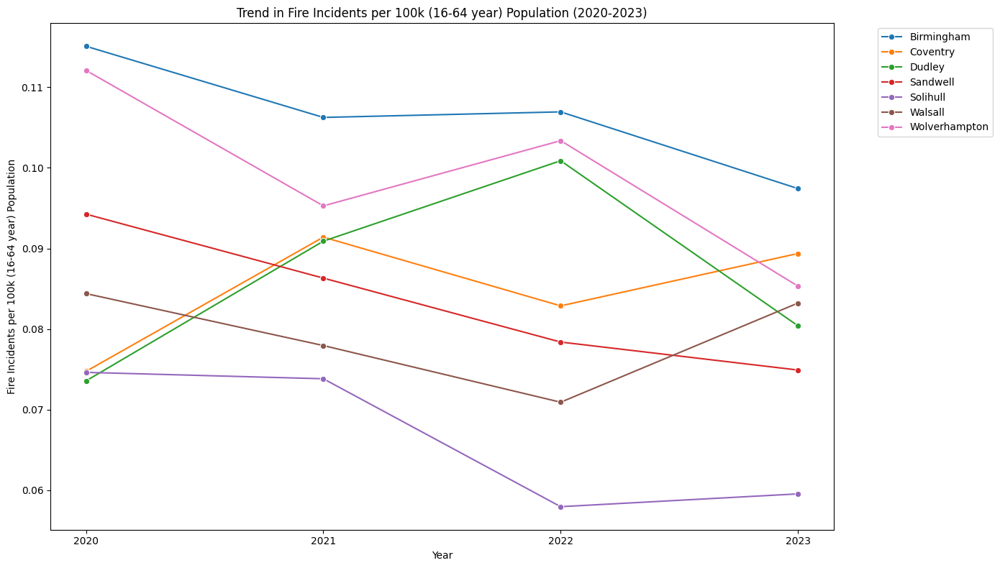

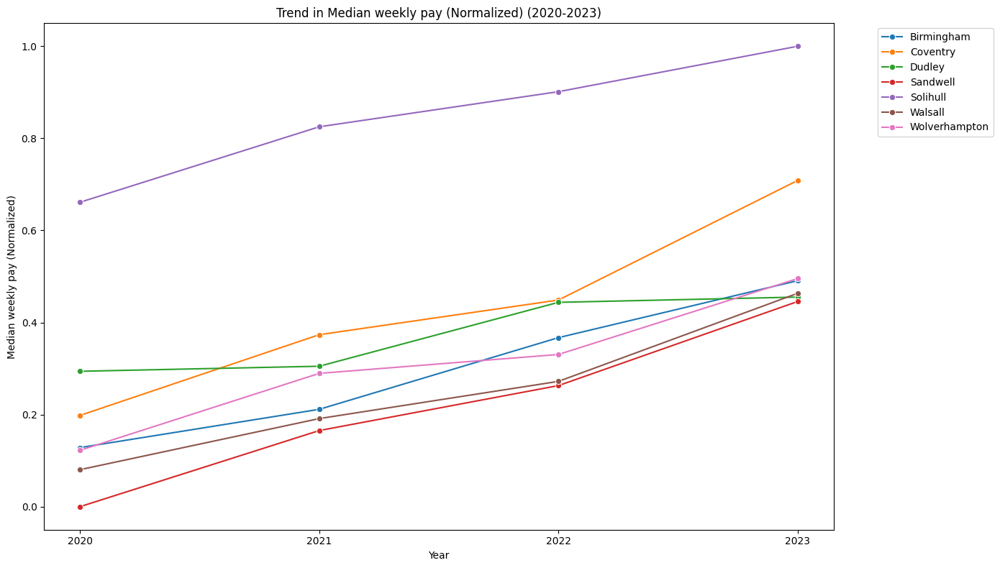

In [ ]:
# Filter labor_market_data
labor_market_filtered = labor_market_data[['District', 'Year', 'Median weekly pay (normalized)']]

# Merge the reshaped dataframes
merged_data_Weekly_pay = pd.merge(fire_data, labor_market_filtered, on=['District', 'Year'])

# Filter to show only data for years 2020, 2021, 2022, and 2023
merged_data_Weekly_pay_filtered = merged_data_Weekly_pay[merged_data_Weekly_pay['Year'].isin([2020, 2021, 2022, 2023])]

# Plotting
plt.figure(figsize=(14, 8))

# Plot for Fire incidents per 100k (16-64 year) Population
sns.lineplot(data=merged_data_Weekly_pay_filtered, x='Year', y='Fire_100k (16-64 year) Population', hue='District', marker='o')
plt.title('Trend in Fire Incidents per 100k (16-64 year) Population (2020-2023)')
plt.xlabel('Year')
plt.ylabel('Fire Incidents per 100k (16-64 year) Population')
plt.xticks([2020, 2021, 2022, 2023])  # Set the x-axis ticks to only show the specified years
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Plot for Median weekly pay (normalized)
plt.figure(figsize=(14, 8))
sns.lineplot(data=merged_data_Weekly_pay_filtered, x='Year', y='Median weekly pay (normalized)', hue='District', marker='o')
plt.title('Trend in Median weekly pay (Normalized) (2020-2023)')
plt.xlabel('Year')
plt.ylabel('Median weekly pay (Normalized)')
plt.xticks([2020, 2021, 2022, 2023])  # Set the x-axis ticks to only show the specified years
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


#Plotting Combine trend of fire incidents per 100k (16-64 year) Population and  Median Weekly Pay #

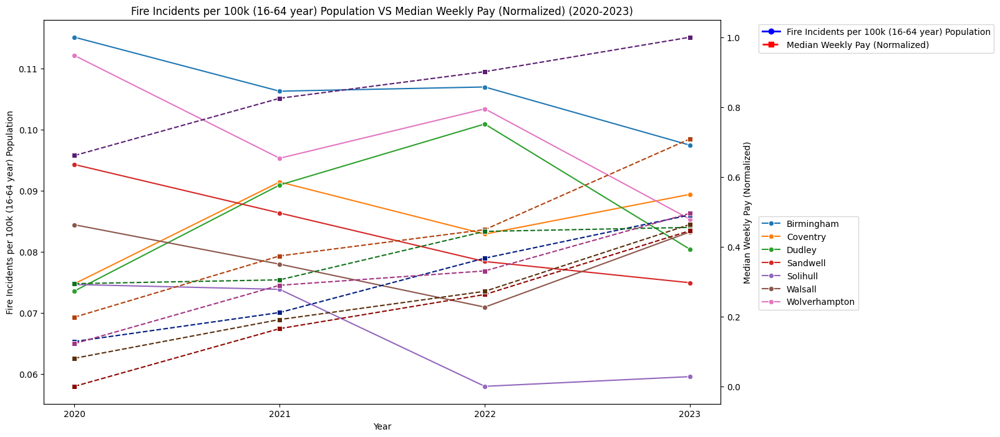

In [ ]:
# Plotting
fig, ax1 = plt.subplots(figsize=(14, 8))

# Line plot for Fire incidents per 100k (16-64 year) Population
sns.lineplot(data=merged_data_Weekly_pay, x='Year', y='Fire_100k (16-64 year) Population', hue='District', marker='o', linestyle='-', ax=ax1, palette='tab10')
ax1.set_xlabel('Year')
ax1.set_ylabel('Fire Incidents per 100k (16-64 year) Population')
ax1.set_title('Fire Incidents per 100k (16-64 year) Population VS Median Weekly Pay (Normalized) (2020-2023)')

# Create a second y-axis for Median Weekly Pay (normalized)
ax2 = ax1.twinx()
sns.lineplot(data=merged_data_Weekly_pay, x='Year', y='Median weekly pay (normalized)', hue='District', marker='s', linestyle='--', ax=ax2, palette='dark', legend=False)
ax2.set_ylabel('Median Weekly Pay (Normalized)')

# Create custom legend
handles1, labels1 = ax1.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()
custom_lines = [plt.Line2D([0], [0], color='b', lw=2, linestyle='-', marker='o'),
                plt.Line2D([0], [0], color='r', lw=2, linestyle='--', marker='s')]
ax2.legend(custom_lines, ['Fire Incidents per 100k (16-64 year) Population', 'Median Weekly Pay (Normalized)'], loc='upper left', bbox_to_anchor=(1.05, 1))

# Adjust legend for districts
ax1.legend(handles1, labels1, loc='upper left', bbox_to_anchor=(1.05, 0.5))
plt.xticks([2020, 2021, 2022, 2023])
plt.show()

#Combined trend of **NORMALISED** fire incidents per 100k Population and Median weekly pay#

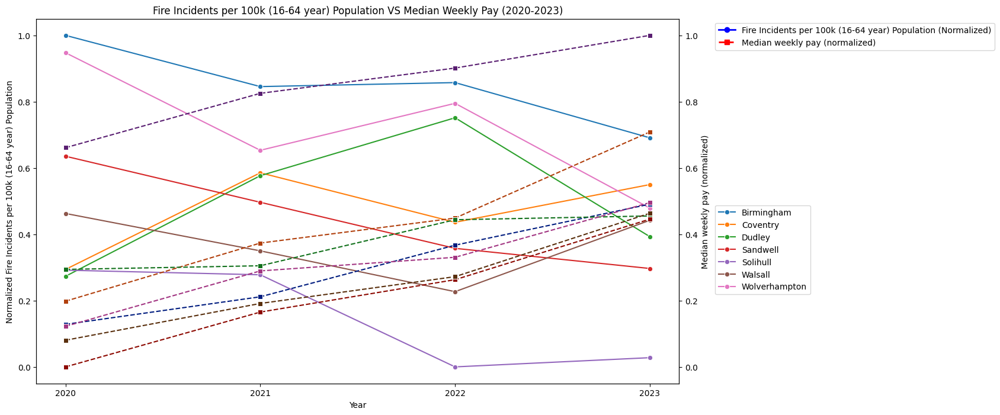

In [ ]:
# Normalize Fire_100k (16-64 year) Population
scaler = MinMaxScaler()
merged_data_Weekly_pay['Fire_100k (16-64 year) Population_normalized'] = scaler.fit_transform(merged_data_Weekly_pay[['Fire_100k (16-64 year) Population']])

# Plotting
fig, ax1 = plt.subplots(figsize=(14, 8))

# Line plot for normalized Fire incidents per 100k (16-64 year) Population
sns.lineplot(data=merged_data_Weekly_pay, x='Year', y='Fire_100k (16-64 year) Population_normalized', hue='District', marker='o', linestyle='-', ax=ax1, palette='tab10')
ax1.set_xlabel('Year')
ax1.set_ylabel('Normalized Fire Incidents per 100k (16-64 year) Population')
ax1.set_title('Fire Incidents per 100k (16-64 year) Population VS Median Weekly Pay (2020-2023)')

# Create a second y-axis for Median weekly pay (normalized)
ax2 = ax1.twinx()
sns.lineplot(data=merged_data_Weekly_pay, x='Year', y='Median weekly pay (normalized)', hue='District', marker='s', linestyle='--', ax=ax2, palette='dark', legend=False)
ax2.set_ylabel('Median weekly pay (normalized)')

# Create custom legend
custom_lines = [plt.Line2D([0], [0], color='b', lw=2, linestyle='-', marker='o'),
                plt.Line2D([0], [0], color='r', lw=2, linestyle='--', marker='s')]
ax2.legend(custom_lines, ['Fire Incidents per 100k (16-64 year) Population (Normalized)', 'Median weekly pay (normalized)'], loc='upper left', bbox_to_anchor=(1.05, 1))

# Adjust legend for districts
handles1, labels1 = ax1.get_legend_handles_labels()
ax1.legend(handles1, labels1, loc='upper left', bbox_to_anchor=(1.05, 0.5))
plt.xticks([2020, 2021, 2022, 2023])

plt.show()

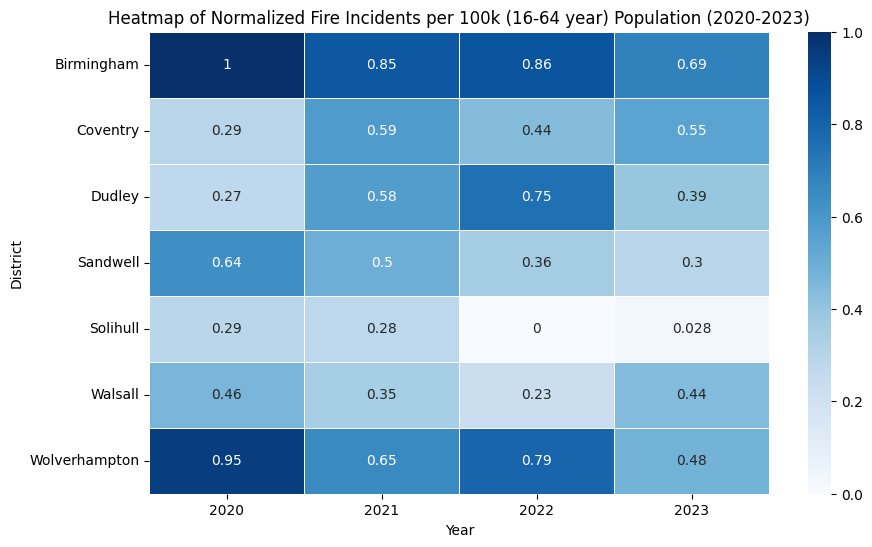

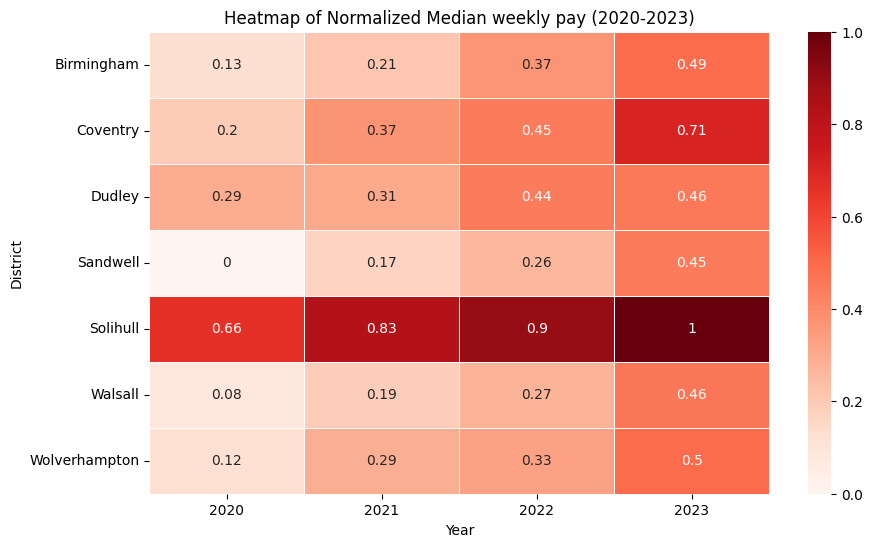

In [ ]:
# Pivot data for heatmaps
# For Fire Incidents per 100k Population (Normalized)
fire_heatmap_data = merged_data_Weekly_pay.pivot(index='District', columns='Year', values='Fire_100k (16-64 year) Population_normalized')

# For Median weekly pay (Normalized)
Weekly_pay_heatmap_data = merged_data_Weekly_pay.pivot(index='District', columns='Year', values='Median weekly pay (normalized)')

# Create heatmap for Fire Incidents
plt.figure(figsize=(10, 6))
sns.heatmap(fire_heatmap_data, annot=True, cmap='Blues', linewidths=0.5)
plt.title('Heatmap of Normalized Fire Incidents per 100k (16-64 year) Population (2020-2023)')
plt.xlabel('Year')
plt.ylabel('District')
plt.show()

# Create heatmap for Median weekly pay
plt.figure(figsize=(10, 6))
sns.heatmap(Weekly_pay_heatmap_data, annot=True, cmap='Reds', linewidths=0.5)
plt.title('Heatmap of Normalized Median weekly pay (2020-2023)')
plt.xlabel('Year')
plt.ylabel('District')
plt.show()


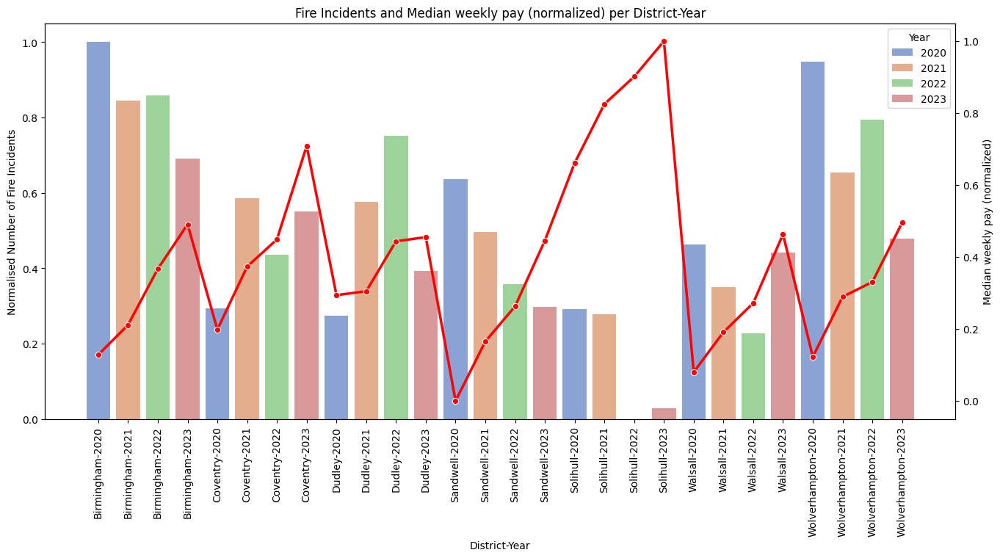

In [ ]:
# Create a new column to represent district-year
merged_data_Weekly_pay['District-Year'] = merged_data_Weekly_pay['District'] + '-' + merged_data_Weekly_pay['Year'].astype(str)

# Sort the data by District and then by Year
df_x = merged_data_Weekly_pay.sort_values(by=['District', 'Year'])

# Create a bar plot for fire incidents
fig, ax1 = plt.subplots(figsize=(16, 7))
sns.barplot(x='District-Year', y='Fire_100k (16-64 year) Population_normalized', data=df_x , ax=ax1, palette='muted', alpha=0.7, hue='Year')
ax1.set_xlabel('District-Year')
ax1.set_ylabel('Normalised Number of Fire Incidents')
ax1.set_title('Fire Incidents and Median weekly pay (normalized) per District-Year')
plt.xticks(rotation=90)

# Line plot for merged_data_Unemployment rate score
ax2 = ax1.twinx()
sns.lineplot(x='District-Year', y='Median weekly pay (normalized)', data=df_x , ax=ax2, color='red', linewidth=2.5, marker='o', sort=False)
ax2.set_ylabel('Median weekly pay (normalized)')

plt.show()

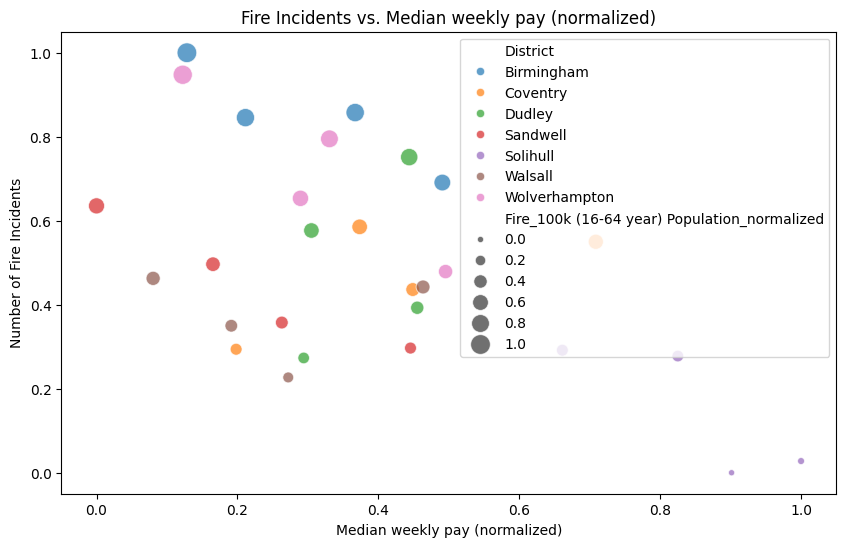

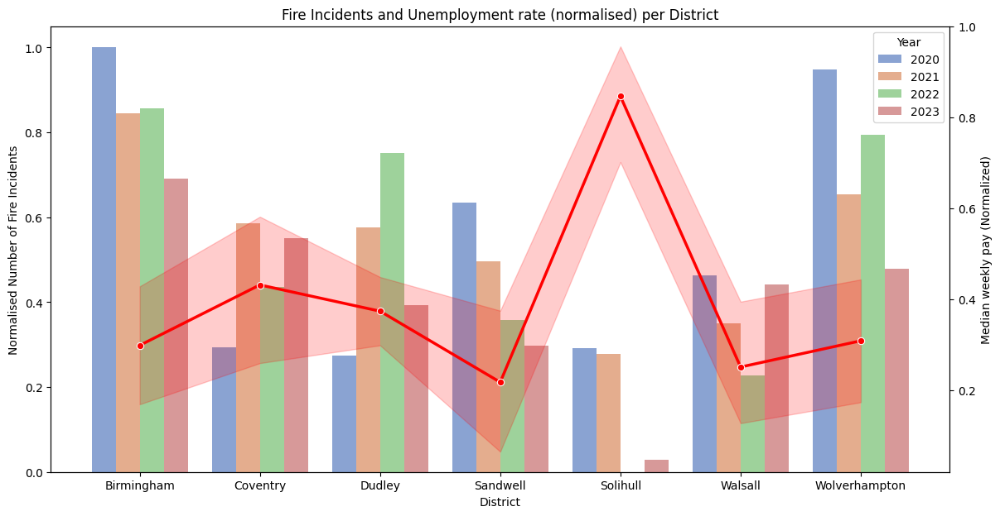

In [ ]:
# Scatter Plot: Fire Incidents vs. Weekly pay
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Median weekly pay (normalized)', y='Fire_100k (16-64 year) Population_normalized', hue='District', size='Fire_100k (16-64 year) Population_normalized', sizes=(20, 200), data=merged_data_Weekly_pay, alpha=0.7)

plt.title('Fire Incidents vs. Median weekly pay (normalized)')
plt.xlabel('Median weekly pay (normalized)')
plt.ylabel('Number of Fire Incidents')
plt.show()

# Combined Bar and Line Chart
fig, ax1 = plt.subplots(figsize=(14, 7))

# Bar plot for fire incidents
sns.barplot(x='District', y='Fire_100k (16-64 year) Population_normalized', hue='Year', data=merged_data_Weekly_pay, ax=ax1, palette='muted', alpha=0.7)
ax1.set_xlabel('District')
ax1.set_ylabel('Normalised Number of Fire Incidents')
ax1.set_title('Fire Incidents and Unemployment rate (normalised) per District')

# Line plot for Median weekly pay (normalized)
ax2 = ax1.twinx()
sns.lineplot(x='District', y='Median weekly pay (normalized)', data=merged_data_Weekly_pay, ax=ax2, color='red', linewidth=2.5, marker='o', sort=False)
ax2.set_ylabel('Median weekly pay (Normalized)')

plt.show()

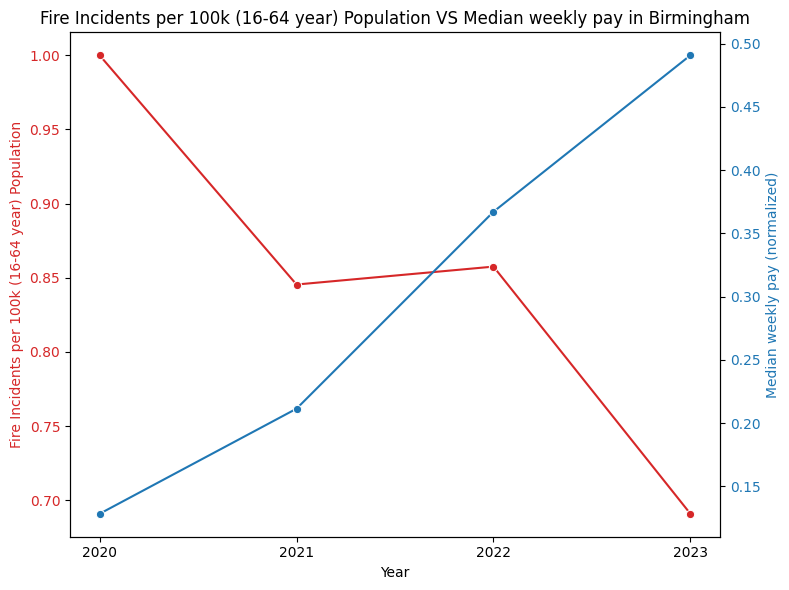

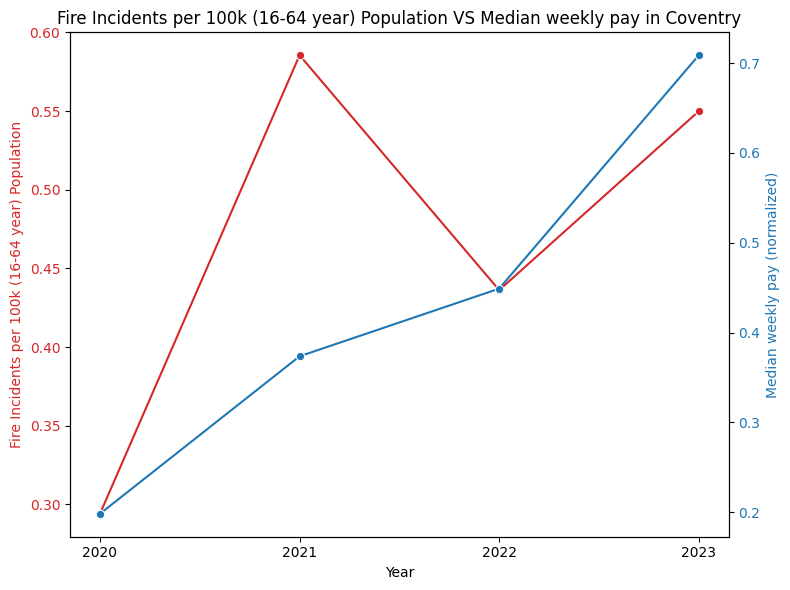

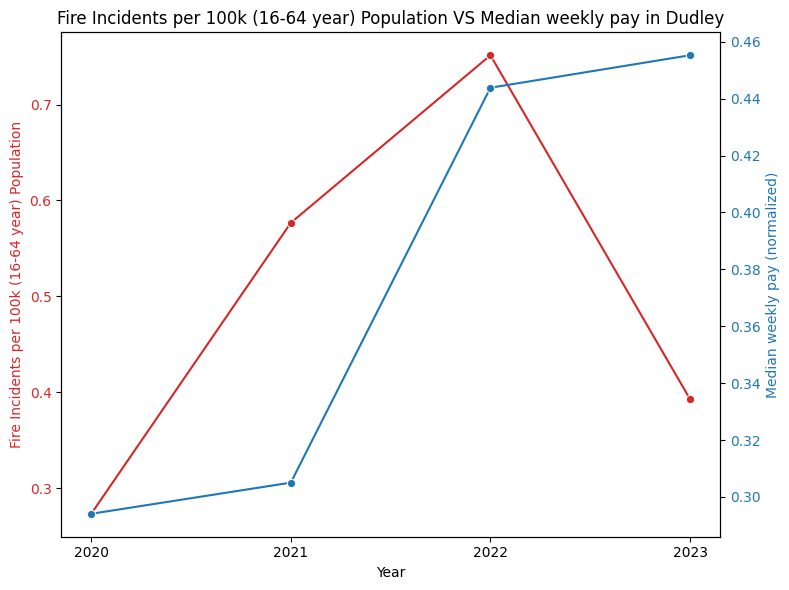

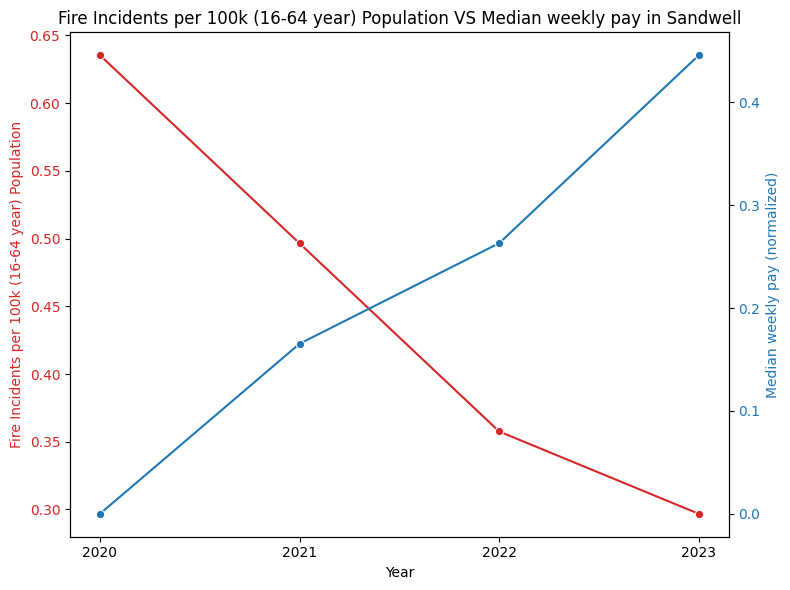

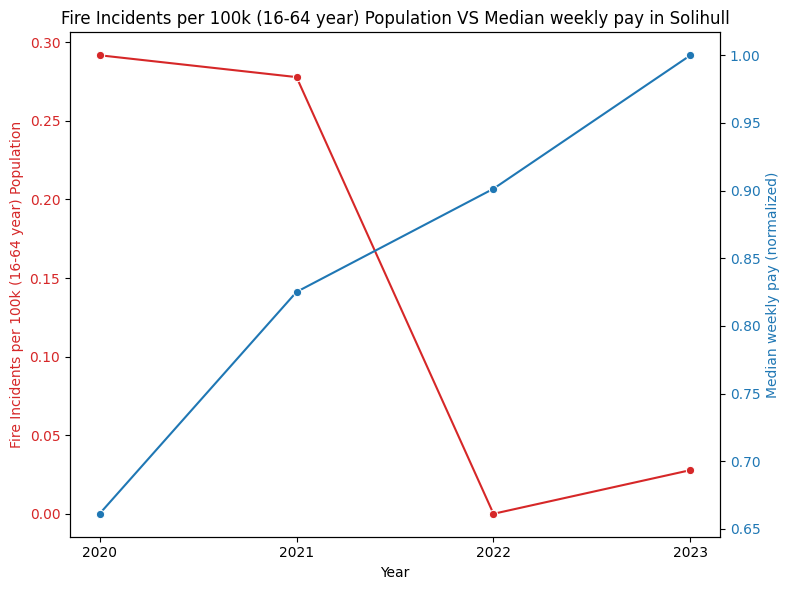

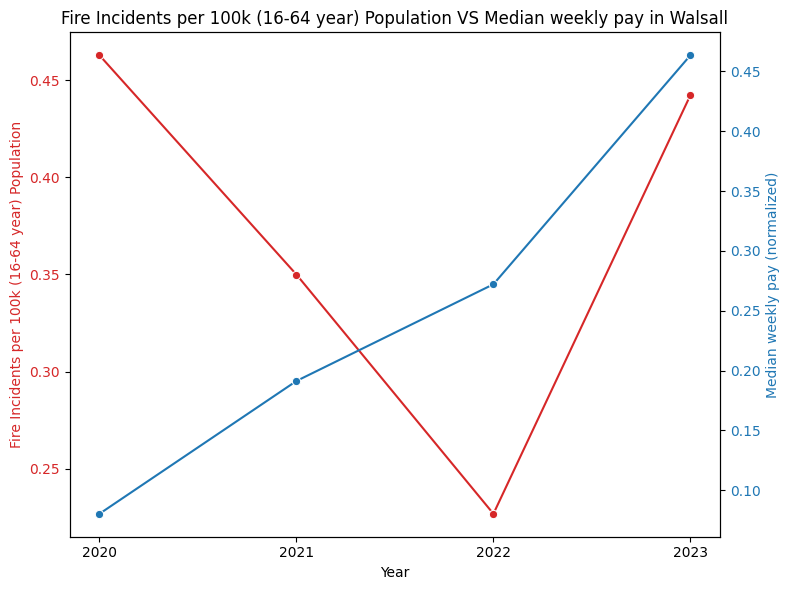

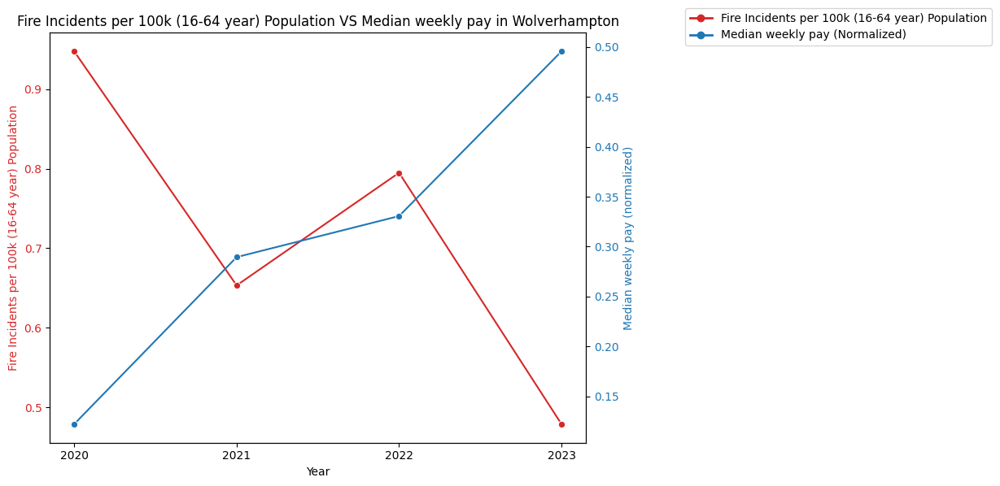

In [ ]:
#Plotting for each district

for district in districts:
    district_data = merged_data_Weekly_pay[merged_data_Weekly_pay['District'] == district]

    fig, ax1 = plt.subplots(figsize=(8, 6))

    color = 'tab:red'
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Fire Incidents per 100k (16-64 year) Population', color=color)
    sns.lineplot(data=district_data, x='Year', y='Fire_100k (16-64 year) Population_normalized', marker='o', ax=ax1, color=color, legend=False)  # Disable automatic legend
    ax1.tick_params(axis='y', labelcolor=color)

    # Second y-axis: Unemployment rate
    ax2 = ax1.twinx()
    color = 'tab:blue'
    ax2.set_ylabel('Median weekly pay (normalized)', color=color)
    sns.lineplot(data=district_data, x='Year', y='Median weekly pay (normalized)', marker='o', ax=ax2, color=color, legend=False)  # Disable automatic legend
    ax2.tick_params(axis='y', labelcolor=color)


    # Create custom legend handles
    legend_handles = [Line2D([0], [0], color='tab:red', lw=2, marker='o', label='Fire Incidents per 100k (16-64 year) Population'),
                     Line2D([0], [0], color='tab:blue', lw=2, marker='o', label='Median weekly pay (Normalized)')]

    # Manually add the legend with colors
    #fig.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.title(f'Fire Incidents per 100k (16-64 year) Population VS Median weekly pay in {district}')
    plt.xticks([2020, 2021, 2022, 2023])
    fig.tight_layout()
     # plt.show()
fig.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


In [ ]:
merged_data_Weekly_pay.head()

,District,Year,Fire_100k (16-64 year) Population,Median weekly pay (normalized),Fire_100k (16-64 year) Population_normalized,District-Year
0,Birmingham,2020,0.115093,0.128311,1.000000,Birmingham-2020
1,Coventry,2020,0.074748,0.198174,0.293991,Coventry-2020
2,Dudley,2020,0.073564,0.294064,0.273266,Dudley-2020
3,Sandwell,2020,0.094256,0.000000,0.635363,Sandwell-2020
4,Solihull,2020,0.074618,0.661187,0.291713,Solihull-2020


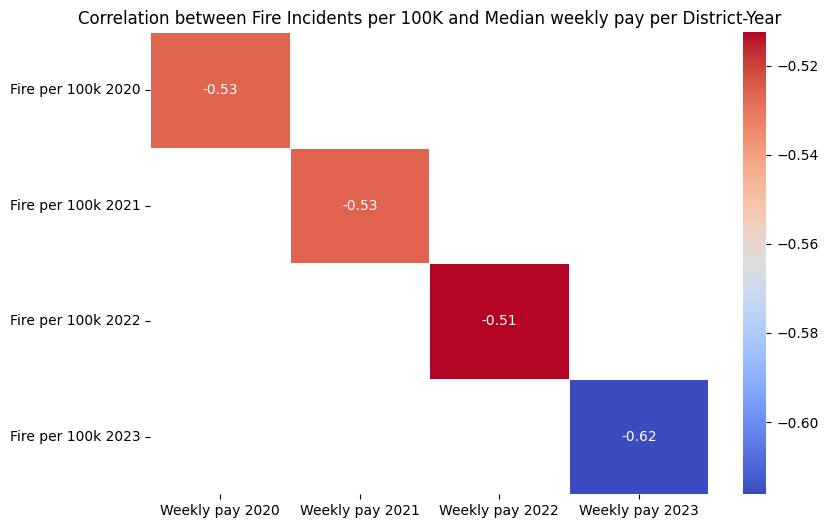

In [ ]:
df = pd.DataFrame(merged_data_Weekly_pay)

# Create a new DataFrame for correlation analysis, focusing on pairs for each year
df_corr = df.pivot(index='District-Year', columns='Year', values=['Fire_100k (16-64 year) Population_normalized', 'Median weekly pay (normalized)'])

# Calculate the correlation matrix
corr_matrix = df_corr.corr()

# We are interested in correlations between Fire and Unemployment Rates for the same years
fire_cols = [col for col in corr_matrix.columns if 'Fire_100k (16-64 year) Population_normalized' in col]
pay_cols = [col for col in corr_matrix.columns if 'Median weekly pay (normalized)' in col]

# Extract the relevant correlations
corr_to_plot = corr_matrix.loc[fire_cols, pay_cols]

# Rename the columns for easier readability
corr_to_plot.columns = [f'Weekly pay {year}' for year in corr_to_plot.columns.get_level_values(1)]
corr_to_plot.index = [f'Fire per 100k {year}' for year in corr_to_plot.index.get_level_values(1)]

# Plot the heatmap
plt.figure(figsize=(9, 6))
sns.heatmap(corr_to_plot, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation between Fire Incidents per 100K and Median weekly pay per District-Year')
plt.show()


In [ ]:
df_corr.head()

Fire_100k (16-64 year) Population_normalized            \
Year                                                    2020      2021   
District-Year                                                            
Birmingham-2020                                     1.000000       NaN   
Birmingham-2021                                          NaN  0.845445   
Birmingham-2022                                          NaN       NaN   
Birmingham-2023                                          NaN       NaN   
Coventry-2020                                       0.293991       NaN   

                                    Median weekly pay (normalized)            \
Year                 2022      2023                           2020      2021   
District-Year                                                                  
Birmingham-2020       NaN       NaN                       0.128311       NaN   
Birmingham-2021       NaN       NaN                            NaN  0.211416   
Birmingham-2022  0.857519       NaN                            NaN       NaN   
Birmingham-2023       NaN  0.690889                            NaN       NaN   
Coventry-2020         NaN       NaN                       0.198174       NaN   

                                     
Year                 2022      2023  
District-Year                        
Birmingham-2020       NaN       NaN  
Birmingham-2021       NaN       NaN  
Birmingham-2022  0.367123       NaN  
Birmingham-2023       NaN  0.490868  
Coventry-2020         NaN       NaN

In [ ]:
merged_data_inactivity.to_excel( 'merged_data_inactivity.xlsx', index=False)

In [ ]:
merged_data_Unemployment.to_excel( 'merged_data_Unemployment.xlsx', index=False)

In [ ]:
merged_data_Weekly_pay.to_excel( 'merged_data_Weekly_pay.xlsx', index=False)

In [ ]:
merged_data.to_excel( 'merged_data.xlsx', index=False)

#**Private Rental Rate**#

In [ ]:
Private_rent_data= pd.read_excel(path+'Private rents and annual inflation.xlsx', sheet_name='data', header=7)

In [ ]:
Private_rent_data.head()

,Time period,Area code,Area name,Region or country name,Annual change (%),Rental price (£)
0,2015-01-01,E06000001,Hartlepool,North East,[x],468
1,2015-02-01,E06000001,Hartlepool,North East,[x],468
2,2015-03-01,E06000001,Hartlepool,North East,[x],467
3,2015-04-01,E06000001,Hartlepool,North East,[x],466
4,2015-05-01,E06000001,Hartlepool,North East,[x],465


In [ ]:
# Filter based on unique districts
Private_rent_data_filtered = Private_rent_data[Private_rent_data['Area name'].isin(unique_districts)]
# Filter based on year (2019-2023)
Private_rent_data_filtered['Year'] = Private_rent_data_filtered['Time period'].dt.year
df_grouped = Private_rent_data_filtered.groupby(['Area code', 'Area name', 'Year']).agg({'Rental price (£)': 'mean'}).reset_index()
df_grouped.rename(columns={'Rental price (£)': 'Rental_Price_Value'}, inplace=True)
Private_rent_filtered = df_grouped[(df_grouped['Year'] > 2019) & (df_grouped['Year'] <= 2023)]
#Normalise Rental_Price_Value
Private_rent_filtered['Rental_Price_Value (normalized)'] = scaler.fit_transform(Private_rent_filtered[['Rental_Price_Value']])

<ipython-input-93-2b53b87f606f>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Private_rent_data_filtered['Year'] = Private_rent_data_filtered['Time period'].dt.year
<ipython-input-93-2b53b87f606f>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Private_rent_filtered['Rental_Price_Value (normalized)'] = scaler.fit_transform(Private_rent_filtered[['Rental_Price_Value']])


In [ ]:
# Reshape Private_rent data
Private_rent_filtered = Private_rent_filtered.rename(columns={'Area name': 'District'})
Private_rent_filtered = Private_rent_filtered[['District', 'Year', 'Rental_Price_Value (normalized)']]
Private_rent_filtered.head()

,District,Year,Rental_Price_Value (normalized)
5,Birmingham,2020,0.388737
6,Birmingham,2021,0.422381
7,Birmingham,2022,0.486743
8,Birmingham,2023,0.633754
15,Coventry,2020,0.317060


#Plotting trend of fire incidents per 100k Population and Private Rental Rate #

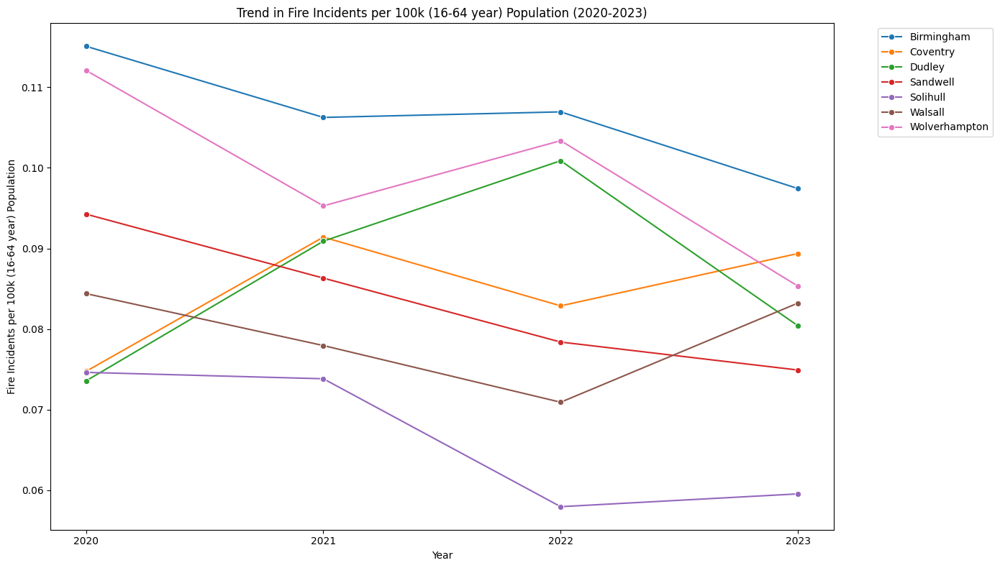

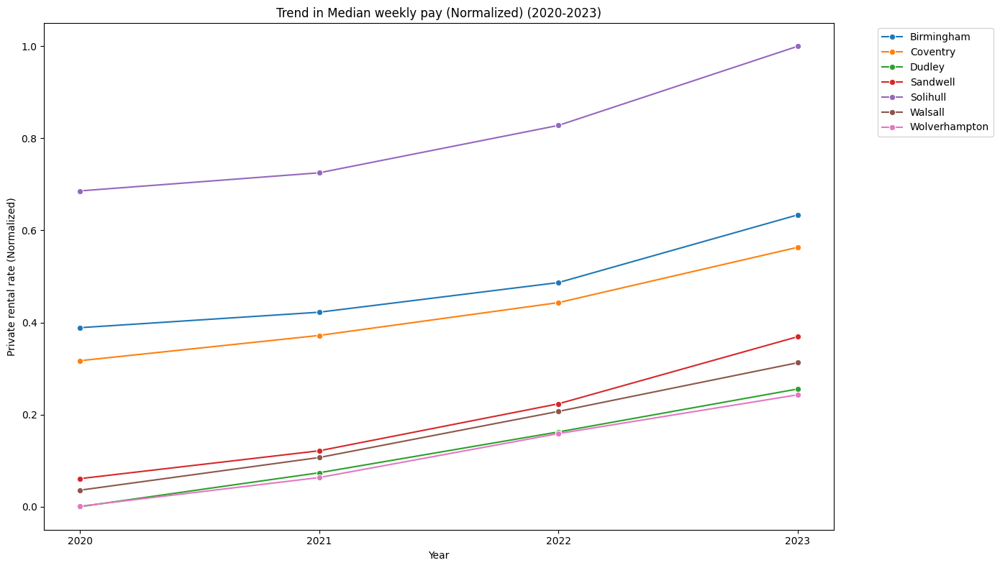

In [ ]:
# Filter Private_rent_filtered
Private_rent_filtered_filtered = Private_rent_filtered[['District', 'Year', 'Rental_Price_Value (normalized)']]

# Merge the reshaped dataframes
merged_Private_rent_rate = pd.merge(fire_data, Private_rent_filtered_filtered, on=['District', 'Year'])

# Filter to show only data for years 2020, 2021, 2022, and 2023
merged_Private_rent_filtered = merged_Private_rent_rate[merged_Private_rent_rate['Year'].isin([2020, 2021, 2022, 2023])]

# Plotting
plt.figure(figsize=(14, 8))

# Plot for Fire incidents per 100k (16-64 year) Population
sns.lineplot(data=merged_Private_rent_filtered, x='Year', y='Fire_100k (16-64 year) Population', hue='District', marker='o')
plt.title('Trend in Fire Incidents per 100k (16-64 year) Population (2020-2023)')
plt.xlabel('Year')
plt.ylabel('Fire Incidents per 100k (16-64 year) Population')
plt.xticks([2020, 2021, 2022, 2023])  # Set the x-axis ticks to only show the specified years
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# Plot for Private rental rate (normalized)
plt.figure(figsize=(14, 8))
sns.lineplot(data=merged_Private_rent_filtered, x='Year', y='Rental_Price_Value (normalized)', hue='District', marker='o')
plt.title('Trend in Median weekly pay (Normalized) (2020-2023)')
plt.xlabel('Year')
plt.ylabel('Private rental rate (Normalized)')
plt.xticks([2020, 2021, 2022, 2023])  # Set the x-axis ticks to only show the specified years
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [ ]:
merged_Private_rent_rate.head()

,District,Year,Fire_100k (16-64 year) Population,Rental_Price_Value (normalized)
0,Birmingham,2020,0.115093,0.388737
1,Coventry,2020,0.074748,0.317060
2,Dudley,2020,0.073564,0.000000
3,Sandwell,2020,0.094256,0.060889
4,Solihull,2020,0.074618,0.685866


#Combined trend of **NORMALISED** fire incidents per 100k Population and Private Rental Rate#

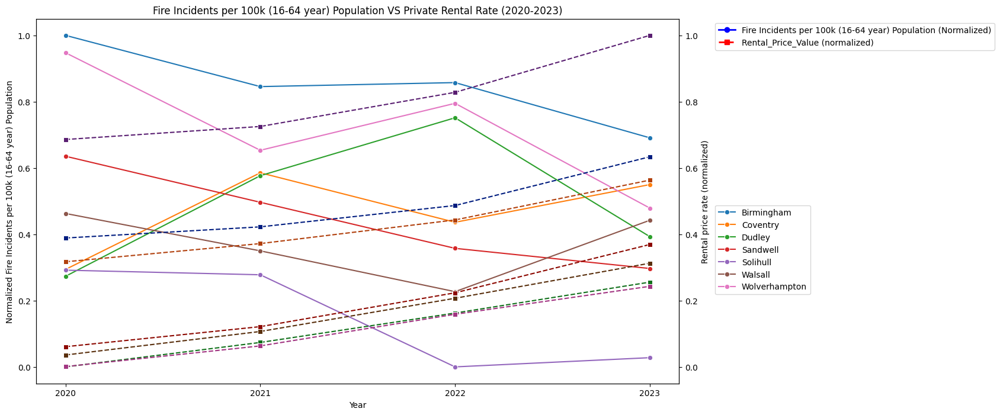

In [ ]:
# Normalize Fire_100k (16-64 year) Population
scaler = MinMaxScaler()
merged_Private_rent_rate['Fire_100k (16-64 year) Population_normalized'] = scaler.fit_transform(merged_Private_rent_rate[['Fire_100k (16-64 year) Population']])

# Plotting
fig, ax1 = plt.subplots(figsize=(14, 8))

# Line plot for normalized Fire incidents per 100k (16-64 year) Population
sns.lineplot(data=merged_Private_rent_rate, x='Year', y='Fire_100k (16-64 year) Population_normalized', hue='District', marker='o', linestyle='-', ax=ax1, palette='tab10')
ax1.set_xlabel('Year')
ax1.set_ylabel('Normalized Fire Incidents per 100k (16-64 year) Population')
ax1.set_title('Fire Incidents per 100k (16-64 year) Population VS Private Rental Rate (2020-2023)')

# Create a second y-axis for Private_rent_rate (normalized)
ax2 = ax1.twinx()
sns.lineplot(data=merged_Private_rent_rate, x='Year', y='Rental_Price_Value (normalized)', hue='District', marker='s', linestyle='--', ax=ax2, palette='dark', legend=False)
ax2.set_ylabel('Rental price rate (normalized)')

# Create custom legend
custom_lines = [plt.Line2D([0], [0], color='b', lw=2, linestyle='-', marker='o'),
                plt.Line2D([0], [0], color='r', lw=2, linestyle='--', marker='s')]
ax2.legend(custom_lines, ['Fire Incidents per 100k (16-64 year) Population (Normalized)', 'Rental_Price_Value (normalized)'], loc='upper left', bbox_to_anchor=(1.05, 1))

# Adjust legend for districts
handles1, labels1 = ax1.get_legend_handles_labels()
ax1.legend(handles1, labels1, loc='upper left', bbox_to_anchor=(1.05, 0.5))
plt.xticks([2020, 2021, 2022, 2023])

plt.show()

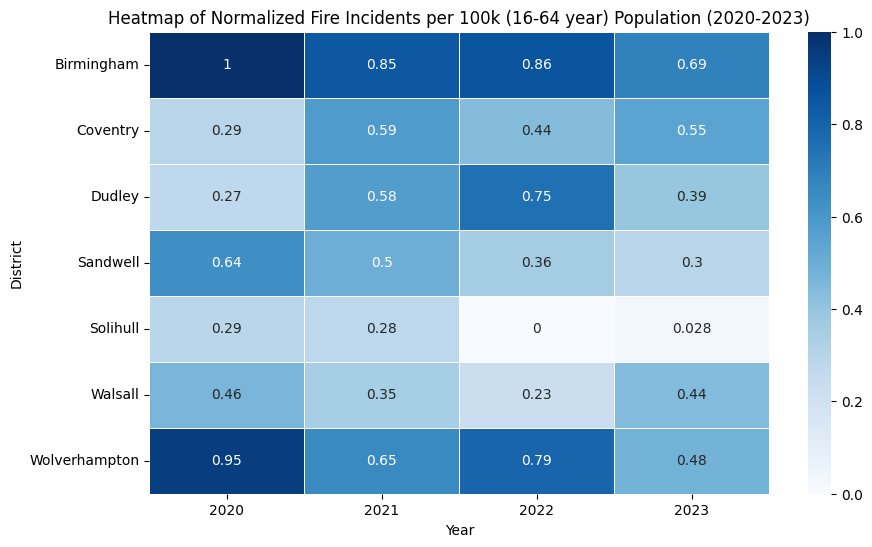

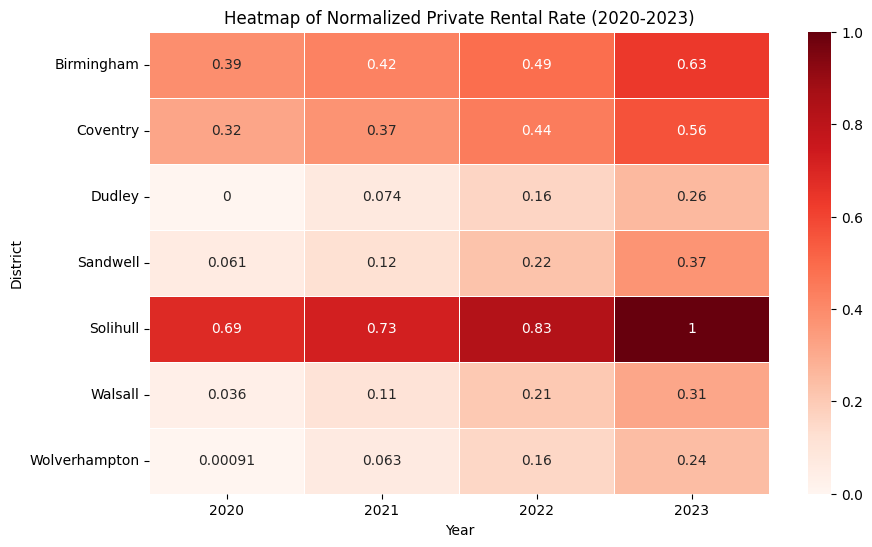

In [ ]:
# Pivot data for heatmaps
# For Fire Incidents per 100k Population (Normalized)
fire_heatmap_data = merged_Private_rent_rate.pivot(index='District', columns='Year', values='Fire_100k (16-64 year) Population_normalized')

# For Private Rental Rate (Normalized)
Rental_pay_heatmap_data = merged_Private_rent_rate.pivot(index='District', columns='Year', values='Rental_Price_Value (normalized)')

# Create heatmap for Fire Incidents
plt.figure(figsize=(10, 6))
sns.heatmap(fire_heatmap_data, annot=True, cmap='Blues', linewidths=0.5)
plt.title('Heatmap of Normalized Fire Incidents per 100k (16-64 year) Population (2020-2023)')
plt.xlabel('Year')
plt.ylabel('District')
plt.show()

# Create heatmap for Private Rental Rate
plt.figure(figsize=(10, 6))
sns.heatmap(Rental_pay_heatmap_data, annot=True, cmap='Reds', linewidths=0.5)
plt.title('Heatmap of Normalized Private Rental Rate (2020-2023)')
plt.xlabel('Year')
plt.ylabel('District')
plt.show()


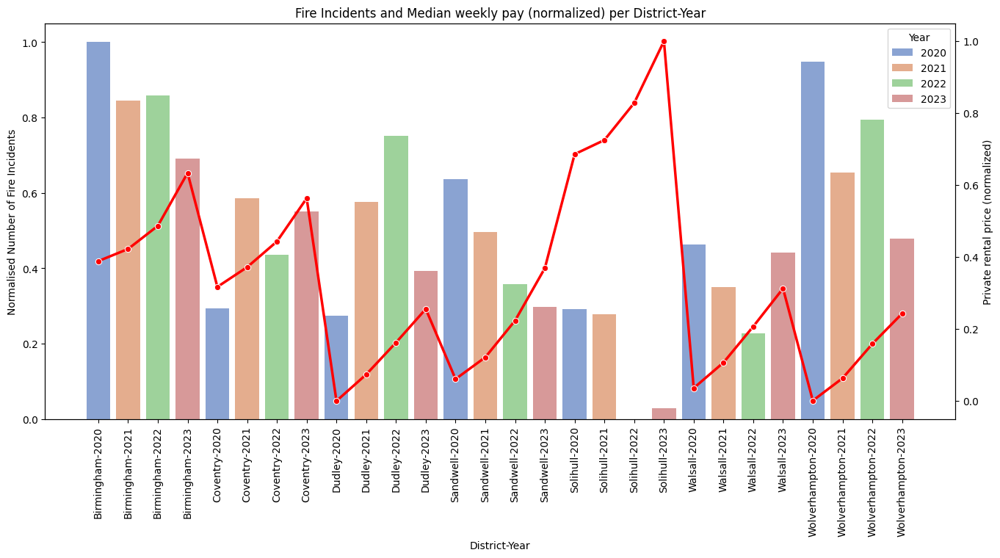

In [ ]:
# Create a new column to represent district-year
merged_Private_rent_rate['District-Year'] = merged_Private_rent_rate['District'] + '-' + merged_Private_rent_rate['Year'].astype(str)

# Sort the data by District and then by Year
df_x = merged_Private_rent_rate.sort_values(by=['District', 'Year'])

# Create a bar plot for fire incidents
fig, ax1 = plt.subplots(figsize=(16, 7))
sns.barplot(x='District-Year', y='Fire_100k (16-64 year) Population_normalized', data=df_x , ax=ax1, palette='muted', alpha=0.7, hue='Year')
ax1.set_xlabel('District-Year')
ax1.set_ylabel('Normalised Number of Fire Incidents')
ax1.set_title('Fire Incidents and Median weekly pay (normalized) per District-Year')
plt.xticks(rotation=90)

# Line plot for merged_data_Unemployment rate score
ax2 = ax1.twinx()
sns.lineplot(x='District-Year', y='Rental_Price_Value (normalized)', data=df_x , ax=ax2, color='red', linewidth=2.5, marker='o', sort=False)
ax2.set_ylabel('Private rental price (normalized)')

plt.show()

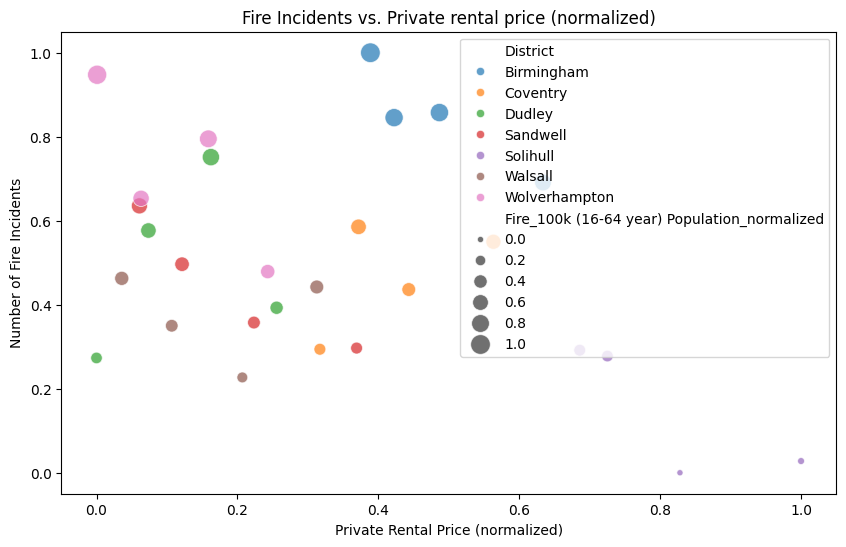

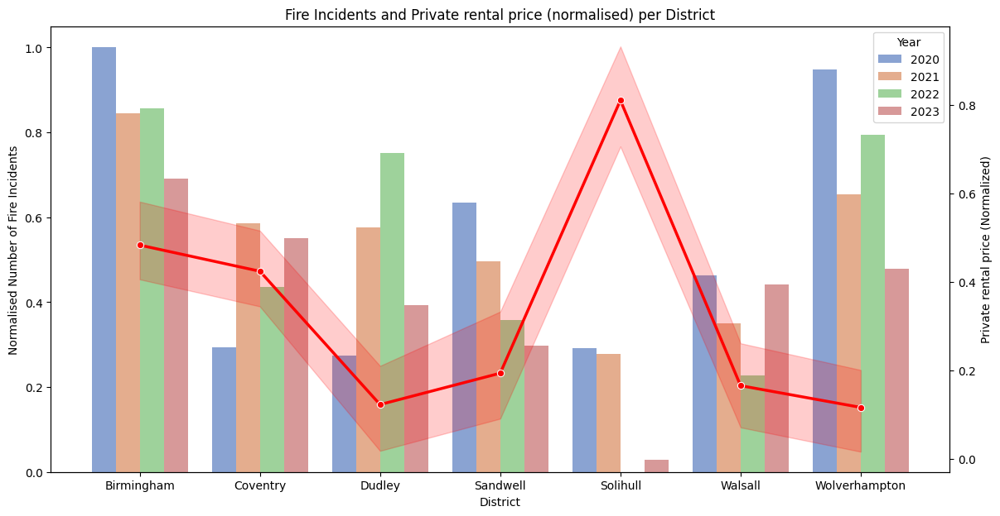

In [ ]:
# Scatter Plot: Fire Incidents vs. Rental price
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Rental_Price_Value (normalized)', y='Fire_100k (16-64 year) Population_normalized', hue='District', size='Fire_100k (16-64 year) Population_normalized', sizes=(20, 200), data=merged_Private_rent_rate, alpha=0.7)

plt.title('Fire Incidents vs. Private rental price (normalized)')
plt.xlabel('Private Rental Price (normalized)')
plt.ylabel('Number of Fire Incidents')
plt.show()

# Combined Bar and Line Chart
fig, ax1 = plt.subplots(figsize=(14, 7))

# Bar plot for fire incidents
sns.barplot(x='District', y='Fire_100k (16-64 year) Population_normalized', hue='Year', data=merged_Private_rent_rate, ax=ax1, palette='muted', alpha=0.7)
ax1.set_xlabel('District')
ax1.set_ylabel('Normalised Number of Fire Incidents')
ax1.set_title('Fire Incidents and Private rental price (normalised) per District')

# Line plot for Median weekly pay (normalized)
ax2 = ax1.twinx()
sns.lineplot(x='District', y='Rental_Price_Value (normalized)', data=merged_Private_rent_rate, ax=ax2, color='red', linewidth=2.5, marker='o', sort=False)
ax2.set_ylabel('Private rental price (Normalized)')

plt.show()

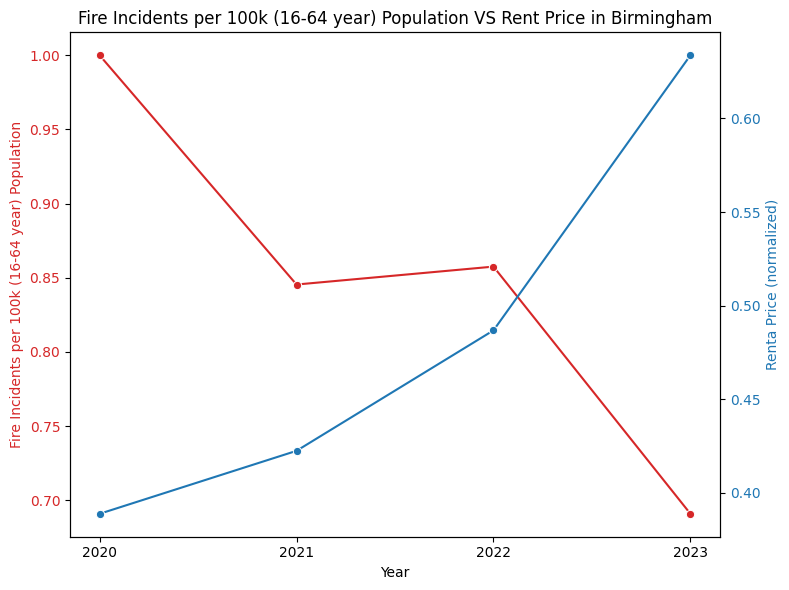

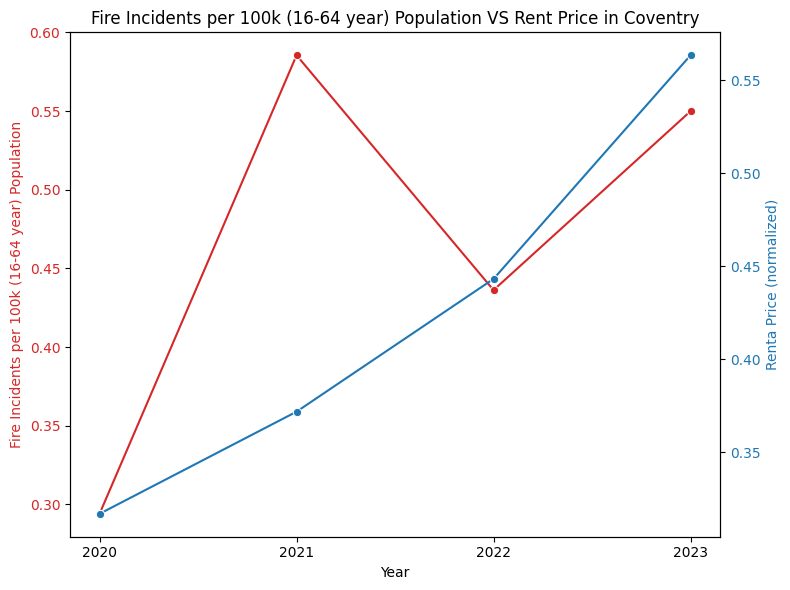

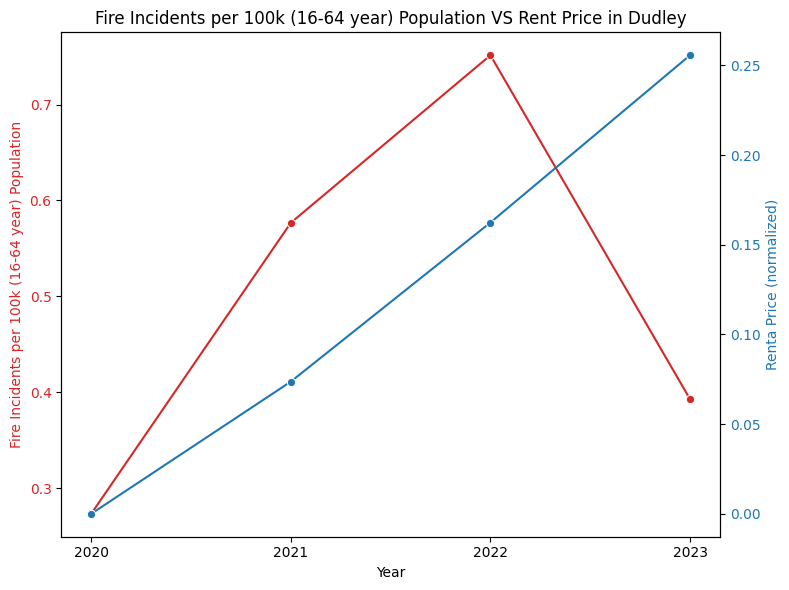

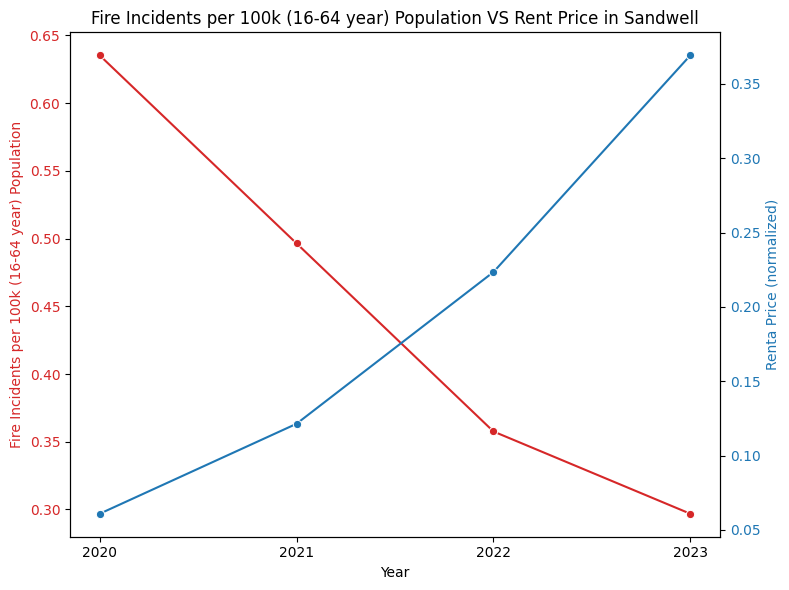

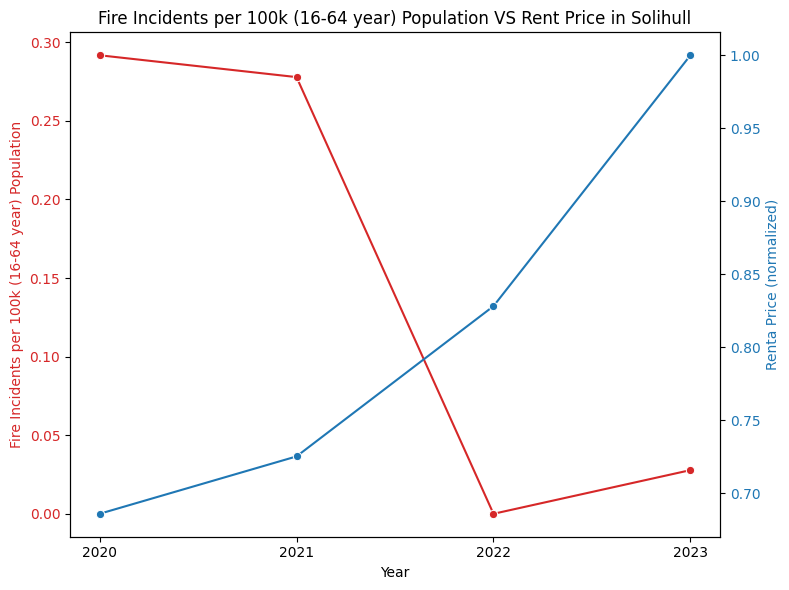

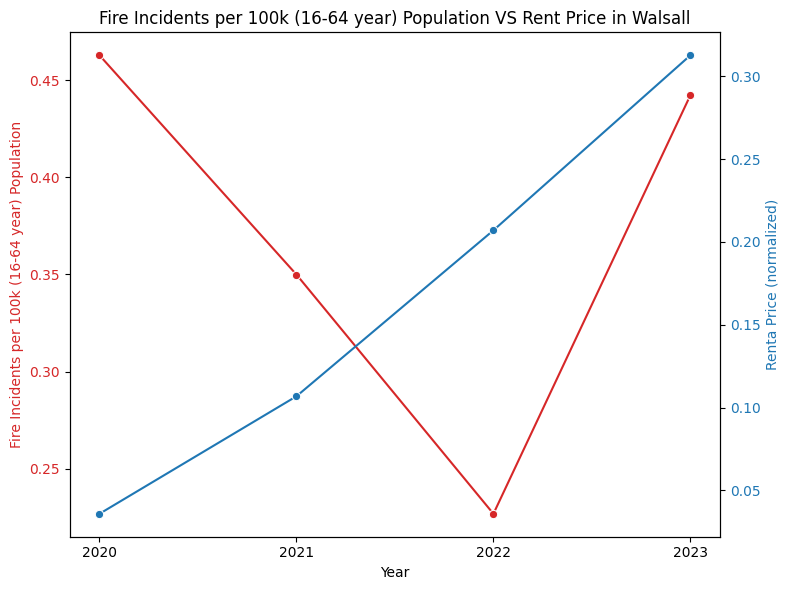

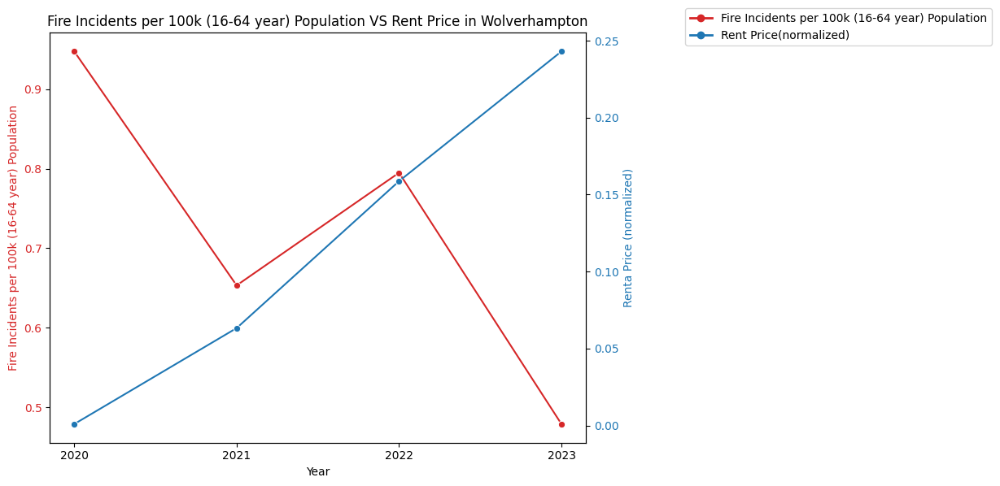

In [ ]:
#Plotting for each district

for district in districts:
    district_data = merged_Private_rent_rate[merged_Private_rent_rate['District'] == district]

    fig, ax1 = plt.subplots(figsize=(8, 6))

    color = 'tab:red'
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Fire Incidents per 100k (16-64 year) Population', color=color)
    sns.lineplot(data=district_data, x='Year', y='Fire_100k (16-64 year) Population_normalized', marker='o', ax=ax1, color=color, legend=False)  # Disable automatic legend
    ax1.tick_params(axis='y', labelcolor=color)

    # Second y-axis: Rental Price Value
    ax2 = ax1.twinx()
    color = 'tab:blue'
    ax2.set_ylabel('Renta Price (normalized)', color=color)
    sns.lineplot(data=district_data, x='Year', y='Rental_Price_Value (normalized)', marker='o', ax=ax2, color=color, legend=False)  # Disable automatic legend
    ax2.tick_params(axis='y', labelcolor=color)


    # Create custom legend handles
    legend_handles = [Line2D([0], [0], color='tab:red', lw=2, marker='o', label='Fire Incidents per 100k (16-64 year) Population'),
                      Line2D([0], [0], color='tab:blue', lw=2, marker='o', label='Rent Price(normalized)')]

    plt.title(f'Fire Incidents per 100k (16-64 year) Population VS Rent Price in {district}')
    plt.xticks([2020, 2021, 2022, 2023])
    fig.tight_layout()
fig.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


***Using The same scale Unit for both Y- axis (Normalised Fire Incidents and Rent price) [maybe not needed]***

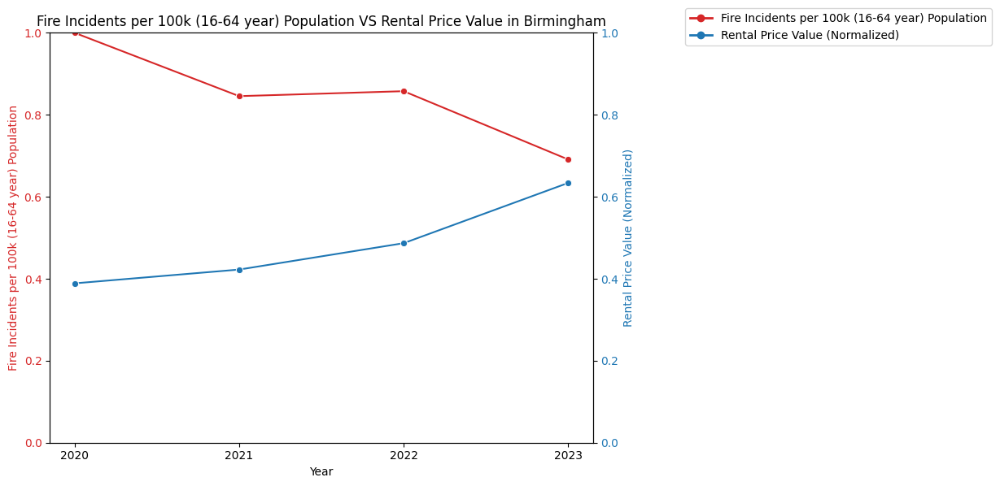

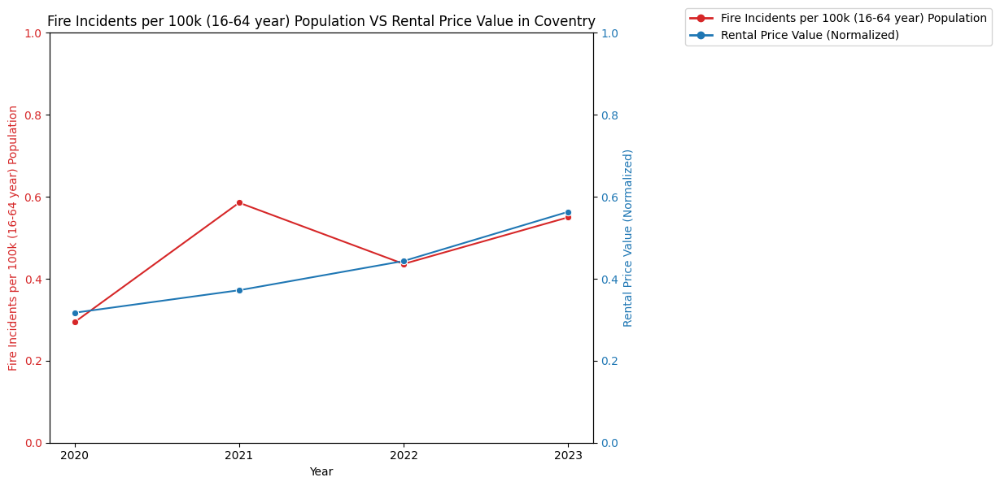

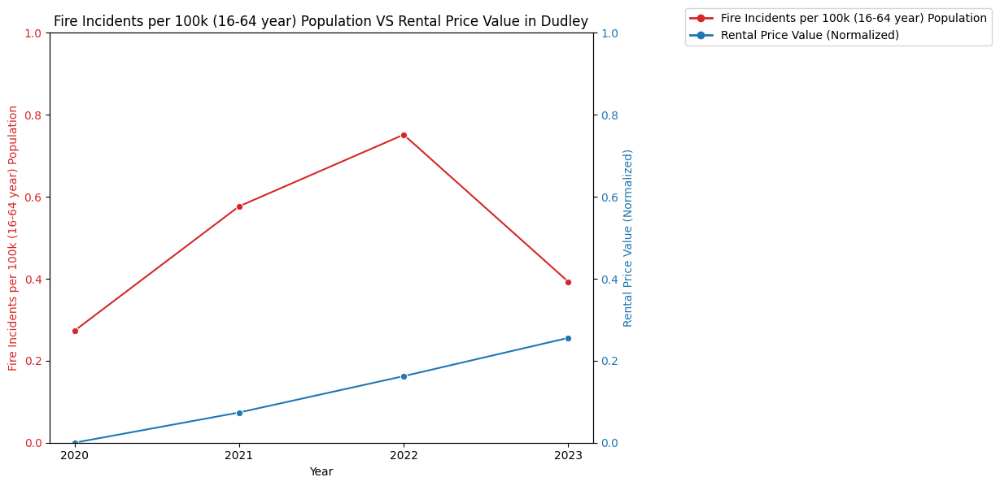

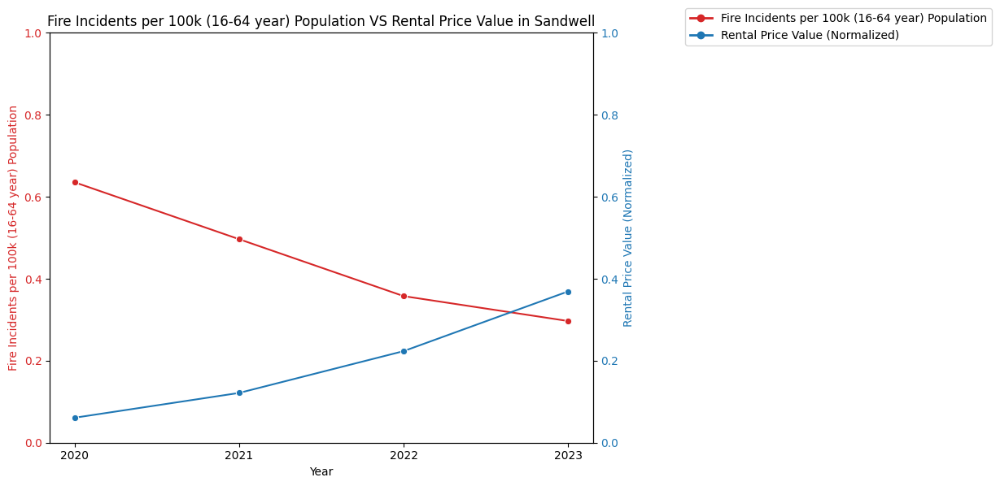

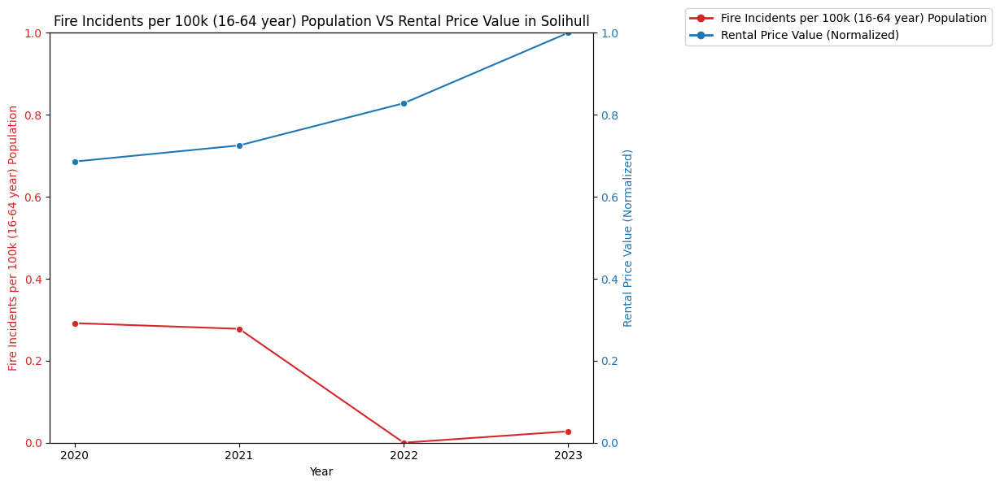

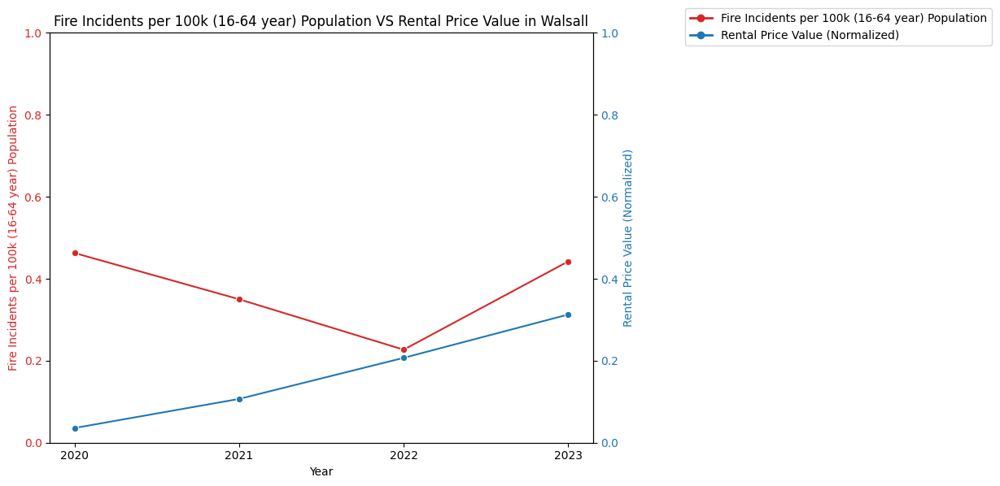

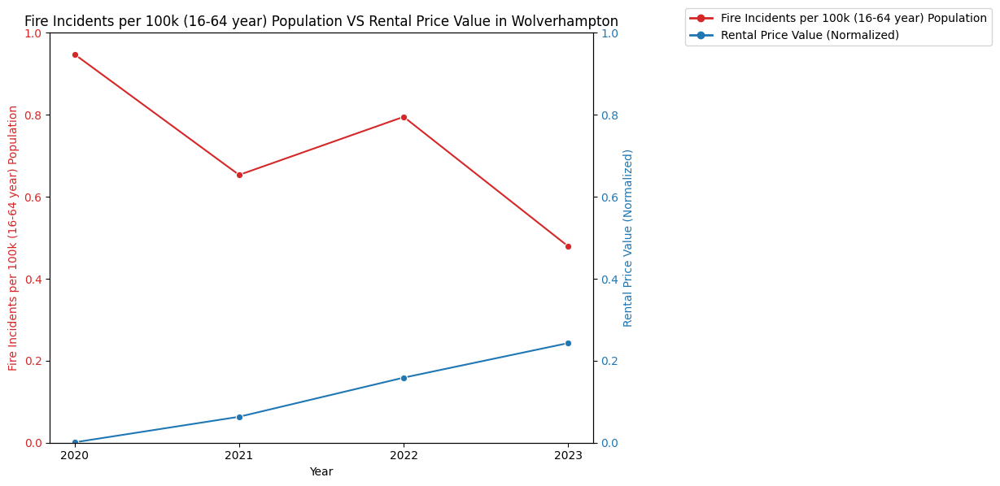

In [ ]:
from matplotlib.lines import Line2D

for district in districts:
    district_data = merged_Private_rent_rate[merged_Private_rent_rate['District'] == district]

    fig, ax1 = plt.subplots(figsize=(8, 6))

    # First y-axis: Fire incidents
    color = 'tab:red'
    ax1.set_xlabel('Year')
    ax1.set_ylabel('Fire Incidents per 100k (16-64 year) Population', color=color)
    sns.lineplot(data=district_data, x='Year', y='Fire_100k (16-64 year) Population_normalized', marker='o', ax=ax1, color=color, legend=False)  # Disable automatic legend
    ax1.tick_params(axis='y', labelcolor=color)

    # Set y-axis limit for both axes to be consistent (since both are normalized)
    ax1.set_ylim(0, 1)

    # Second y-axis: Rental Price Value (Normalized)
    ax2 = ax1.twinx()
    color = 'tab:blue'
    ax2.set_ylabel('Rental Price Value (Normalized)', color=color)
    sns.lineplot(data=district_data, x='Year', y='Rental_Price_Value (normalized)', marker='o', ax=ax2, color=color, legend=False)  # Disable automatic legend
    ax2.tick_params(axis='y', labelcolor=color)

    # Set the same y-axis limit for the second axis
    ax2.set_ylim(0, 1)

    # Create custom legend handles
    legend_handles = [Line2D([0], [0], color='tab:red', lw=2, marker='o', label='Fire Incidents per 100k (16-64 year) Population'),
                      Line2D([0], [0], color='tab:blue', lw=2, marker='o', label='Rental Price Value (Normalized)')]

    # Manually add the legend with colors
    fig.legend(handles=legend_handles, bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.title(f'Fire Incidents per 100k (16-64 year) Population VS Rental Price Value in {district}')
    plt.xticks([2020, 2021, 2022, 2023])
    fig.tight_layout()
    plt.show()


In [ ]:
merged_Private_rent_rate.head()

,District,Year,Fire_100k (16-64 year) Population,Rental_Price_Value (normalized),Fire_100k (16-64 year) Population_normalized,District-Year
0,Birmingham,2020,0.115093,0.388737,1.000000,Birmingham-2020
1,Coventry,2020,0.074748,0.317060,0.293991,Coventry-2020
2,Dudley,2020,0.073564,0.000000,0.273266,Dudley-2020
3,Sandwell,2020,0.094256,0.060889,0.635363,Sandwell-2020
4,Solihull,2020,0.074618,0.685866,0.291713,Solihull-2020


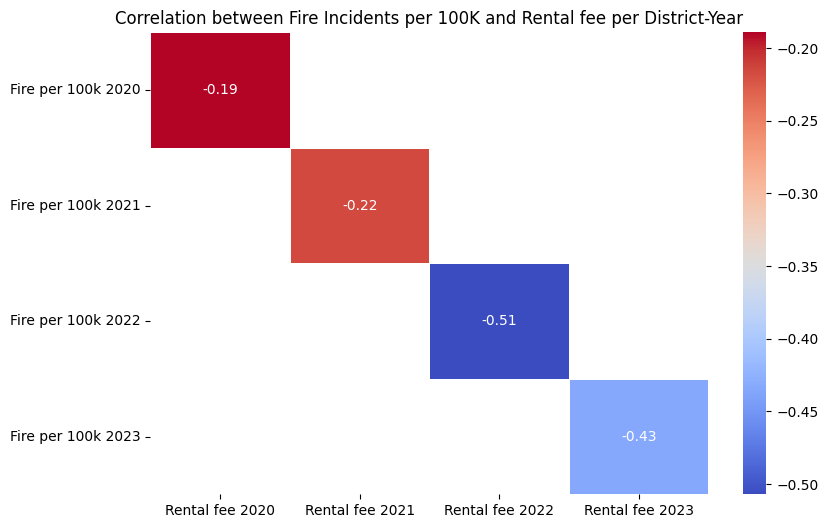

In [ ]:
df = pd.DataFrame(merged_Private_rent_rate)

# Create a new DataFrame for correlation analysis, focusing on pairs for each year
df_corr = df.pivot(index='District-Year', columns='Year', values=['Fire_100k (16-64 year) Population_normalized', 'Rental_Price_Value (normalized)'])

# Calculate the correlation matrix
corr_matrix = df_corr.corr()

# We are interested in correlations between Fire and Rent Rates for the same years
fire_cols = [col for col in corr_matrix.columns if 'Fire_100k (16-64 year) Population_normalized' in col]
pay_cols = [col for col in corr_matrix.columns if 'Rental_Price_Value (normalized)' in col]

# Extract the relevant correlations
corr_to_plot = corr_matrix.loc[fire_cols, pay_cols]

# Rename the columns for easier readability
corr_to_plot.columns = [f'Rental fee {year}' for year in corr_to_plot.columns.get_level_values(1)]
corr_to_plot.index = [f'Fire per 100k {year}' for year in corr_to_plot.index.get_level_values(1)]

# Plot the heatmap
plt.figure(figsize=(9, 6))
sns.heatmap(corr_to_plot, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation between Fire Incidents per 100K and Rental fee per District-Year')
plt.show()
